## Packages

In [18]:
import matplotlib as mpl
import matplotlib.colors as colors
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import datetime as dt
import plotly.offline as py
import matplotlib.patches as patches
import os, sys, pickle, json, time, math, re, copy, urllib, random
import matplotlib.gridspec as gridspec
import sklearn as skl
import statsmodels.api as sm

from IPython.display import display
from datetime import timedelta
from scipy import stats
from statsmodels.graphics.gofplots import qqplot
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

py.init_notebook_mode(connected=True)
pd.__version__

'0.24.2'

## General Functions

In [19]:
#Functions

#finding impact of exclusions
def num_entries(df, old_size, exclu_str):
    new_size=len(df)
    print("\nExclusion:", exclu_str)
    print("Removed: ", old_size-new_size)
    print("Remaining: ", new_size)
    return new_size



#add patches to a graph to demonstrate glucose guidelines
def add_glucose_guidlines(lim1=80, lim2=180, lim3=180, zorder=10, alpha=0.05):
    #Hypoglycaemic
    rect=patches.Rectangle((-1,0), 100, lim1, edgecolor="none", facecolor="r", alpha=alpha, zorder=zorder)
    ax.add_patch(rect)

    #Recommended
    rect=patches.Rectangle((-1,lim1), 100, lim2-lim1, edgecolor="none", facecolor="g", alpha=alpha, zorder=zorder)
    ax.add_patch(rect)
    
    #Hyperglycaemic
    rect=patches.Rectangle((-1,lim2), 100, lim3-lim2, edgecolor="none", facecolor="y", alpha=alpha, zorder=zorder)
    ax.add_patch(rect)
    
    #Very Hyperglycaemic
    rect=patches.Rectangle((-1,lim3), 100, lim3+1000, edgecolor="none", facecolor="r", alpha=alpha, zorder=zorder)
    ax.add_patch(rect)
    
    return None

#Rounding (for heatmap categories)
def myround(x, base):
    return int(base * round(float(x)/base))

#Plotting Functions
def format_daily_glc(input_df, merge_col, col_rename, map_dict):
    #Create a long-form dataframe
    df=pd.melt(frame=input_df.iloc[:,0:7].reset_index(), id_vars="index", value_name="Glucose", var_name="Day")

    #Change timestamp into integer for easier plotting, and make first day '1'
    df["Day"]=(df["Day"].dt.days.astype(int)+1)

    #join diabetic status from admissions on icustay_id
    df=df.rename(index=str, columns={"index": "icustay"})
    df=admissions[[merge_col, "icustay"]].merge(df,  "left", on="icustay")
    df=df.rename(index=str, columns={merge_col: col_rename})
    df[col_rename]=df[col_rename].map(map_dict)
    
    return df


#Clustering Functions
def euclid_dist(t1,t2):
    return np.sqrt(sum((t1-t2)**2))

def DTWDistance(s1, s2,w):
    DTW={}

    w = max(w, abs(len(s1)-len(s2)))

    for i in range(-1,len(s1)):
        for j in range(-1,len(s2)):
            DTW[(i, j)] = float('inf')
    DTW[(-1, -1)] = 0

    for i in range(len(s1)):
        for j in range(max(0, i-w), min(len(s2), i+w)):
            dist= (s1[i]-s2[j])**2
            DTW[(i, j)] = dist + min(DTW[(i-1, j)],DTW[(i, j-1)], DTW[(i-1, j-1)])

    return np.sqrt(DTW[len(s1)-1, len(s2)-1])

def LB_Keogh(s1,s2,r):
    LB_sum=0
    for ind,i in enumerate(s1):
        
        lower_bound=min(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
        upper_bound=max(s2[(ind-r if ind-r>=0 else 0):(ind+r)])
        
        if i>upper_bound:
            LB_sum=LB_sum+(i-upper_bound)**2
        elif i<lower_bound:
            LB_sum=LB_sum+(i-lower_bound)**2
    
    return np.sqrt(LB_sum)

def k_means_clust_ts(data, num_clust, num_iter, w=10):
    #create centroids
    centroids=data.sample(num_clust).reset_index().drop(["index"], axis=1)
    
    for iteration in range(num_iter):
        print("Starting iteration", iteration+1)
        assignments={}
        
        #assign series to clusters
        for index, row in data.iterrows():
            min_dist=np.inf
            closest_cluster=None
            for c_index, roid in centroids.iterrows():
                if LB_Keogh(row, roid, 5) < min_dist:
                    cur_dist=DTWDistance(row, roid, w)
                    if cur_dist < min_dist:
                        min_dist=cur_dist
                        closest_cluster=c_index
            if closest_cluster in assignments:
                assignments[closest_cluster].append(index)
            else:
                assignments[closest_cluster]=[index]

        #recalculate centroids
        for cluster in assignments:
            centroids.loc[cluster]=data.loc[assignments[cluster]].mean()
            
    return assignments, centroids

def cluster_summaries(assignments, admissions, printout=True):
    #get the in hospital death rate for each cluster
    mort_rates=[]
    for cluster in sorted(assignments):
        rate=admissions[admissions["icustay"].isin(assignments[cluster])].h_exp.mean()
        size=len(assignments[cluster])
        if printout==True: 
            print("Cluster", cluster+1, "of size", size, ", mortality rate:", round(rate*100,1),"%")
        mort_rates.append(round(rate*100,1))
    return mort_rates

def plot_clusters(data, assignments, centroids, save_fig=False):
    #Plot all Clusters
    sns.set(style="ticks")
    fig, ax = plt.subplots(1, 1, figsize = (15, 8))

    for cluster in assignments:
        for index, row in data.loc[assignments[cluster]].iterrows():
            plt.plot(row.values, color=sns.color_palette("Set1")[cluster], linewidth=0.5, alpha=0.04)
    
    mort_rates=cluster_summaries(assignments, admissions=admissions, printout=False)
    print(mort_rates)
    
    for index, row in centroids.iterrows():
        upper=data.loc[assignments[index]].quantile(0.75)
        lower=data.loc[assignments[index]].quantile(0.25)
        xrange=np.arange(data.shape[1])
        ax.fill_between(xrange, upper, lower, facecolor=sns.color_palette("Set1")[index], alpha=0.2)        
        plt.plot(row.values, color=sns.color_palette("Set1")[index], linewidth=3, label="Cluster "+str(index+1) + " Centroid. MR: "+ str(mort_rates[index])+ '%')

    
    plt.title("Blood glucose time series clusters", fontsize=20)
    plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
    plt.xlabel("Hour", fontsize=15)
    plt.xlim(0,data.shape[1]-1)
    plt.xticks(np.arange(0,data.shape[1], 12), np.arange(6,6+data.shape[1], 12))
    plt.ylim(0,400)
    plt.legend(loc="upper right")
    plt.show()
    
    if save_fig == True:
        fig.savefig('C:\Documents\Thesis\Figures\mortality_clust.png')

## Data Loading

In [20]:
#Load data
(admissions, inputs, charts, labs, icd9, sofa, blood_labs) = pickle.load(open('./processed_data/insulin_adms.pkl', 'rb'))

#Create list of ICU stays
icustays=admissions["icustay"].values.tolist()
dia_icustays=admissions.loc[admissions.diabetic==1]["icustay"].values.tolist()
no_dia_icustays=admissions.loc[admissions.diabetic==0]["icustay"].values.tolist()

#add weight data to admissions
weight_df=charts.loc[charts["item"]==226512].groupby("icustay").mean().reset_index()
weight_df=weight_df.rename(columns={"value":"weight_kg"})
admissions=admissions.merge(weight_df[["icustay","weight_kg"]], how="left", on="icustay")

blood_labs=blood_labs.set_index('charttime')
blood_labs=blood_labs.rename({'icustay_id':'icustay', 'hadm_id':'hadm'}, axis='columns')

sofa=sofa.rename({'starttime':'charttime'}, axis='columns')
sofa=sofa.set_index('charttime')

## Data cleaning and formatting

In [21]:
#Glucose measurements
#identify all glucose measurements
glucose_chart_labels = ['Glucose finger stick','Glucose (whole blood)','Glucose (serum)', 'Fingerstick Glucose',
                      'Glucose (70-105)', 'Glucose', 'Blood Glucose', 'BloodGlucose']

glucose_lab_labels = ['Glucose']


#filter just the glucose measurements
glc_charts=charts[charts['label'].isin(glucose_chart_labels)]

#need to add in labs
glc_labs=labs[labs['label'].isin(glucose_lab_labels)]

#join the tables
glc_measurements=pd.concat([glc_charts, glc_labs])

#add in the icu entry and discharge times from admissions
glc_measurements=admissions[["icustay","icu_admit", "icu_discharge"]].merge(glc_measurements, "right")

#convert to datetime
for col in ["icu_admit", "icu_discharge", "charttime"]:
    glc_measurements[col]=pd.to_datetime(glc_measurements[col])

#create relative time (in days)
#glc_measurements["icu_time"]=(glc_measurements["charttime"]-glc_measurements["icu_admit"]).dt.seconds/3600/24+(glc_measurements["charttime"]-glc_measurements["icu_admit"]).dt.days
glc_measurements["icu_time"]=(glc_measurements["charttime"]-glc_measurements["icu_admit"])


old_size=len(glc_measurements)
#drop bad IDs
glc_measurements=glc_measurements.loc[glc_measurements.item != 51478]
old_size=num_entries(glc_measurements, old_size, "Drop ID 51478")

glc_measurements=glc_measurements.loc[glc_measurements.item != 50809]
old_size=num_entries(glc_measurements, old_size, "Drop ID 50809")

glc_measurements=glc_measurements.loc[glc_measurements.item != 50931]
old_size=num_entries(glc_measurements, old_size, "Drop ID 50931")

#Define Glucose types
glc_dict={225664: "Fingerstick", 220621: "Serum", 1529: "Serum",
         811: "Serum", 807: "Fingerstick", 50931: "Serum", 226537: "Serum",
          50809: "Serum"}

glc_measurements["type"]= glc_measurements["item"].map(glc_dict)

#drop errors
glc_measurements=glc_measurements.drop(glc_measurements.loc[glc_measurements.error==1].index)
old_size=num_entries(glc_measurements, old_size, "Drop error entries")

#drop duplicated values
glc_measurements=glc_measurements.drop_duplicates(["icu_time", "icustay", "value", "type"],keep= 'first')
old_size=num_entries(glc_measurements, old_size, "Drop duplicates")

#drop missing values
glc_measurements=glc_measurements.dropna(subset=["value"])
old_size=num_entries(glc_measurements, old_size, "Drop missing amount values")

#drop measurements that occur before or after stay
glc_measurements=glc_measurements[glc_measurements.charttime > glc_measurements.icu_admit]
glc_measurements=glc_measurements[glc_measurements.charttime < glc_measurements.icu_discharge]
old_size=num_entries(glc_measurements, old_size, "Drop timestamp before / after stay")

#set index as the time after entry
glc_measurements=glc_measurements.set_index("icu_time")

#sort in order
glc_measurements=glc_measurements.sort_values(by=["icustay", "charttime"])

#remove values over 1000 for glucose measurements
glc_measurements=glc_measurements.drop(glc_measurements.loc[(glc_measurements.label.str.contains("Glucose")) & (glc_measurements.value>1000)].index)
old_size=num_entries(glc_measurements, old_size, "Values over or equal to 1000")

#remove values which are too low (<10) for glucose measurements
glc_measurements=glc_measurements.drop(glc_measurements.loc[(glc_measurements.label.str.contains("Glucose")) & (glc_measurements.value<=10)].index)
old_size=num_entries(glc_measurements, old_size, "Values under 10")

#remove values over 499 for fingersrick measurements
glc_measurements=glc_measurements.drop(glc_measurements.loc[(glc_measurements.label.isin(["Fingerstick Glucose", "Glucose finger stick"])) & (glc_measurements.value>=499)].index)
old_size=num_entries(glc_measurements, old_size, "Fingerstick value over 499")

#drop error and warning columns
glc_measurements=glc_measurements.drop(['warning', 'error'], axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:16: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.





Exclusion: Drop ID 51478
Removed:  22188
Remaining:  789017

Exclusion: Drop ID 50809
Removed:  62437
Remaining:  726580

Exclusion: Drop ID 50931
Removed:  277674
Remaining:  448906

Exclusion: Drop error entries
Removed:  3002
Remaining:  445904

Exclusion: Drop duplicates
Removed:  5754
Remaining:  440150

Exclusion: Drop missing amount values
Removed:  19
Remaining:  440131

Exclusion: Drop timestamp before / after stay
Removed:  1276
Remaining:  438855

Exclusion: Values over or equal to 1000
Removed:  68
Remaining:  438787

Exclusion: Values under 10
Removed:  172
Remaining:  438615

Exclusion: Fingerstick value over 499
Removed:  204
Remaining:  438411


In [22]:
#Set the end_timestamp equal to the start_timestamp for overlapping inputs
def align_overlaps(df, print_mods=True):
    #find column locations for needed columns
    start_iloc = df.columns.get_loc('input_start')
    end_iloc = df.columns.get_loc('input_end')
    icustay_iloc = df.columns.get_loc('icustay')
    
    #initate the mod count
    mod_count=0
    
    #loop throgh each line
    for i in range(1, len(df)):
        #check that we aren't starting a new icustay
        if df.iat[i-1, icustay_iloc] == df.iat[i, icustay_iloc]:
            curr_input_end= df.iat[i-1, end_iloc]
            next_input_start= df.iat[i, start_iloc]
            #if there is an overlap then change the end of the current input
            if curr_input_end > next_input_start:
                df.iat[i-1, end_iloc] = next_input_start
                mod_count+=1
                
    if print_mods==True:
        print ("Number of modifications made", mod_count)
        
    return df

In [23]:
#Insulin inputs
insulin_inputs=inputs.loc[(inputs.label.str.contains("Insulin"))]

insulin_inputs=admissions[["icustay","icu_admit", "icu_discharge"]].merge(insulin_inputs, "right", on="icustay")

#convert to datetime
for col in ["input_start", "input_end", "icu_admit", "icu_discharge"]:
    insulin_inputs[col]=pd.to_datetime(insulin_inputs[col])

#create relative time (in days)
insulin_inputs["icu_time"]=(insulin_inputs["input_start"]-insulin_inputs["icu_admit"])

#Insulin administration type
insulin_inputs["delivery"]="Bolus"
insulin_inputs.loc[(insulin_inputs.totalamountuom=='ml'),"delivery"]="Infusion"

old_size=len(insulin_inputs)
print("Original Length", old_size)

#drop errors
insulin_inputs=insulin_inputs.drop(insulin_inputs.loc[insulin_inputs.status=='Rewritten'].index)
old_size=num_entries(insulin_inputs, old_size, "Drop Errors")

#drop duplicated values
insulin_inputs=insulin_inputs.drop_duplicates(["icu_time", "icustay", "amount", "item", "delivery", "input_start", "input_end"], keep= 'last')
old_size=num_entries(insulin_inputs, old_size, "Drop Duplicates")

#drop bolus with missing data
insulin_inputs=insulin_inputs.drop(insulin_inputs[np.isnan((insulin_inputs.amount))&(insulin_inputs.delivery=="Bolus")].index)
old_size=num_entries(insulin_inputs, old_size, "Drop Boluses with missing amount data")
#drop infusions with missing data
insulin_inputs=insulin_inputs.drop(insulin_inputs[np.isnan((insulin_inputs.rate))&(insulin_inputs.delivery=="Infusion")].index)
old_size=num_entries(insulin_inputs, old_size, "Drop Infusions with missing rate data")


#drop measurements that occur before or after stay
insulin_inputs=insulin_inputs[insulin_inputs.input_start > insulin_inputs.icu_admit]
insulin_inputs=insulin_inputs[insulin_inputs.input_start < insulin_inputs.icu_discharge]
old_size=num_entries(insulin_inputs, old_size, "Drop timestamp before/after stay")

#add in type data
insulin_type_dict={223260: "Long", 223262: "Short", 223258: "Short",
         223257: "Intermediate", 223259: "Intermediate", 223261: "Intermediate"}

insulin_inputs["type"]= insulin_inputs["item"].map(insulin_type_dict)

#show number split
print("Number of Bolus:", len(insulin_inputs.loc[insulin_inputs.delivery=="Bolus"]))
print("Number of Infusion:", len(insulin_inputs.loc[insulin_inputs.delivery=="Infusion"]))

      
#drop values which are too small or too large
#drop negative or zero boluses
insulin_inputs=insulin_inputs.drop(insulin_inputs.loc[(insulin_inputs["amount"]<=0)&(insulin_inputs["delivery"]=="Bolus")].index)
old_size=num_entries(insulin_inputs, old_size, "Drop negative or zero bolus values")
#drop negative infusion amounts 
insulin_inputs=insulin_inputs.drop(insulin_inputs.loc[(insulin_inputs.rate<=0)&(insulin_inputs["delivery"]=="Infusion")].index)
old_size=num_entries(insulin_inputs, old_size, "Drop Negative infusion amounts")
#drop short boluses over 40U
insulin_inputs=insulin_inputs.drop(insulin_inputs[(insulin_inputs.amount>40)&(insulin_inputs.type=="Short")&(insulin_inputs.delivery=="Bolus")].index)
old_size=num_entries(insulin_inputs, old_size, "Drop Boluses over 40 Units")
#drop infusions over 20/hr
insulin_inputs=insulin_inputs.drop(insulin_inputs[(insulin_inputs.rate>20)&(insulin_inputs.delivery=="Infusion")].index)
old_size=num_entries(insulin_inputs, old_size, "Drop Infusions over 20 Units /hr")

#insulin_bolus
insulin_bolus=insulin_inputs.loc[insulin_inputs.delivery=="Bolus"]

#Insulin Infusions
insulin_infusion=insulin_inputs.loc[(insulin_inputs.delivery=="Infusion")]

old_size=len(insulin_infusion)
insulin_infusion.sort_values(by=["icustay", "input_start" , "input_end"], ascending=[True, True, True])
insulin_infusion=insulin_infusion.drop_duplicates(["icu_time", "icustay", "item", "delivery", "input_start"], keep= 'last')
old_size=num_entries(insulin_infusion, old_size, "Drop Duplicates (from infusion controls)")

#align
print("\n")
insulin_infusion=align_overlaps(insulin_infusion)

#Create variable for length of infusion
insulin_infusion.loc[:,"length_hr"]=insulin_infusion["input_end"]-insulin_infusion["input_start"]
#convert time difference into hours
insulin_infusion.loc[:,"length_hr"]=24*(insulin_infusion["length_hr"].dt.days+insulin_infusion["length_hr"].dt.seconds/3600/24)

#drop zero/short length infusions
insulin_infusion=insulin_infusion.drop(insulin_infusion.loc[(insulin_infusion["length_hr"]<=(1/60))].index)
old_size=num_entries(insulin_infusion, old_size, "Drop Infusions with less than 1 minute length")

#establish the real amount delivered
insulin_infusion["raw_amount"]=insulin_infusion["amount"]
insulin_infusion["amount"]=insulin_infusion["rate"]*insulin_infusion["length_hr"]

#reconstruct insulin_inputs
insulin_inputs=pd.concat([insulin_infusion, insulin_bolus], sort=False).sort_index()

#drop unneeded columns
insulin_bolus=insulin_bolus.drop(['rate', 'rateuom', 'totalamount', 'totalamountuom'], axis=1)

print("\n final size:", len(insulin_inputs))

Original Length 188018

Exclusion: Drop Errors
Removed:  14964
Remaining:  173054

Exclusion: Drop Duplicates
Removed:  0
Remaining:  173054

Exclusion: Drop Boluses with missing amount data
Removed:  0
Remaining:  173054

Exclusion: Drop Infusions with missing rate data
Removed:  1525
Remaining:  171529

Exclusion: Drop timestamp before/after stay
Removed:  24406
Remaining:  147123
Number of Bolus: 103324
Number of Infusion: 43799

Exclusion: Drop negative or zero bolus values
Removed:  3302
Remaining:  143821

Exclusion: Drop Negative infusion amounts
Removed:  0
Remaining:  143821

Exclusion: Drop Boluses over 40 Units
Removed:  38
Remaining:  143783

Exclusion: Drop Infusions over 20 Units /hr
Removed:  1135
Remaining:  142648

Exclusion: Drop Duplicates (from infusion controls)
Removed:  0
Remaining:  42664


Number of modifications made 30

Exclusion: Drop Infusions with less than 1 minute length
Removed:  206
Remaining:  42458

 final size: 142442


In [24]:
#Dextrose inputs
dextrose_inputs=inputs.loc[(inputs.label.str.contains("Dextrose"))]
dextrose_inputs=admissions[["icustay","icu_admit", "icu_discharge"]].merge(dextrose_inputs, "right", on="icustay")

#convert to datetime
for col in ["input_start", "input_end", "icu_admit", "icu_discharge"]:
    dextrose_inputs[col]=pd.to_datetime(dextrose_inputs[col])

#create relative time (in days)
dextrose_inputs["icu_time"]=(dextrose_inputs["input_start"]-dextrose_inputs["icu_admit"])


old_size=len(dextrose_inputs)
print("Original size:", old_size)

#drop errors
dextrose_inputs=dextrose_inputs.drop(dextrose_inputs.loc[dextrose_inputs.status=='Rewritten'].index)
old_size=num_entries(dextrose_inputs, old_size, "Drop Errors")

#drop duplicated values
dextrose_inputs=dextrose_inputs.drop_duplicates(["icu_time", "icustay", "item"], keep= 'last')
old_size=num_entries(dextrose_inputs, old_size, "Drop Duplicates")

#drop measurements that occur before or after stay
dextrose_inputs=dextrose_inputs[dextrose_inputs.input_start > dextrose_inputs.icu_admit]
dextrose_inputs=dextrose_inputs[dextrose_inputs.input_start < dextrose_inputs.icu_discharge]
old_size=num_entries(dextrose_inputs, old_size, "Drop timestamp before or after stay")

#drop those with negative amount information
dextrose_inputs=dextrose_inputs.drop(dextrose_inputs[(dextrose_inputs.amount<=0)].index)
old_size=num_entries(dextrose_inputs, old_size, "Drop negative amount")

#add concentration
dextrose_inputs.loc[dextrose_inputs.label.str.contains("5%"), "concentration"]=0.05
dextrose_inputs.loc[dextrose_inputs.label.str.contains("PN"), "concentration"]=0.05
dextrose_inputs.loc[dextrose_inputs.label.str.contains("10%"), "concentration"]=0.1
dextrose_inputs.loc[dextrose_inputs.label.str.contains("20%"), "concentration"]=0.2
dextrose_inputs.loc[dextrose_inputs.label.str.contains("50%"), "concentration"]=0.5

#define type (bolus is close to instant)
dextrose_inputs["delivery"]="Infusion"
dextrose_inputs.loc[dextrose_inputs.rate.isna()==True, "delivery"]="Bolus"

#define bolus and drop unneeded columns
dextrose_bolus=dextrose_inputs.loc[(dextrose_inputs.delivery=="Bolus")]

#Dextrose Infusions
dextrose_infusion=dextrose_inputs.loc[(dextrose_inputs.delivery=="Infusion")]

old_size=len(dextrose_infusion)
dextrose_infusion.sort_values(by=["icustay", "input_start" , "input_end"], ascending=[True, True, True])
dextrose_infusion=dextrose_infusion.drop_duplicates(["icu_time", "icustay", "item", "delivery", "input_start"], keep= 'last')
old_size=num_entries(dextrose_infusion, old_size, "Drop Duplicates (from infusion controls)")

#align
print("\n")
dextrose_infusion=align_overlaps(dextrose_infusion)

#Create variable for length of infusion
dextrose_infusion.loc[:,"length_hr"]=dextrose_infusion["input_end"]-dextrose_infusion["input_start"]
#convert time difference into hours
dextrose_infusion.loc[:,"length_hr"]=24*(dextrose_infusion["length_hr"].dt.days+dextrose_infusion["length_hr"].dt.seconds/3600/24)

#drop zero/short length infusions
dextrose_infusion=dextrose_infusion.drop(dextrose_infusion.loc[(dextrose_infusion["length_hr"]<=(1/60))].index)
old_size=num_entries(dextrose_infusion, old_size, "Drop Infusions with less than 1 minute length")

#establish the real amount delivered
dextrose_infusion["raw_amount"]=dextrose_infusion["amount"]
dextrose_infusion["amount"]=dextrose_infusion["rate"]*dextrose_infusion["length_hr"]

#reconstruct insulin_inputs
dextrose_inputs=pd.concat([dextrose_infusion, dextrose_bolus], sort=False).sort_index()

#define ml dextrose/hr
dextrose_inputs["dxt_rate"]=dextrose_inputs["concentration"]*dextrose_inputs["rate"]
dextrose_inputs["dxt_amount"]=dextrose_inputs["concentration"]*dextrose_inputs["amount"]

#define bolus and drop unneeded columns
dextrose_bolus=dextrose_inputs.loc[(dextrose_inputs.delivery=="Bolus")]

#Dextrose Infusions
dextrose_infusion=dextrose_inputs.loc[(dextrose_inputs.delivery=="Infusion")]

#drop unneeded bolus columns
dextrose_bolus=dextrose_bolus.drop(['rate', 'rateuom', 'totalamount', 'totalamountuom'], axis=1)

print("\n final size:", len(dextrose_inputs))

Original size: 479879

Exclusion: Drop Errors
Removed:  87040
Remaining:  392839

Exclusion: Drop Duplicates
Removed:  7911
Remaining:  384928

Exclusion: Drop timestamp before or after stay
Removed:  60590
Remaining:  324338

Exclusion: Drop negative amount
Removed:  56
Remaining:  324282

Exclusion: Drop Duplicates (from infusion controls)
Removed:  0
Remaining:  142768


Number of modifications made 31268

Exclusion: Drop Infusions with less than 1 minute length
Removed:  1649
Remaining:  141119

 final size: 322633


In [25]:
parenteral_labels=['TPN w/ Lipids', 'TPN without Lipids', 'Peripheral Parenteral Nutrition']

enteral_labels=['Replete with Fiber (Full)', 'Nutren Renal (Full)',
                    'Impact with Fiber (1/4)', 'Boost Glucose Control (Full)',
                   'Beneprotein', 'Nutren 2.0 (Full)', 'Fibersource HN (Full)',
                   'NovaSource Renal (Full)', 'Nutren Pulmonary (Full)',
                   'Peptamen 1.5 (Full)', 'ProBalance (Full)', 'Impact (Full)',
                   'Isosource 1.5 (Full)', 'Vivonex (Full)',
                   'Peptamen Bariatric (Full)', 'Replete (Full)', 'Pulmocare (Full)',
                   'Impact with Fiber (Full)', 'Replete with Fiber (1/2)',
                   'Two Cal HN (Full)', 'Glucerna (Full)', 'Two Cal HN (1/2)',
                   'Nepro (Full)', 'Nutren 2.0 (1/4)', 'Nutren 2.0 (1/2)',
                   'Replete with Fiber (1/4)', 'Ensure (Full)', 'Replete (1/2)',
                   'Impact (1/4)', 'Replete (3/4)', 'Replete with Fiber (3/4)',
                   'Fibersource HN (1/2)', 'Peptamen 1.5 (1/2)',
                   'Fibersource HN (1/4)', 'Peptamen 1.5 (1/4)',
                   'Nutren Pulmonary (1/2)', 'Ensure Plus (Full)', 'Ensure (1/4)',
                   'Boost Glucose Control (1/4)', 'Nutren Renal (1/2)',
                   'Nutren Renal (3/4)', 'Replete (1/4)', 'Nutren Renal (1/4)',
                   'Impact with Fiber (1/2)', 'Impact (1/2)', 'Vivonex (3/4)',
                   'Nutren 2.0 (3/4)', 'Peptamen 1.5 (3/4)', 'Impact (3/4)',
                   'Isosource 1.5 (1/2)', 'Isosource 1.5 (3/4)',
                   'NovaSource Renal (3/4)', 'Pulmocare (1/4)',
                   'NovaSource Renal (1/2)', 'Boost Glucose Control (3/4)',
                   'Nepro (1/2)', 'Impact with Fiber (3/4)', 'Fibersource HN (3/4)',
                   'Replete (2/3)', 'Boost Glucose Control (1/2)', 'Vivonex (1/2)',
                   'Nutren 2.0 (2/3)', 'Nutren Pulmonary (3/4)',
                   'Isosource 1.5 (1/4)', 'Replete with Fiber (2/3)', 'Impact (2/3)',
                   'Glucerna (1/2)', 'Ensure (3/4)', 'Isosource 1.5 (2/3)',
                   'Peptamen VHP (Full)']


feeding_labels=np.concatenate([parenteral_labels, enteral_labels])

In [26]:
feeding_inputs=inputs.loc[inputs.label.isin(feeding_labels)]


#add in the icu entry and discharge times from admissions
feeding_inputs=admissions[["icustay","icu_admit", "icu_discharge"]].merge(feeding_inputs, "right", on="icustay")

#convert to datetime
for col in ["input_start", "input_end", "icu_admit", "icu_discharge"]:
    feeding_inputs[col]=pd.to_datetime(feeding_inputs[col])

#create relative time (in days)
feeding_inputs["icu_time"]=(feeding_inputs["input_start"]-feeding_inputs["icu_admit"])

#Feeding administration type
feeding_inputs.loc[(feeding_inputs.label.isin(enteral_labels)),"delivery"]="Enteral"
feeding_inputs.loc[(feeding_inputs.label.isin(parenteral_labels)),"delivery"]="Parenteral"

#map the different labels to different concentrations 
feeding_inputs["concentration"]=1
#put PPN as 50% of TPN
feeding_inputs.loc[feeding_inputs.label=='Peripheral Parenteral Nutrition', "concentration"]=0.5
for frac in ["1/4", "1/2", "2/3", "3/4"]:
    decimal=float(Fraction(frac))
    feeding_inputs.loc[(feeding_inputs.label.str.contains(frac)),"concentration"]=decimal

old_size=len(feeding_inputs)
print("Original size:", old_size)

#drop errors
feeding_inputs=feeding_inputs.drop(feeding_inputs.loc[feeding_inputs.status=='Rewritten'].index)
old_size=num_entries(feeding_inputs, old_size, "Drop Errors")

#drop duplicated values
feeding_inputs=feeding_inputs.drop_duplicates(["icu_time", "icustay", "item"], keep= 'last')
old_size=num_entries(feeding_inputs, old_size, "Drop Duplicates")

#drop measurements that occur before or after stay
feeding_inputs=feeding_inputs[feeding_inputs.input_start > feeding_inputs.icu_admit]
feeding_inputs=feeding_inputs[feeding_inputs.input_start < feeding_inputs.icu_discharge]
old_size=num_entries(feeding_inputs, old_size, "Drop timestamp before or after stay")

#drop those missing rate information
feeding_inputs=feeding_inputs.dropna(subset=["rate"])
old_size=num_entries(feeding_inputs, old_size, "Drop missing rate")

#drop those with negative amount information
feeding_inputs=feeding_inputs.drop(feeding_inputs[(feeding_inputs.amount<=0)].index)
old_size=num_entries(feeding_inputs, old_size, "Drop negative amount")

#drop those with rates which are too high
feeding_inputs=feeding_inputs.drop(feeding_inputs[(feeding_inputs.rate>200)].index)
old_size=num_entries(feeding_inputs, old_size, "Drop rates above 200")

feeding_inputs.sort_values(by=["icustay", "input_start" , "input_end"], ascending=[True, True, True])
feeding_inputs=feeding_inputs.drop_duplicates(["icu_time", "icustay", "item", "delivery", "input_start"], keep= 'last')
old_size=num_entries(feeding_inputs, old_size, "Drop Duplicates (from input controls)")

#align
print("\n")
feeding_inputs=align_overlaps(feeding_inputs)

#Create variable for length of infusion
feeding_inputs.loc[:,"length_hr"]=feeding_inputs["input_end"]-feeding_inputs["input_start"]
#convert time difference into hours
feeding_inputs.loc[:,"length_hr"]=24*(feeding_inputs["length_hr"].dt.days+feeding_inputs["length_hr"].dt.seconds/3600/24)

#drop zero/short length infusions
feeding_inputs=feeding_inputs.drop(feeding_inputs.loc[(feeding_inputs["length_hr"]<=(1/60))].index)
old_size=num_entries(feeding_inputs, old_size, "Drop inputs with less than 1 minute length")

#establish the real amount delivered
feeding_inputs["raw_amount"]=feeding_inputs["amount"]
feeding_inputs["amount"]=feeding_inputs["rate"]*feeding_inputs["length_hr"]

#define effective_rate
feeding_inputs["eff_rate"]=feeding_inputs["concentration"]*feeding_inputs["rate"]
feeding_inputs["eff_amount"]=feeding_inputs["concentration"]*feeding_inputs["amount"]

#define enteral and parenteral
enteral_inputs=feeding_inputs.loc[(feeding_inputs.delivery=="Enteral")]
parenteral_inputs=feeding_inputs.loc[(feeding_inputs.delivery=="Parenteral")]

NameError: name 'Fraction' is not defined

In [ ]:
 pickle.dump((glc_measurements, insulin_inputs, insulin_infusion, insulin_bolus, dextrose_inputs, dextrose_infusion, dextrose_bolus, feeding_inputs), open('./processed_data/cleaned_dfs.pkl', 'wb'))

## Cohort Statisitics

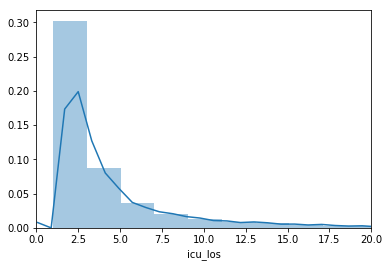

In [17]:
sns.distplot(admissions['icu_los'], label="Stay length")
plt.xlim(0,20)
plt.show()


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning:

invalid value encountered in greater

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning:

invalid value encountered in less

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:824: RuntimeWarning:

invalid value encountered in greater_equal

C:\ProgramData\Anaconda3\lib\site-packages\numpy\lib\histograms.py:825: RuntimeWarning:

invalid value encountered in less_equal



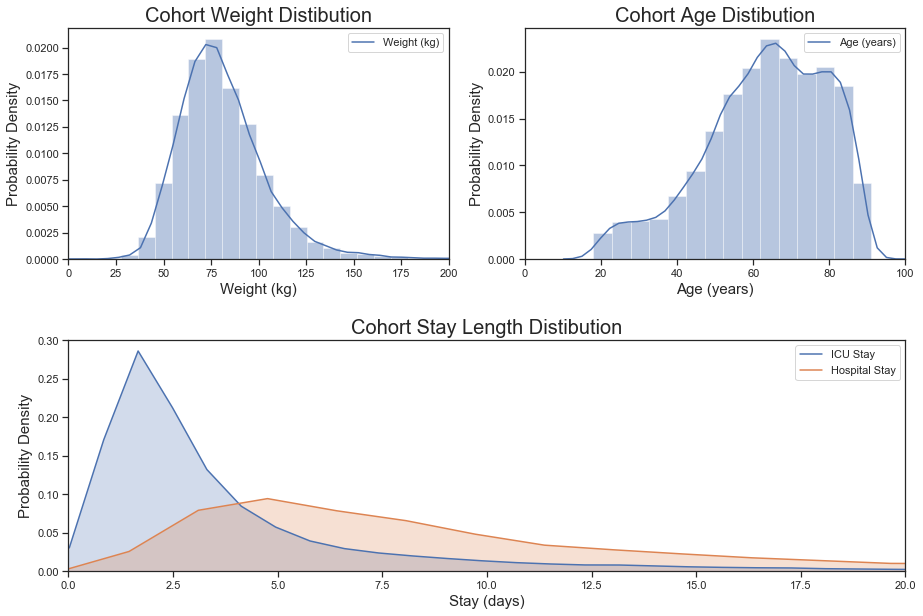

In [189]:
fig, axs = plt.subplots(2, 2, figsize = (15, 10))
gridspec.GridSpec(2,2)


plt.subplot2grid((2,2), (0,0))
sns.kdeplot(admissions["weight_kg"], shade=False, label="Weight (kg)")
sns.distplot(admissions["weight_kg"], bins=80, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Cohort Weight Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Weight (kg)", fontsize=15)
plt.xlim(0,200)

plt.subplot2grid((2,2), (0,1))
sns.kdeplot(admissions["age"], shade=False, label="Age (years)")
sns.distplot(admissions["age"], bins=60, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Cohort Age Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Age (years)", fontsize=15)
plt.xlim(0,100)

plt.subplot2grid((2,2), (1,0), colspan=2)
sns.kdeplot(admissions["icu_los"], shade=True, label="ICU Stay", bw=0.6)
sns.kdeplot(admissions["adm_los"], shade=True, label="Hospital Stay", bw=0.6)
plt.title("Cohort Stay Length Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Stay (days)", fontsize=15)
plt.xlim(0,20)

fig.subplots_adjust(hspace=.35)

fig.savefig('C:\Documents\Thesis\Figures\cohort_stats.png')

plt.show()

In [512]:
total_stays=admissions.shape[0]

print("Median age:", round(admissions.age.median(),2))
print("Median weight:", round(admissions.weight_kg.median(),2))
print("Median icustay length:", round(admissions.icu_los.median(),2))
print("Median hosptial stay length:", round(admissions.adm_los.median(),2), "\n")

print("StDev age:", round(admissions.age.std(),2))
print("StDev weight:", round(admissions.weight_kg.std(),2))
print("StDev icustay length:", round(admissions.icu_los.std(),2))
print("StDev hosptial stay length:", round(admissions.adm_los.std(),2), "\n")

#gender
num_female=admissions.groupby("gender").count().subject["F"]
num_male=admissions.groupby("gender").count().subject["M"]

print("Proportion Female", round(num_female/total_stays,2))
print("Proportion Male", round(num_male/total_stays,2), "\n")

#ethnicity
num_white=len(admissions.loc[(admissions.ethnicity.str.contains("WHITE")) | (admissions.ethnicity.str.contains("PORTUGESE"))])
num_asian=len(admissions.loc[admissions.ethnicity.str.contains("ASIAN")])
num_black=len(admissions.loc[(admissions.ethnicity.str.contains("BLACK"))| (admissions.ethnicity.str.contains("CARIBBEAN"))])
num_hispanic=len(admissions.loc[(admissions.ethnicity.str.contains("HISPANIC")) | (admissions.ethnicity.str.contains("SOUTH AMERICAN"))])
num_native=len(admissions.loc[(admissions.ethnicity.str.contains("AMERICAN INDIAN"))| (admissions.ethnicity.str.contains("PACIFIC"))])
num_arab=len(admissions.loc[admissions.ethnicity.str.contains("MIDDLE EASTERN")])
num_missing=len(admissions.loc[(admissions.ethnicity.str.contains("UNABLE")) | (admissions.ethnicity.str.contains("DECLINED")) | (admissions.ethnicity.str.contains("UNKNOWN"))])
num_other=len(admissions.loc[(admissions.ethnicity=="OTHER") | (admissions.ethnicity.str.contains("MULTI"))])

#num_race=num_white+num_asian+num_black+num_hispanic+num_native+num_arab+num_misc

print("Proportion Asian", round(num_asian/total_stays,2))
print("Proportion Black", round(num_black/total_stays,2))
print("Proportion Hispanic", round(num_hispanic/total_stays,2))
print("Proportion White", round(num_white/total_stays,2))
print("Proportion Other", round((num_other+num_arab+num_native)/total_stays,2))
print("Proportion Missing", round((num_missing)/total_stays,2), "\n")

#admittype
num_emergency=len(admissions.loc[(admissions.admittype=="EMERGENCY")])
num_elective=len(admissions.loc[(admissions.admittype=="ELECTIVE")])
num_urgent=len(admissions.loc[(admissions.admittype=="URGENT")])
     
print("Proportion ELECTIVE", round(num_elective/total_stays,2))
print("Proportion EMERGENCY or Urgent", round((num_emergency+num_urgent)/total_stays,2), "\n")

#first_careunit
num_MICU=len(admissions.loc[(admissions.first_careunit=="MICU")])
num_SICU=len(admissions.loc[(admissions.first_careunit=="SICU")])
num_CCU=len(admissions.loc[(admissions.first_careunit=="CCU")])
num_TSICU=len(admissions.loc[(admissions.first_careunit=="TSICU")])
num_CSRU=len(admissions.loc[(admissions.first_careunit=="CSRU")])

print("Proportion CCU", round(num_CCU/total_stays,2))
print("Proportion CSRU", round(num_CSRU/total_stays,2))
print("Proportion MICU", round(num_MICU/total_stays,2))
print("Proportion SICU", round(num_SICU/total_stays,2))
print("Proportion TSICU", round(num_TSICU/total_stays,2), "\n")  
                            
#expiry
num_alive=admissions.groupby("h_exp").count().subject[0]
num_dead=admissions.groupby("h_exp").count().subject[1]

print("Proportion Survived", round(num_alive/total_stays,2))
print("Proportion Died in Hosptial", round(num_dead/total_stays,2), "\n")
                            
#diabetic
num_dia=admissions.groupby("diabetic").count().subject[1]
num_no_dia=admissions.groupby("diabetic").count().subject[0]

print("Proportion Diabetic", round(num_dia/total_stays,2))
print("Proportion Not Diabetic", round(num_no_dia/total_stays,2), "\n")

Median age: 65.9
Median weight: 78.0
Median icustay length: 2.33
Median hosptial stay length: 7.5 

StDev age: 54.39
StDev weight: 24.94
StDev icustay length: 5.36
StDev hosptial stay length: 12.39 

Proportion Female 0.44
Proportion Male 0.56 

Proportion Asian 0.03
Proportion Black 0.1
Proportion Hispanic 0.04
Proportion White 0.73
Proportion Other 0.03
Proportion Missing 0.07 

Proportion ELECTIVE 0.14
Proportion EMERGENCY or Urgent 0.86 

Proportion CCU 0.12
Proportion CSRU 0.16
Proportion MICU 0.42
Proportion SICU 0.18
Proportion TSICU 0.12 

Proportion Survived 0.89
Proportion Died in Hosptial 0.11 

Proportion Diabetic 0.24
Proportion Not Diabetic 0.76 



In [551]:
#Find some totals
total_days=admissions.icu_los.sum()
total_days_insulin=admissions.loc[admissions['icustay'].isin(insulin_inputs.icustay.unique())].icu_los.sum()
total_glucose_measurement=len(glc_measurements)
total_insulin_inf=len(insulin_infusion)
total_insulin_bolus=len(insulin_bolus)

input_rate=(total_insulin_inf+total_insulin_bolus)/total_days_insulin
glc_measurement_rate=total_glucose_measurement/total_days

In [550]:
insulin_inputs.icustay.nunique()

10744

In [555]:
input_rate

2.5218467576470953

In [542]:
(total_days-len(admissions))/total_days

0.7612194081311254

In [552]:
insulin_infusion.icustay.nunique()/insulin_inputs.icustay.nunique()

0.3319061801935964

In [544]:
glc_measurement_rate

5.315529504510266

In [553]:
insulin_infusion.length_hr.sum()/24/total_days_insulin

0.06881591449919365

In [556]:
insulin_infusion.raw_amount.sum()

398951.8682528407

In [559]:
398457.171052/insulin_inputs.groupby(["type", "delivery"]).amount.sum().sum()

0.3682909148284932

## Glucose Readings

In [585]:
glc_measurements.groupby('type').count()

,icustay,icu_admit,icu_discharge,charttime,hadm,item,label,subject,unit,value
type,,,,,,,,,,
Fingerstick,241412,241412,241412,241412,241412,241412,241412,241412,0,241412
Serum,196999,196999,196999,196999,196999,196999,196999,196999,170111,196999


In [586]:
#create glucose time series dictionary
glc_ts={}

for icu_stay in glc_measurements.icustay.unique():
    #get the time series
    ts=glc_measurements.loc[glc_measurements["icustay"]==icu_stay].value
    #change index to days
    ts.index=ts.index.days+ts.index.seconds/3600/24
    #save in dictionary
    glc_ts[icu_stay]=ts


In [587]:
# #Plot all glucose traces
# sns.set(style="ticks")
# fig, ax = plt.subplots(1, 1, figsize = (15, 8))


# for icu_stay in glc_ts:
#     plt.plot(glc_ts[icu_stay], color="black", alpha=1/500)
#     #break
    
# plt.title("Blood glucose traces", fontsize=20)
# plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
# plt.xlabel("Day", fontsize=15)
# plt.xlim(0,7)
# plt.ylim(0,300)
# plt.show()

In [588]:
#find glucose measurement frequency
glucose_freq_hr=[]

glc_measurements_noindex=glc_measurements.reset_index()
glc_measurements_noindex.rename(columns={"index": "icu_time"}, inplace=True)

for icustay in glc_measurements.icustay.unique():
    #get the time difference between each bolus
    glc_measure_ts=glc_measurements_noindex["icu_time"].loc[glc_measurements_noindex["icustay"]==icustay].diff()[1:]
    #convert time difference into hours
    glc_measure_ts=24*(glc_measure_ts.dt.days+glc_measure_ts.dt.seconds/3600/24)
    #add time differences to list
    glucose_freq_hr.extend(glc_measure_ts)

#convert to array
glucose_freq_hr=np.asarray(glucose_freq_hr)

# remove values over 72 (3 days)
glucose_freq_hr = glucose_freq_hr[(glucose_freq_hr <= 36)]

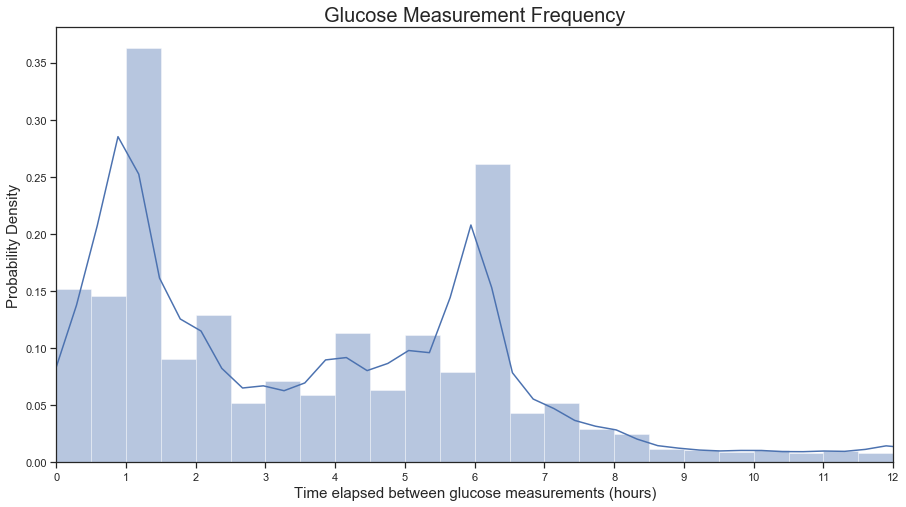

In [589]:
#plot glucose histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot(glucose_freq_hr, shade=False, bw=0.3)
sns.distplot(glucose_freq_hr, bins=72, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})


plt.title("Glucose Measurement Frequency", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time elapsed between glucose measurements (hours)", fontsize=15)
plt.xlim(0,12)
plt.xticks(range(0,13,1), range(0,13,1))
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\glc_freq.png')

In [590]:
# #find glucose measurement frequency for diabetics
# glucose_freq_hr_dia=[]

# glc_measurements_noindex=glc_measurements.reset_index()
# glc_measurements_noindex.rename(columns={"index": "icu_time"}, inplace=True)

# for icustay in dia_icustays:
#     #get the time difference between each bolus
#     glc_measure_ts=glc_measurements_noindex["icu_time"].loc[glc_measurements_noindex["icustay"]==icustay].diff()[1:]
#     #convert time difference into hours
#     glc_measure_ts=24*(glc_measure_ts.dt.days+glc_measure_ts.dt.seconds/3600/24)
#     #add time differences to list
#     glucose_freq_hr_dia.extend(glc_measure_ts)

# #convert to array
# glucose_freq_hr_dia=np.asarray(glucose_freq_hr_dia)

# # remove values over 72 (3 days)
# glucose_freq_hr_dia = glucose_freq_hr_dia[(glucose_freq_hr_dia <= 36)]

# #plot glucose histogram
# sns.set(style="ticks")
# fig, ax = plt.subplots(1, 1, figsize = (15, 8))
# sns.kdeplot(glucose_freq_hr_dia, shade=False, bw=0.3, color=sns.color_palette('deep')[0])
# sns.distplot(glucose_freq_hr_dia, bins=72, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})


# plt.title("Glucose Measurement Frequency for Diabetic Patients", fontsize=20)
# plt.ylabel("Probability Density", fontsize=15)
# plt.xlabel("Time elapsed between glucose measurements (hours)", fontsize=15)
# plt.xlim(0,12)
# plt.xticks(range(0,13,1), range(0,13,1))
# plt.show()

# fig.savefig('C:\Documents\Thesis\Figures\glc_freq_dia.png')

In [27]:
glc_measurements

,icustay,icu_admit,icu_discharge,charttime,hadm,item,label,subject,unit,value,type
icu_time,,,,,,,,,,,
0 days 02:53:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-25 22:00:00,152234,225664,Glucose finger stick,55973,None,118.0,Fingerstick
0 days 10:29:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-26 05:36:00,152234,220621,Glucose (serum),55973,mg/dL,87.0,Serum
0 days 20:53:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-26 16:00:00,152234,225664,Glucose finger stick,55973,None,72.0,Fingerstick
1 days 02:53:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-26 22:00:00,152234,225664,Glucose finger stick,55973,None,135.0,Fingerstick
1 days 10:47:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-27 05:54:00,152234,220621,Glucose (serum),55973,mg/dL,108.0,Serum
1 days 12:53:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-27 08:00:00,152234,225664,Glucose finger stick,55973,None,106.0,Fingerstick
1 days 20:53:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-27 16:00:00,152234,225664,Glucose finger stick,55973,None,125.0,Fingerstick
2 days 02:53:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-27 22:00:00,152234,225664,Glucose finger stick,55973,None,101.0,Fingerstick
2 days 07:49:48,200001,2181-11-25 19:06:12,2181-11-28 20:59:25,2181-11-28 02:56:00,152234,220621,Glucose (serum),55973,mg/dL,99.0,Serum


In [28]:
glc_measurements.icustay.unique()

array([200001, 200011, 200021, ..., 299957, 299979, 299998], dtype=int64)

In [ ]:
#glucose control over 7 days

#function for getting the time weighted average
def time_weight(x):
    try:
        weighted_av=np.average(x.value, weights=x.weight)
        return weighted_av
    except (ZeroDivisionError):
         return np.mean(x.value)

#create a dictionary for storage
glc_ts_d={}
glc_ts_d_high={}
glc_ts_d_low={}

#create daily mean GLC time series for each stay
for icu_stay in glc_measurements.icustay.unique():
    #get the time series
    ts=glc_measurements.loc[glc_measurements["icustay"]==icu_stay].value
    #convert to data frame
    ts=ts.to_frame()
    #add weights based on time
    ts['tvalue'] = ts.index
    ts['weight']=ts['tvalue'].diff(-1).fillna(pd.Timedelta(seconds=0))*-1
    #add a zero value to anchor
    ts.loc[timedelta(microseconds=0)] = [0, timedelta(microseconds=0),  timedelta(microseconds=0)]
    ts=ts.sort_index()
    #convert weights to float
    ts['weight']=ts['weight'].dt.total_seconds()
    #resample to daily
    ts_av=ts.resample("D").apply(lambda x: time_weight(x))
    #reset 0 value so it doesn't get in the way of the minimums
    ts.iloc[0,0]=np.NaN
    ts_h=ts.value.resample("D",).max()
    ts_l=ts.value.resample("D",).min()
    #save in dictionary
    glc_ts_d[icu_stay]=ts_av
    glc_ts_d_high[icu_stay]=ts_h
    glc_ts_d_low[icu_stay]=ts_l
    
daily_glucose_df=pd.DataFrame.from_dict(glc_ts_d, orient="index")
daily_glucose_high_df=pd.DataFrame.from_dict(glc_ts_d_high, orient="index")
daily_glucose_low_df=pd.DataFrame.from_dict(glc_ts_d_low, orient="index")

In [29]:
glc_ts_d

NameError: name 'glc_ts_d' is not defined

In [593]:
# #failed attempt to weighted average

# def time_weight(x):
#     print((x))
#     print(np.diff(x.index.asi8),0,1)
#     try:
#         time_weighted=np.average(x, weights=np.diff(x.index.asi8), returned=False)
#         return time_weighted
#     except (TypeError):
#         return np.mean(x)
    
# #time weighted glucose control

# ts=glc_measurements.loc[glc_measurements["icustay"]==200033].value
# #ts=ts.drop(ts.tail(1).index)
# #add an entry to anchor the time stamp to zero, since this is given 0 weight, it doesn't matter what the value is
# #ts=pd.concat([pd.Series([0], index=[ts.index[0]-ts.index[0]]), ts])
# #resample to daily using a timeweighted average
# ts_av=ts.resample("D").transform(lambda x: time_weight(pd.concat([pd.Series([0], index=[ts.index[0]]), x]))).resample("D").mean()
# #ts_av=ts.resample("D",).mean()
# ts_av

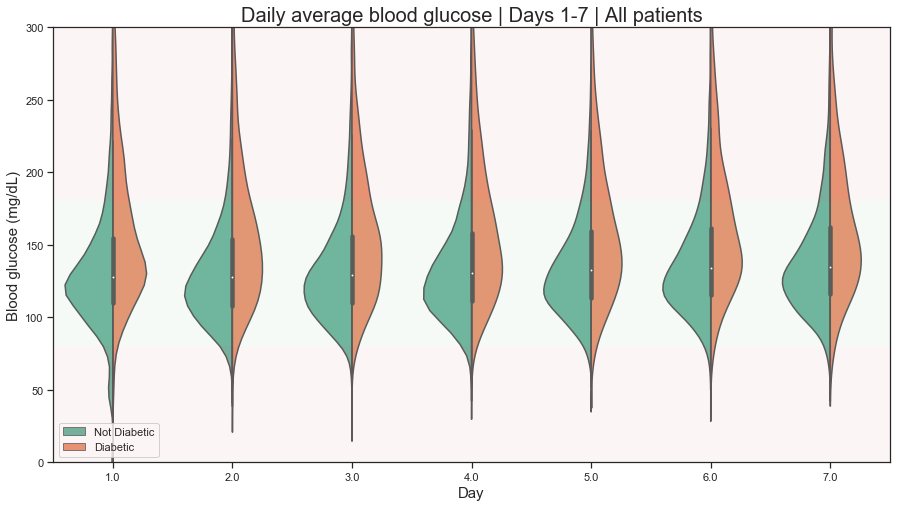

In [594]:
d_glc_plot=format_daily_glc(daily_glucose_df, "diabetic", "Diabetes", {0:"Not Diabetic", 1:"Diabetic"})

#Plot violin plot
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
ax=sns.violinplot(x=d_glc_plot["Day"], y=d_glc_plot["Glucose"], hue=d_glc_plot["Diabetes"], hue_order=["Not Diabetic", "Diabetic"] ,split=True, palette="Set2", zorder=1)

#Add patches to show regions which are in and out of control
add_glucose_guidlines()


#Change violinplot formatting
plt.title("Daily average blood glucose | Days 1-7 | All patients", fontsize=20)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.xlabel("Day", fontsize=15)
plt.ylim(0,300)
plt.legend(loc='lower left')
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\daily_glc_all.png')

In [599]:
#find proportion above or below an amount
df_temp=d_glc_plot.loc[d_glc_plot["Day"]==4].loc[d_glc_plot["Diabetes"]=="Diabetic"].dropna()
df_temp.loc[d_glc_plot["Glucose"]>180].shape[0]/df_temp.shape[0]

0.32226832641770403

In [649]:
#find proportion above or below an amount
df_temp=d_glc_plot.loc[d_glc_plot["Day"]==7].dropna()
df_temp.loc[d_glc_plot["Glucose"]>200].shape[0]/df_temp.shape[0]

0.10502721741914825

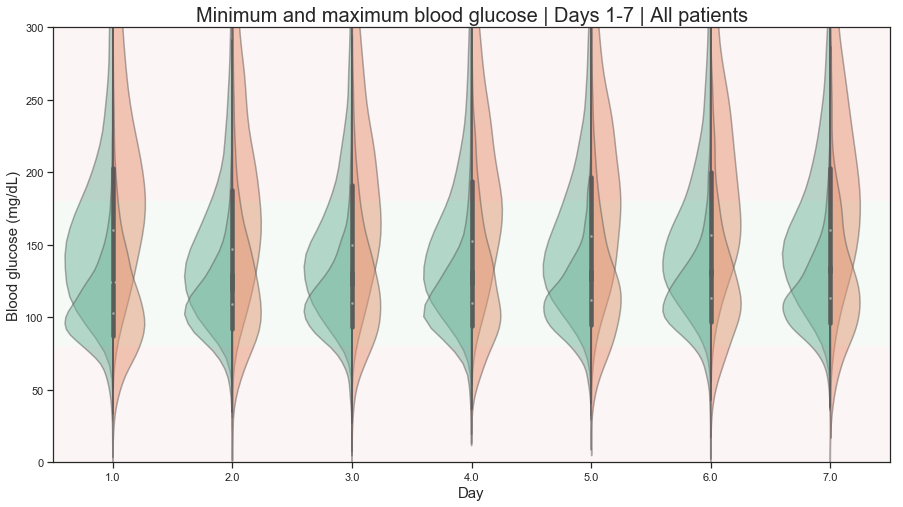

In [596]:
d_glc_plot_high=format_daily_glc(daily_glucose_high_df, "diabetic", "Diabetes", {0:"Not Diabetic", 1:"Diabetic"})
d_glc_plot_low=format_daily_glc(daily_glucose_low_df, "diabetic", "Diabetes", {0:"Not Diabetic", 1:"Diabetic"})

#Plot violin plot
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
vio1=sns.violinplot(x=d_glc_plot_high["Day"], y=d_glc_plot_high["Glucose"], hue=d_glc_plot_high["Diabetes"], hue_order=["Not Diabetic", "Diabetic"] ,split=True, palette="Set2", zorder=1)
sns.violinplot(x=d_glc_plot_low["Day"], y=d_glc_plot_low["Glucose"], hue=d_glc_plot_low["Diabetes"], hue_order=["Not Diabetic", "Diabetic"] ,split=True, palette="Set2", zorder=2)

#set the alpha so the overlap can be seen            
plt.setp(ax.collections, alpha=.5)

#Add patches to show regions which are in and out of control
add_glucose_guidlines()



#Change violinplot formatting
plt.title("Minimum and maximum blood glucose | Days 1-7 | All patients", fontsize=20)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.xlabel("Day", fontsize=15)
plt.ylim(0,300)
plt.legend(loc='lower left')
plt.gca().get_legend().remove()
#plt.legend().get_texts()[3].set_text(None)
# plt.legend().get_texts()
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\daily_glc_all_minmax.png')

In [609]:
#find proportion above or below an amount
df_temp=d_glc_plot_high.loc[d_glc_plot_high["Day"]==7].loc[d_glc_plot_high["Diabetes"]=="Not Diabetic"].dropna()
df_temp.loc[d_glc_plot_high["Glucose"]>180].shape[0]/df_temp.shape[0]

0.28375

In [616]:
#find proportion above or below an amount
df_temp=d_glc_plot_low.loc[d_glc_plot_low["Day"]==1].loc[d_glc_plot_low["Diabetes"]=="Diabetic"].dropna()
df_temp.loc[d_glc_plot_low["Glucose"]<80].shape[0]/df_temp.shape[0]

0.21014337684570938

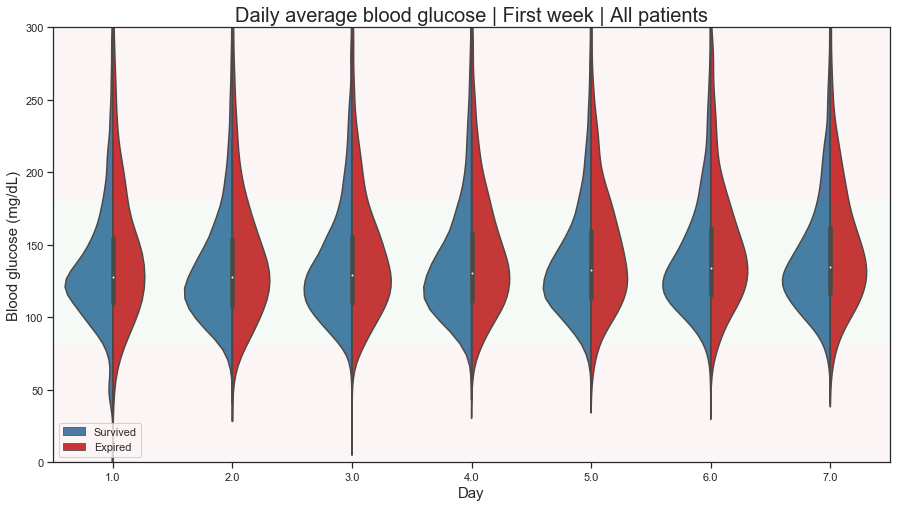

In [109]:
d_glc_plot=format_daily_glc(daily_glucose_df, "h_exp", "In-Hospital Mortality", {0:"Survived", 1:"Expired"})


#Plot violin plot
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.set(style="ticks")
palette=[sns.color_palette("Set1")[1], sns.color_palette("Set1")[0]]
ax=sns.violinplot(x=d_glc_plot["Day"], y=d_glc_plot["Glucose"], hue=d_glc_plot["In-Hospital Mortality"],split=True, palette=palette, zorder=1)

#Add patches to show regions which are in and out of control
add_glucose_guidlines()



#Change violinplot formatting
plt.title("Daily average blood glucose | First week | All patients", fontsize=20)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.xlabel("Day", fontsize=15)
plt.ylim(0,300)
plt.legend(loc='lower left')
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\daily_glc_all_death.png')

In [113]:
df_temp=d_glc_plot.loc[d_glc_plot["Day"]==7].loc[d_glc_plot["In-Hospital Mortality"]=="Expired"].dropna()
df_temp.loc[d_glc_plot["Glucose"]>180].shape[0]/df_temp.shape[0]

0.24079754601226994

In [66]:
#chi squared test to see if it's significant that the non-diabetics died more frequently.
ndia_sur=admissions.loc[(admissions.diabetic==0) & (admissions.h_exp==0)].shape[0]
ndia_mort=admissions.loc[(admissions.diabetic==0) & (admissions.h_exp==1)].shape[0]
dia_sur=admissions.loc[(admissions.diabetic==1) & (admissions.h_exp==0)].shape[0]
dia_mort=admissions.loc[(admissions.diabetic==1) & (admissions.h_exp==1)].shape[0]

obs=[[ndia_sur, ndia_mort],[dia_sur, dia_mort]]
stats.chi2_contingency(obs)

(7.456228982688405,
 0.006321730222612427,
 1,
 array([[13345.53767645,  1641.46232355],
        [ 4191.46232355,   515.53767645]]))

In [68]:
admissions.loc[admissions.diabetic==1].h_exp.mean()

0.09857658806033567

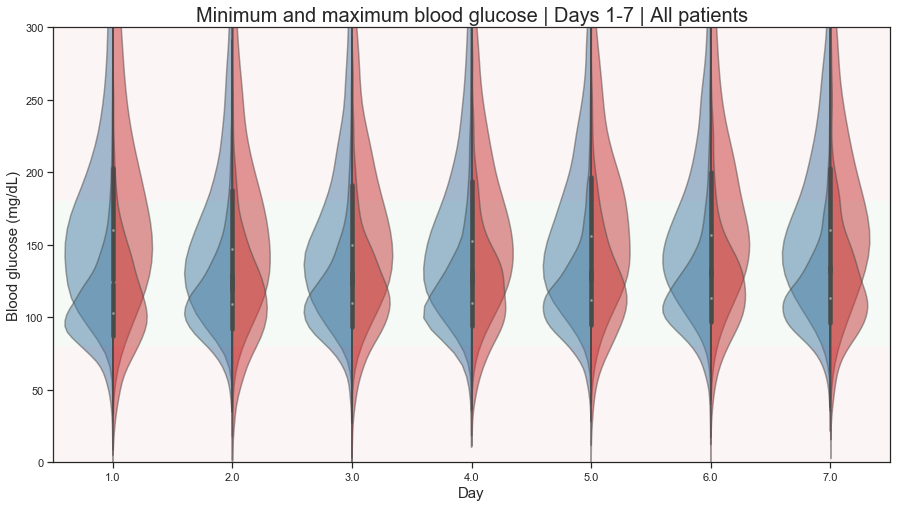

In [37]:
d_glc_plot_high=format_daily_glc(daily_glucose_high_df, "h_exp", "In-Hospital Mortality", {0:"Survived", 1:"Expired"})
d_glc_plot_low=format_daily_glc(daily_glucose_low_df, "h_exp", "In-Hospital Mortality", {0:"Survived", 1:"Expired"})

#Plot violin plot
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
palette=[sns.color_palette("Set1")[1], sns.color_palette("Set1")[0]]
vio1=sns.violinplot(x=d_glc_plot_high["Day"], y=d_glc_plot_high["Glucose"], hue=d_glc_plot_high["In-Hospital Mortality"],split=True, palette=palette, zorder=1)
sns.violinplot(x=d_glc_plot_low["Day"], y=d_glc_plot_low["Glucose"], hue=d_glc_plot_low["In-Hospital Mortality"] ,split=True, palette=palette, zorder=2)

#set the alpha so the overlap can be seen            
plt.setp(ax.collections, alpha=.5)

#Add patches to show regions which are in and out of control
add_glucose_guidlines()



#Change violinplot formatting
plt.title("Minimum and maximum blood glucose | Days 1-7 | All patients", fontsize=20)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.xlabel("Day", fontsize=15)
plt.ylim(0,300)
plt.legend(loc='lower left')
plt.gca().get_legend().remove()
#plt.legend().get_texts()[3].set_text(None)
# plt.legend().get_texts()
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\daily_glc_all_minmax_death.png')

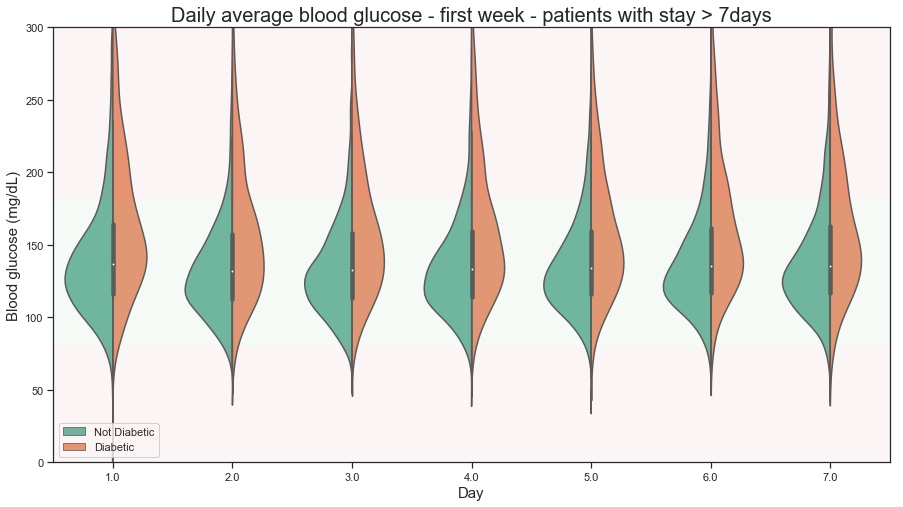

In [38]:
#Daily average blood glucose over the first week, for patients who are in all week

#Create a long-form dataframe
d_glc_plot=pd.melt(frame=daily_glucose_df.iloc[:,0:7].dropna().reset_index(), id_vars="index", value_name="Glucose", var_name="Day")

#Change timestamp into integer for easier plotting, and make first day '1'
d_glc_plot["Day"]=(d_glc_plot["Day"].dt.days.astype(int)+1)

#join diabetic status from admissions on icustay_id
d_glc_plot=d_glc_plot.rename(index=str, columns={"index": "icustay"})
d_glc_plot=admissions[["diabetic", "icustay"]].merge(d_glc_plot,  "left", on="icustay")
d_glc_plot=d_glc_plot.rename(index=str, columns={"diabetic": "Diabetes"})
d_glc_plot["Diabetes"]=d_glc_plot["Diabetes"].map({0:"Not Diabetic", 1:"Diabetic"})

#Plot violin plot
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.set(style="ticks")
ax=sns.violinplot(x=d_glc_plot["Day"], y=d_glc_plot["Glucose"], hue=d_glc_plot["Diabetes"], hue_order=["Not Diabetic", "Diabetic"], split=True, palette="Set2", zorder=1)

#Add patches to show regions which are in and out of control
add_glucose_guidlines()


#Change violinplot formatting
plt.title("Daily average blood glucose - first week - patients with stay > 7days", fontsize=20)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.xlabel("Day", fontsize=15)
plt.ylim(0,300)
plt.legend(loc='lower left')
plt.show()

In [30]:
# #glucose control over the first 24 hours

# #create a dictionary for storage
# glc_ts_h={}

# #create daily mean GLC time series for each stay
# for icu_stay in glc_measurements.icustay.unique():
#     #get the time series
#     ts=glc_measurements.loc[glc_measurements["icustay"]==icu_stay].value
#     #add a NaN entry to anchor the time stamp to zero
#     ts=ts.append(pd.Series([np.nan], index=[ts.index[0]-ts.index[0]]))
#     #resample to hourly
#     ts=ts.resample("H",).mean()
#     #interpolate missing days
#     ts=ts.interpolate(method="linear")
#     #save in dictionary
#     glc_ts_h[icu_stay]=ts
    
# hourly_glucose_df=pd.DataFrame.from_dict(glc_ts_h, orient="index")

In [31]:
# #Hourly average blood glucose over the first 12hrs

# #Create a long-form dataframe
# h_glc_plot=pd.melt(frame=hourly_glucose_df.iloc[:,0:12].reset_index(), id_vars="index", value_name="Glucose", var_name="Hour")

# #Change timestamp into integer for easier plotting, and make first day '1'
# h_glc_plot["Hour"]=((h_glc_plot["Hour"].dt.seconds/3600)+1)

# #join diabetic status from admissions on icustay_id
# h_glc_plot=h_glc_plot.rename(index=str, columns={"index": "icustay"})
# h_glc_plot=admissions[["diabetic", "icustay"]].merge(h_glc_plot,  "left", on="icustay")
# h_glc_plot=h_glc_plot.rename(index=str, columns={"diabetic": "Diabetes"})
# h_glc_plot["Diabetes"]=h_glc_plot["Diabetes"].map({0:"Not Diabetic", 1:"Diabetic"})

# #Plot violin plot
# fig, ax = plt.subplots(1, 1, figsize = (15, 8))
# sns.set(style="ticks")
# ax=sns.violinplot(x=h_glc_plot["Hour"], y=h_glc_plot["Glucose"], hue=h_glc_plot["Diabetes"] , hue_order=["Not Diabetic", "Diabetic"], split=True, palette="Set2", zorder=1)

# #Add patches to show regions which are in and out of control
# add_glucose_guidlines()

# #Change violinplot formatting
# plt.title("Hourly average blood glucose - first 12 hrs - all patients", fontsize=20)
# plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
# plt.xlabel("Hour", fontsize=15)
# plt.ylim(0,300)
# plt.legend(loc='lower left')
# plt.show()

## Glucose Sankey

In [632]:
#finding out who is in or out of control
daily_gs=daily_glucose_df.iloc[:,0:7].dropna().copy()

#define states
daily_gs[(daily_gs < 80)]=1
daily_gs[(daily_gs <= 180) & (daily_gs >= 80)]=2
daily_gs[(daily_gs > 180)]=3
#Replace states with strings (need a two step process)
#daily_gs[(daily_gs == 1)]="Hypo"
#daily_gs[(daily_gs == 2)]="Controlled"
#daily_gs[(daily_gs == 3)]="Hyper"

daily_gs=daily_gs.astype(int)
daily_gs.columns=np.arange(1,8)


In [633]:
# #Find transition probabilities for whole time
# #Set up an empty transition matrix
# tran_M=[[0]*3 for _ in range (3)]

# #Count the number of transitions in each row
# for row in np.arange(0,daily_gs.shape[0]):
#     for (i,j) in zip(daily_gs.iloc[row].values[:-1], daily_gs.iloc[row].values[1:]):
#         tran_M[i-1][j-1]+=1

# #Normalise the counts into probabilities
# for row in tran_M:
#     s = sum(row)
#     if s > 0:
#         row[:] = [f/s for f in row]
        
# tran_M

In [634]:
#Find daily transition probabilities
transitions_d={}

#Set up transition matrix for each day
for day in np.arange(1,7):
    transitions_d["Day"+str(day)]=[[0]*3 for _ in range (3)]

#Count the number of transitions for each day
for day in np.arange(1,7):
    for (i,j) in zip(daily_gs[day].values, daily_gs[day+1].values):
        transitions_d["Day"+str(day)][i-1][j-1]+=1

#Normalise the counts into probabilities
transitions_d_prob=copy.deepcopy(transitions_d)
for day in np.arange(1,7):
     for row in transitions_d_prob["Day"+str(day)]:
         s = sum(row)
         if s > 0:
             row[:] = [f/s for f in row]
        
print(transitions_d)

source_list=[]
for i in np.arange(1,19):
    for n in np.arange(1,4):
        source_list.append(i)
        
target_list=[]
for i in np.arange(3,19,3):
    temp=[i+1,i+2,i+3]*3
    for item in temp:
        target_list.append(item)
        
value_list=[]
for entry in zip(source_list, target_list):
    day=int(1+(entry[0]-1)/3)
    row=((entry[0]-1)%3)
    col=(entry[1]-day*3-1)
    value_list.append(transitions_d["Day"+str(day)][row][col])
    #print(entry[0], entry[1], "      ", day,row,col)
    
sankey_d=pd.DataFrame({"Source":source_list, "Target": target_list, "Value":value_list})
sankey_d["Colour"]="rgba(144,196,151,0.8)"
sankey_d.loc[sankey_d["Target"]%3==2,"Colour"]="rgba(252,42,58,0.8)"
sankey_d.loc[sankey_d["Target"]%3==1,"Colour"]="rgba(237,118,59,0.8)"
sankey_d["Label"]=""
sankey_d.at[3, "Label"] = "Hyperglycaemic"
sankey_d.at[1, "Label"] = "Hypoglycaemic"

i=1
for row in np.arange(0, sankey_d.shape[0]):
    if sankey_d.loc[row].loc["Target"]%3 ==0:
        sankey_d.at[row, "Label"] = "Day" + str(i)
        i+=1

        
sankey_d["Link Colour"]="rgba(32,32,32,0.2)"

data_trace=dict(
    type='sankey',
    domain= dict(
        x= [0,1],
        y= [0,1]
    ),
    orientation = "h",
    valueformat=".0f",
    node = dict(
        pad = 15,
        thickness = 30,
        line = dict(
            color = "black",
            width= 0.5
        ),
        label = sankey_d['Label'].dropna(axis=0, how="any"),
        color = sankey_d["Colour"]
    ),
    link = dict(
        source=sankey_d['Source'].dropna(axis=0, how="any"),
        target=sankey_d['Target'].dropna(axis=0, how="any"),
        value=sankey_d['Value'].dropna(axis=0, how="any"),
        color=sankey_d['Link Colour'].dropna(axis=0, how="any")
                                   
    )
)


layout =  dict(
    title = "Daily average blood glucose flows | Days 1-7 | All patients",
    height = 600,
    width = 1000,
    titlefont = dict(
      size = 20
    ),  
    font = dict(
      size = 12
    ),    
)


fig = dict(data=[data_trace], layout=layout)
py.iplot(fig, validate=False)

{'Day1': [[10, 45, 0], [39, 2286, 151], [1, 303, 245]], 'Day2': [[8, 42, 0], [31, 2416, 187], [0, 170, 226]], 'Day3': [[11, 27, 1], [25, 2406, 197], [0, 174, 239]], 'Day4': [[11, 25, 0], [21, 2397, 189], [0, 168, 269]], 'Day5': [[9, 23, 0], [18, 2378, 194], [0, 170, 288]], 'Day6': [[9, 18, 0], [26, 2338, 207], [2, 161, 319]]}


In [635]:
#select only the first week of results
daily_gs_high=daily_glucose_high_df.iloc[:,0:7].dropna().copy()
daily_gs_low=daily_glucose_low_df.iloc[:,0:7].dropna().copy()

#define episodes
daily_ep=daily_gs_low.copy()
daily_ep[(daily_gs_high > 0)]=2
daily_ep[(daily_gs_high > 180)]=3
daily_ep[(daily_gs_low < 80)]=1

daily_ep=daily_ep.astype(int)
daily_ep.columns=np.arange(1,8)

#Find daily transition probabilities
transitions_ep={}

#Set up transition matrix for each day
for day in np.arange(1,7):
    transitions_ep["Day"+str(day)]=[[0]*3 for _ in range (3)]

#Count the number of transitions for each day
for day in np.arange(1,7):
    for (i,j) in zip(daily_ep[day].values, daily_ep[day+1].values):
        transitions_ep["Day"+str(day)][i-1][j-1]+=1

#Normalise the counts into probabilities
transitions_ep_prob=copy.deepcopy(transitions_ep)
for day in np.arange(1,7):
     for row in transitions_ep_prob["Day"+str(day)]:
         s = sum(row)
         if s > 0:
             row[:] = [f/s for f in row]
        
print(transitions_ep)

#set up source, target and value lists for sankey
source_list=[]
for i in np.arange(1,19):
    for n in np.arange(1,4):
        source_list.append(i)
        
target_list=[]
for i in np.arange(3,19,3):
    temp=[i+1,i+2,i+3]*3
    for item in temp:
        target_list.append(item)
        
value_list=[]
for entry in zip(source_list, target_list):
    day=int(1+(entry[0]-1)/3)
    row=((entry[0]-1)%3)
    col=(entry[1]-day*3-1)
    value_list.append(transitions_ep["Day"+str(day)][row][col])

#create dataframe for sankey
sankey_d=pd.DataFrame({"Source":source_list, "Target": target_list, "Value":value_list})
sankey_d["Colour"]="rgba(144,196,151,0.8)"
sankey_d.loc[sankey_d["Target"]%3==2,"Colour"]="rgba(252,42,58,0.8)"
sankey_d.loc[sankey_d["Target"]%3==1,"Colour"]="rgba(237,118,59,0.8)"
sankey_d["Label"]=""
sankey_d.at[3, "Label"] = "Hyperglycaemic"
sankey_d.at[1, "Label"] = "Hypoglycaemic"

i=1
for row in np.arange(0, sankey_d.shape[0]):
    if sankey_d.loc[row].loc["Target"]%3 ==0:
        sankey_d.at[row, "Label"] = "Day" + str(i)
        i+=1

        
sankey_d["Link Colour"]="rgba(32,32,32,0.2)"

data_trace=dict(
    type='sankey',
    domain= dict(
        x= [0,1],
        y= [0,1]
    ),
    orientation = "h",
    valueformat=".0f",
    node = dict(
        pad = 15,
        thickness = 30,
        line = dict(
            color = "black",
            width= 0.5
        ),
        label = sankey_d['Label'].dropna(axis=0, how="any"),
        color = sankey_d["Colour"]
    ),
    link = dict(
        source=sankey_d['Source'].dropna(axis=0, how="any"),
        target=sankey_d['Target'].dropna(axis=0, how="any"),
        value=sankey_d['Value'].dropna(axis=0, how="any"),
        color=sankey_d['Link Colour'].dropna(axis=0, how="any")
                                   
    )
)


layout =  dict(
    title = "Hypoglycemic and hyperglycemic episode flows | Days 1-7 | Patients with stay >7 days",
    height = 600,
    width = 1000,
    titlefont = dict(
      size = 20
    ),  
    font = dict(
      size = 12
    ),    
)


fig = dict(data=[data_trace], layout=layout)
py.iplot(fig, validate=False)

{'Day1': [[183, 206, 97], [125, 1072, 221], [137, 437, 598]], 'Day2': [[164, 204, 77], [123, 1319, 273], [66, 276, 574]], 'Day3': [[127, 160, 66], [127, 1383, 289], [57, 266, 601]], 'Day4': [[112, 135, 64], [111, 1411, 287], [84, 217, 655]], 'Day5': [[116, 137, 54], [95, 1415, 253], [63, 266, 677]], 'Day6': [[81, 119, 74], [98, 1444, 276], [56, 258, 670]]}


## Glucose Time Series Clustering

In [11]:
#Clustering 

#http://alexminnaar.com/time-series-classification-and-clustering-with-python.html
#https://nbviewer.jupyter.org/github/alexminnaar/time-series-classification-and-clustering/blob/master/Time%20Series%20Classification%20and%20Clustering.ipynb

#Get all complete week data (resampled every 1hr)


#glucose control over 5 days

#create a dictionary for storage
glc_ts_clust={}

#create daily mean GLC time series for each stay
for icu_stay in glc_measurements.icustay.unique():
    #get the time series
    ts=glc_measurements.loc[glc_measurements["icustay"]==icu_stay].value
    #add a NaN entry to anchor the time stamp to zero
    ts=ts.append(pd.Series([np.nan], index=[ts.index[0]-ts.index[0]]))
    #resample to every 30 minutes
    ts=ts.resample("H").mean()
    #interpolate missing days
    ts=ts.interpolate(method="linear")
    #save in dictionary
    glc_ts_clust[icu_stay]=ts

clust_glucose_df=pd.DataFrame.from_dict(glc_ts_clust, orient="index")

#drop all traces that do not start within 6 hours and last at least 5 days
clust_glucose_df=clust_glucose_df.loc[:,"0 days 06:00:00": "5 days 00:00:00"].dropna()

Cluster 1 of size 1008 , mortality rate: 18.6 %
Cluster 2 of size 507 , mortality rate: 27.2 %
Cluster 3 of size 757 , mortality rate: 16.2 %
Cluster 4 of size 211 , mortality rate: 29.9 %
Cluster 5 of size 320 , mortality rate: 21.2 %
[18.6, 27.2, 16.2, 29.9, 21.2]


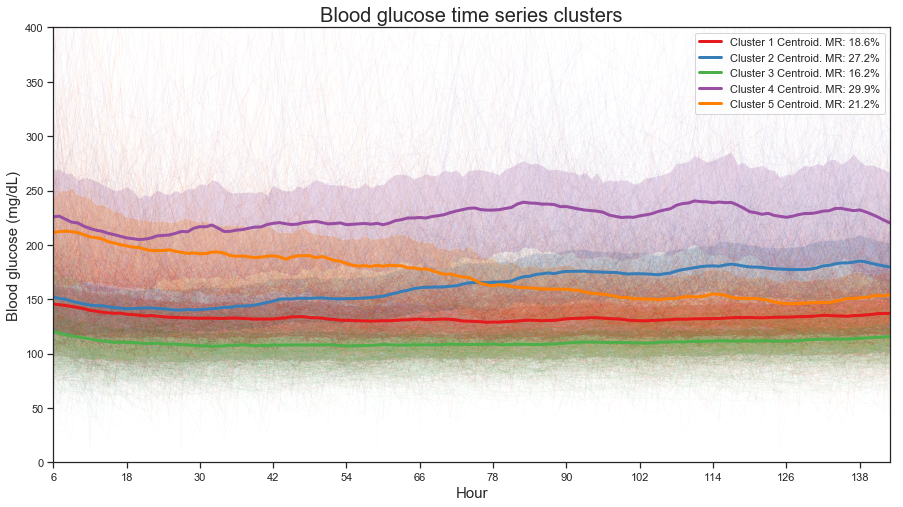

In [15]:
data=clust_glucose_df

#assignments, centroids=k_means_clust_ts(data, 5, 10, w=10)
(assignments, centroids)=pickle.load(open('./clusters/5clust_13May.pkl', 'rb'))
cluster_summaries(assignments, admissions=admissions)
plot_clusters(data, assignments, centroids, save_fig=True)


In [14]:
pickle.dump((assignments, centroids), open('./clusters/5clust_13May.pkl', 'wb'))

,0 days 06:00:00,0 days 07:00:00,0 days 08:00:00,0 days 09:00:00,0 days 10:00:00,0 days 11:00:00,0 days 12:00:00,0 days 13:00:00,0 days 14:00:00,0 days 15:00:00,...,5 days 14:00:00,5 days 15:00:00,5 days 16:00:00,5 days 17:00:00,5 days 18:00:00,5 days 19:00:00,5 days 20:00:00,5 days 21:00:00,5 days 22:00:00,5 days 23:00:00
200033,167.000000,167.000000,152.200000,137.400000,122.600000,107.800000,93.000000,89.750000,86.500000,83.250000,...,155.285714,149.142857,143.000000,150.333333,157.666667,165.000000,172.333333,179.666667,187.000000,186.166667
200053,119.500000,119.750000,120.000000,120.000000,122.333333,124.666667,127.000000,129.333333,131.666667,134.000000,...,99.800000,100.266667,100.733333,101.200000,101.666667,102.133333,102.600000,103.066667,103.533333,104.000000
200063,196.000000,121.000000,121.000000,104.000000,104.000000,109.500000,115.000000,120.500000,116.000000,137.000000,...,170.400000,165.600000,160.800000,156.000000,141.333333,126.666667,112.000000,112.000000,113.250000,114.500000
200131,112.600000,119.400000,126.200000,133.000000,133.666667,134.333333,135.000000,135.666667,136.333333,137.000000,...,154.000000,157.833333,161.666667,165.500000,169.333333,173.166667,177.000000,169.400000,161.800000,154.200000
200143,155.000000,155.000000,158.400000,161.800000,165.200000,168.600000,172.000000,175.625000,179.250000,182.875000,...,169.333333,175.500000,181.666667,187.833333,194.000000,191.166667,188.333333,185.500000,182.666667,179.833333
200172,102.000000,102.000000,102.777778,103.555556,104.333333,105.111111,105.888889,106.666667,107.444444,108.222222,...,104.363636,103.590909,102.818182,102.045455,101.272727,100.500000,99.727273,98.954545,98.181818,97.409091
200191,176.500000,176.750000,177.000000,171.400000,165.800000,160.200000,154.600000,149.000000,149.000000,154.600000,...,124.000000,125.000000,126.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000,127.000000
200282,168.500000,166.666667,164.833333,163.000000,157.000000,153.200000,149.400000,145.600000,141.800000,138.000000,...,96.625000,99.000000,101.375000,103.750000,106.125000,108.500000,110.875000,113.250000,115.625000,118.000000
200290,88.000000,80.000000,99.000000,118.000000,154.000000,141.500000,129.000000,167.000000,114.000000,134.000000,...,140.666667,139.000000,137.333333,135.666667,134.000000,134.833333,135.666667,136.500000,137.333333,138.166667
200325,109.312500,107.250000,105.187500,103.125000,101.062500,99.000000,101.000000,103.000000,105.000000,107.000000,...,155.000000,149.666667,144.333333,139.000000,139.666667,140.333333,141.000000,141.666667,142.333333,143.000000


## Insulin inputs 

In [43]:
insulin_inputs.groupby(["type", "delivery"]).count()

icustay  icu_admit  icu_discharge  subject   hadm  \
type         delivery                                                      
Intermediate Bolus        3860       3860           3860     3860   3860   
Long         Bolus        8423       8423           8423     8423   8423   
Short        Bolus       87701      87701          87701    87701  87701   
             Infusion    42458      42458          42458    42458  42458   

                       diagnosis   item  ordercat  input_start  input_end  \
type         delivery                                                       
Intermediate Bolus          3860   3860      3860         3860       3860   
Long         Bolus          8423   8423      8423         8423       8423   
Short        Bolus         87701  87701     87701        87701      87701   
             Infusion      42458  42458     42458        42458      42458   

                       ...  ptweight  totalamount  totalamountuom  \
type         delivery  ...                                          
Intermediate Bolus     ...      3860            0               0   
Long         Bolus     ...      8423            0               0   
Short        Bolus     ...     87701            0               0   
             Infusion  ...     42458        42458           42458   

                       originalamount  originalrate  status  label  icu_time  \
type         delivery                                                          
Intermediate Bolus               3860          3860    3860   3860      3860   
Long         Bolus               8423          8423    8423   8423      8423   
Short        Bolus              87701         87701   87701  87701     87701   
             Infusion           42458         42458   42458  42458     42458   

                       length_hr  raw_amount  
type         delivery                         
Intermediate Bolus             0           0  
Long         Bolus             0           0  
Short        Bolus             0           0  
             Infusion      42458       42458  

[4 rows x 24 columns]

In [160]:
insulin_infusion.icustay.nunique()/admissions.icustay.nunique()

0.1810703767644968

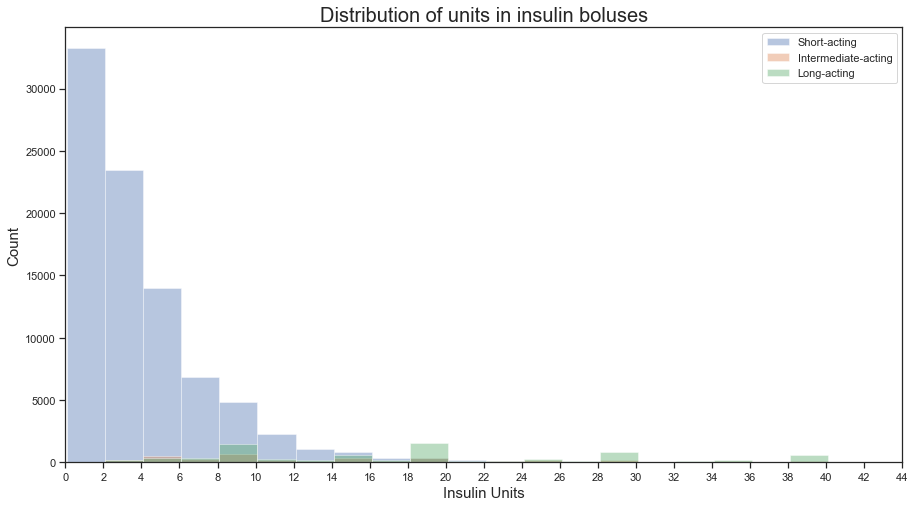

In [153]:
bin_width=2
bin_list=np.arange(min(insulin_bolus.amount), max(insulin_bolus.amount) + bin_width, bin_width)

#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.distplot(insulin_bolus.loc[insulin_bolus.type=="Short"].amount, kde=False, bins=bin_list, norm_hist=False, label="Short-acting")
sns.distplot(insulin_bolus.loc[insulin_bolus.type=="Intermediate"].amount, kde=False, bins=bin_list, norm_hist=False, label="Intermediate-acting")
sns.distplot(insulin_bolus.loc[insulin_bolus.type=="Long"].amount, kde=False, bins=bin_list, norm_hist=False, label="Long-acting")
plt.xticks(np.arange(0, max(insulin_bolus.amount)+bin_width, bin_width))
#plt.xlim(0, 10)
plt.xlabel("Insulin Units", fontsize=15)
plt.ylabel("Count", fontsize=15)
plt.xlim(0,44)
plt.legend()
plt.title("Distribution of units in insulin boluses", fontsize=20)
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\ins_units.png')

In [149]:
len(insulin_bolus.loc[insulin_bolus.type=="Short"].loc[insulin_bolus.amount>=2].loc[insulin_bolus.amount<=4])/len(insulin_bolus.loc[insulin_bolus.type=="Short"])

0.6223988323964379

In [107]:
ins_input_order=[("Short", "Bolus"), ("Intermediate", "Bolus"), ("Long", "Bolus"), ("Short", "Infusion"),]

insulin_inputs.groupby(["type", "delivery"]).count().reindex(ins_input_order)

,,icustay,icu_admit,icu_discharge,subject,hadm,diagnosis,item,ordercat,input_start,input_end,...,ptweight,totalamount,totalamountuom,originalamount,originalrate,status,label,icu_time,length_hr,raw_amount
type,delivery,,,,,,,,,,,,,,,,,,,,,
Short,Bolus,87701,87701,87701,87701,87701,87701,87701,87701,87701,87701,...,87701,0,0,87701,87701,87701,87701,87701,0,0
Intermediate,Bolus,3860,3860,3860,3860,3860,3860,3860,3860,3860,3860,...,3860,0,0,3860,3860,3860,3860,3860,0,0
Long,Bolus,8423,8423,8423,8423,8423,8423,8423,8423,8423,8423,...,8423,0,0,8423,8423,8423,8423,8423,0,0
Short,Infusion,42458,42458,42458,42458,42458,42458,42458,42458,42458,42458,...,42458,42458,42458,42458,42458,42458,42458,42458,42458,42458


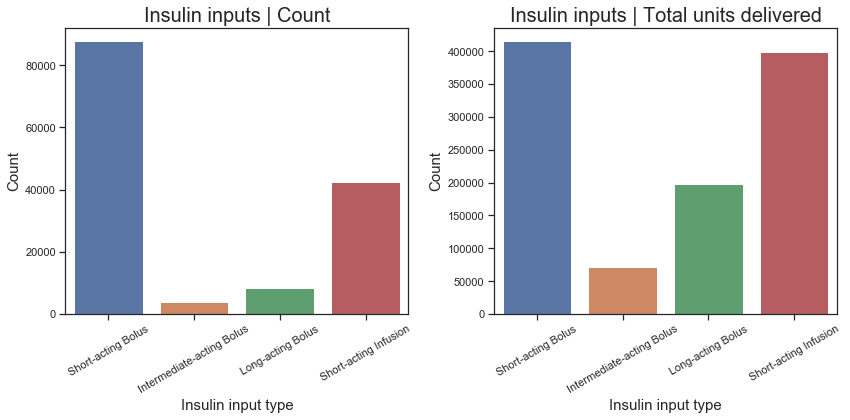

In [108]:
fig, axs = plt.subplots(1, 2, figsize = (12, 6))
gridspec.GridSpec(1,2)


plt.subplot2grid((1,2), (0,0))
plot_data=insulin_inputs.groupby(["type", "delivery"]).icustay.count().reindex(ins_input_order)
sns.barplot(x=["Short-acting Bolus", "Intermediate-acting Bolus", "Long-acting Bolus",  "Short-acting Infusion"], y=plot_data.values)
plt.title("Insulin inputs | Count", fontsize=20)
plt.ylabel("Count", fontsize=15)
plt.xlabel("Insulin input type", fontsize=15)
plt.xticks(rotation=30)

plt.subplot2grid((1,2), (0,1))
plot_data=insulin_inputs.groupby(["type", "delivery"]).amount.sum().reindex(ins_input_order)
sns.barplot(x=["Short-acting Bolus", "Intermediate-acting Bolus", "Long-acting Bolus",  "Short-acting Infusion"], y=plot_data.values)
plt.title("Insulin inputs | Total units delivered", fontsize=20)
plt.ylabel("Count", fontsize=15)
plt.xlabel("Insulin input type", fontsize=15)
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\ins_input_count.png')

In [103]:
#Who uses all the insulin?
total_ins_indv=insulin_inputs[["icustay", "amount"]].groupby("icustay").sum()
total_ins=total_ins_indv.amount
subset_ins=total_ins_indv.loc[total_ins_indv.amount>300].amount

subset_ins.sum()/total_ins.sum()

len(subset_ins)/len(total_ins)

total_ins_indv.mean()

amount    100.69888
dtype: float64

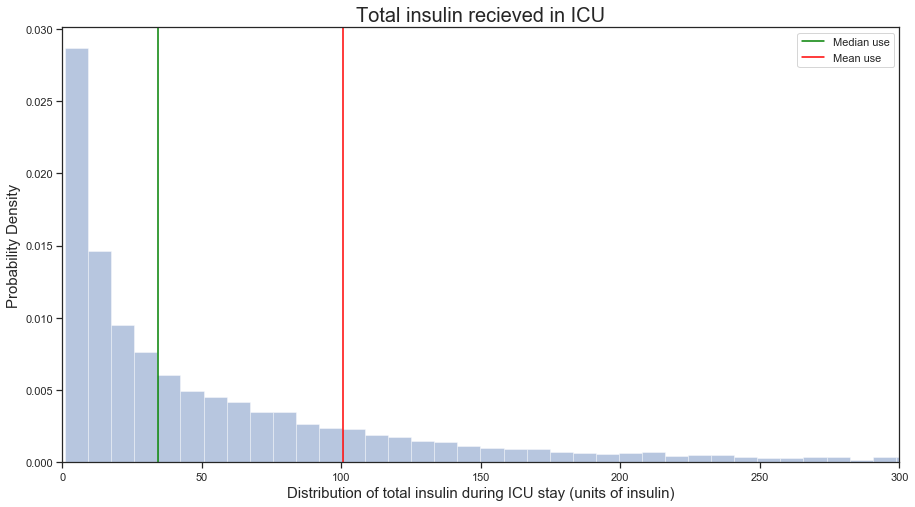

In [109]:
#insulin consumed by invidiuals
insulin_inputs[["icustay", "amount"]].groupby("icustay").sum().amount

#plot histogram
fig, ax = plt.subplots(1, 1, figsize = (15, 8))

#sns.kdeplot(insulin_inputs[["icustay", "amount"]].groupby("icustay").sum().amount, bw=0.8, shade=False, label="Rate of infusion (units/hour)")
sns.distplot(insulin_inputs[["icustay", "amount"]].groupby("icustay").sum().amount
, bins=500, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Total insulin recieved in ICU", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Distribution of total insulin during ICU stay (units of insulin)", fontsize=15)
ax.axvline(x=total_ins_indv.amount.median(), label="Median use", color="green")
ax.axvline(x=total_ins_indv.amount.mean(), label="Mean use", color="red")
plt.legend()
plt.xlim(0,300)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures\ins_use.png')

### Insulin boluses

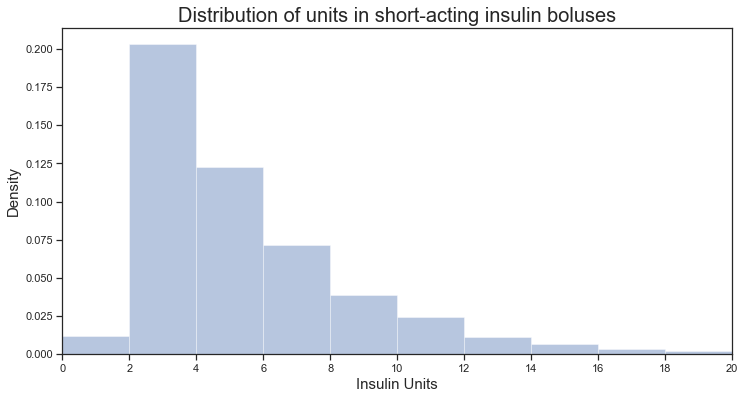

In [568]:
#set up histogram bins
bin_width=2
bin_list=np.arange(0, max(insulin_bolus.loc[insulin_bolus.type=="Short"].amount) + bin_width, bin_width)

#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (12, 6))
sns.distplot(insulin_bolus.loc[insulin_bolus.type=="Short"].amount, kde=False, bins=bin_list, norm_hist=True)
plt.xticks(bin_list)
#plt.xlim(0, 10)
plt.xlabel("Insulin Units", fontsize=15)
plt.ylabel("Density", fontsize=15)
plt.xlim(0,20)
plt.title("Distribution of units in short-acting insulin boluses", fontsize=20)
plt.show()

In [575]:
len(insulin_bolus.loc[(insulin_bolus.type=="Short") & (insulin_bolus.amount<=4)])/len(insulin_bolus.loc[(insulin_bolus.type=="Short")])

0.6466288867857836

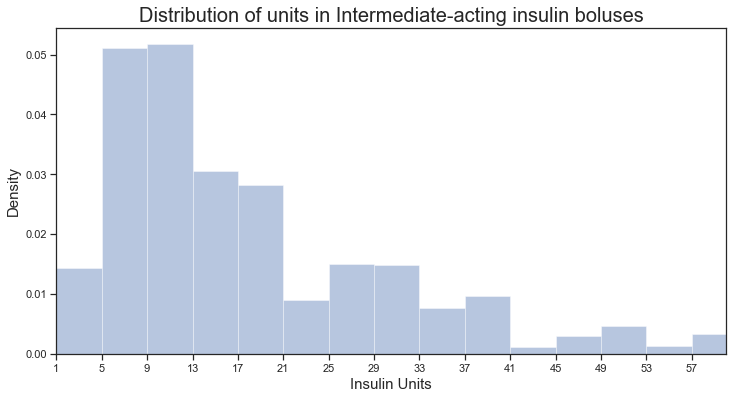

In [51]:
#set up histogram bins
bin_width=4
bin_list=np.arange(min(insulin_bolus.loc[insulin_bolus.type=="Intermediate"].amount), max(insulin_bolus.loc[insulin_bolus.type=="Intermediate"].amount) + bin_width, bin_width)

#plot histogram
fig, ax = plt.subplots(1, 1, figsize = (12, 6))
sns.distplot(insulin_bolus.loc[insulin_bolus.type=="Intermediate"].amount, kde=False, bins=bin_list, norm_hist=True)
plt.xticks(np.arange(min(insulin_bolus.loc[insulin_bolus.type=="Intermediate"].amount), max(insulin_bolus.loc[insulin_bolus.type=="Intermediate"].amount)+bin_width, bin_width))
#plt.xlim(0, 10)
plt.xlabel("Insulin Units", fontsize=15)
plt.ylabel("Density", fontsize=15)
plt.xlim(1,60)
plt.title("Distribution of units in Intermediate-acting insulin boluses", fontsize=20)
plt.show()

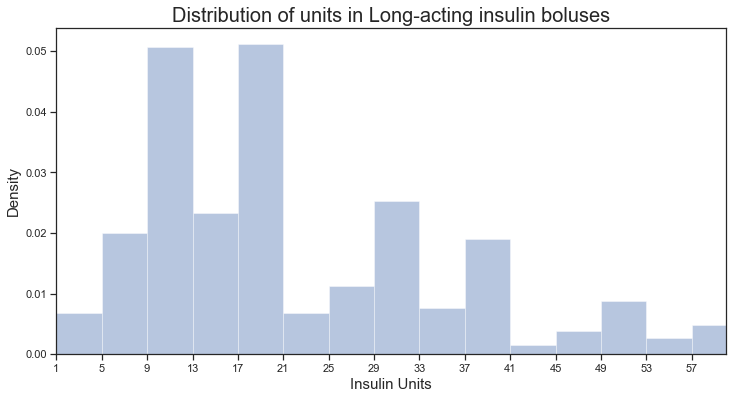

In [52]:
#set up histogram bins
bin_width=4
bin_list=np.arange(min(insulin_bolus.loc[insulin_bolus.type=="Long"].amount), max(insulin_bolus.loc[insulin_bolus.type=="Long"].amount) + bin_width, bin_width)

#plot histogram
fig, ax = plt.subplots(1, 1, figsize = (12, 6))
sns.distplot(insulin_bolus.loc[insulin_bolus.type=="Long"].amount, kde=False, bins=bin_list, norm_hist=True)
plt.xticks(np.arange(min(insulin_bolus.loc[insulin_bolus.type=="Long"].amount), max(insulin_bolus.loc[insulin_bolus.type=="Long"].amount)+bin_width, bin_width))
#plt.xlim(0, 10)
plt.xlabel("Insulin Units", fontsize=15)
plt.ylabel("Density", fontsize=15)
plt.xlim(1,60)
plt.title("Distribution of units in Long-acting insulin boluses", fontsize=20)
plt.show()

In [577]:
#get list of the gaps between all insulin boluses
bolus_freq_hr=[]

for icustay in insulin_bolus.icustay.unique():
    #get the time difference between each bolus
    bolus_ts=insulin_bolus["icu_time"].loc[insulin_bolus["icustay"]==icustay].loc[insulin_bolus["type"]=="Short"].diff()[1:]
    #convert time difference into hours
    bolus_ts=24*(bolus_ts.dt.days+bolus_ts.dt.seconds/3600/24)
    #add time differences to list
    bolus_freq_hr.extend(bolus_ts)

#convert to array
bolus_freq_hr=np.asarray(bolus_freq_hr)

# remove values over 72 (3 days)
bolus_freq_hr = bolus_freq_hr[(bolus_freq_hr <= 72)]

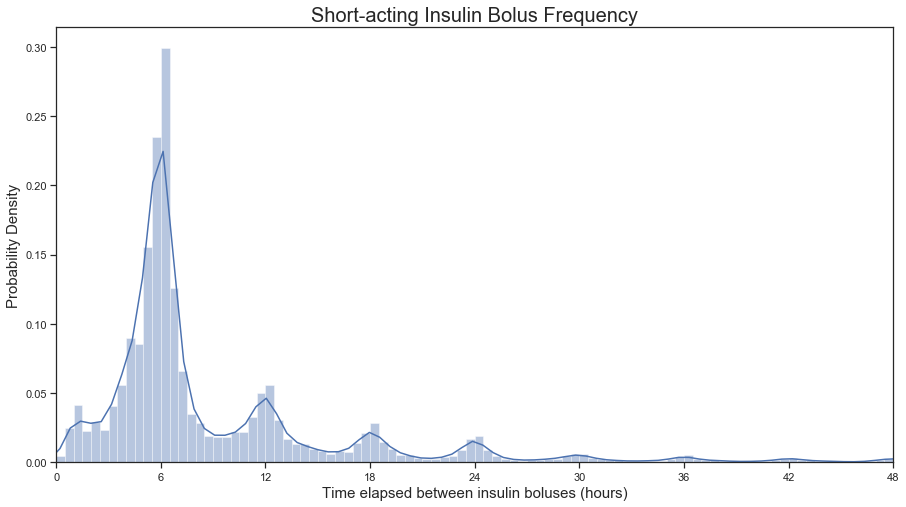

In [578]:
#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
ax=sns.distplot(bolus_freq_hr, bins=144)

plt.title("Short-acting Insulin Bolus Frequency", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time elapsed between insulin boluses (hours)", fontsize=15)
plt.xlim(0,48)
plt.xticks(range(0,49,6), range(0,49,6))
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\ins_freq.png')
#peaks are at 0, 6, 12, 18, 24

In [579]:
#Find amount around 6 hours
df_temp=pd.Series(bolus_freq_hr)
len(df_temp[df_temp > 5][df_temp < 7])/len(df_temp)

#Find amount around any multiple of 6
len(df_temp[(df_temp % 6 < 1) | (df_temp % 6 > 5)])/len(df_temp)


0.586744537043113

In [583]:
len(df_temp[df_temp < 4])/len(df_temp)

0.12099219108865411

In [56]:
# identify peaks
(density, bin_edges)=np.histogram(bolus_freq_hr, bins=144, density=True)
density=np.append(density,0)
hist_density=pd.DataFrame({"Bin Edge":bin_edges, 'Density':density})
hist_density=hist_density.set_index("Bin Edge")
with pd.option_context('display.max_rows', 150):
    display(hist_density*100)

,Density
Bin Edge,
0.0,0.422600
0.5,2.446355
1.0,4.165628
1.5,2.241617
2.0,2.905702
2.5,2.346611
3.0,4.071133
3.5,5.598793
4.0,8.976967


In [57]:
#How many different people are on drip-feed nutrition? The answer is not many ~500
len(inputs.loc[inputs.label.str.contains("TPN")].icustay.unique())

917

### Insulin Infusions

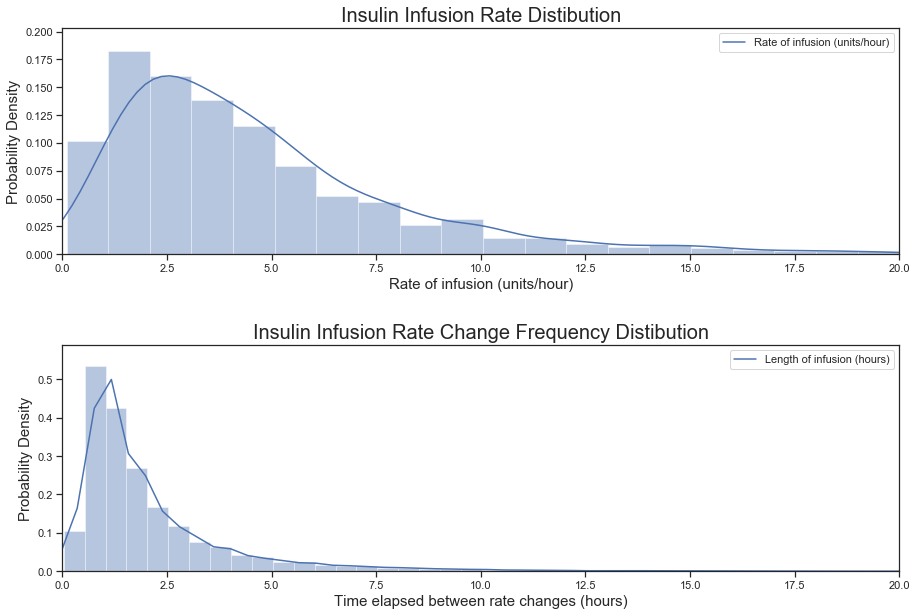

In [510]:
ins_time_trimmed=insulin_infusion.loc[insulin_infusion.length_hr<100]

fig, axs = plt.subplots(2, 1, figsize = (15, 10))
gridspec.GridSpec(2,1)


plt.subplot2grid((2,1), (0,0))
sns.kdeplot(insulin_infusion["rate"], bw=0.8, shade=False, label="Rate of infusion (units/hour)")
sns.distplot(insulin_infusion["rate"], bins=20, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Insulin Infusion Rate Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Rate of infusion (units/hour)", fontsize=15)
plt.xlim(0,20)

plt.subplot2grid((2,1), (1,0))
sns.kdeplot(ins_time_trimmed["length_hr"], bw=0.3, shade=False, label="Length of infusion (hours)")
sns.distplot(ins_time_trimmed["length_hr"], bins=100, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Insulin Infusion Rate Change Frequency Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time elapsed between rate changes (hours)", fontsize=15)
plt.xlim(0,20)

#Add vertical space
fig.subplots_adjust(hspace=.4)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures\ins_infusion_stats.png')

In [511]:
insulin_infusion["length_hr"].median()

1.4

## Heatmaps + Matching

In [145]:
insulin_match=copy.deepcopy(insulin_inputs)
glc_match=copy.deepcopy(glc_measurements)

#drop error and warning columns
insulin_match=insulin_match.set_index("icu_time").drop(["raw_amount", 'status'], axis=1)

glc_match.columns=['icustay', 'icu_admit', 'icu_discharge', 'glc_charttime', 'hadm', 'glc_item',
       'glc_label', 'subject', 'glc_unit', 'glc_value', 'glc_type']

insulin_match.columns=['icustay', 'icu_admit', 'icu_discharge', 'subject', 'hadm', 'diagnosis',
       'ins_item', 'ins_ordercat', 'ins_input_start', 'ins_input_end', 'ins_amount', 'ins_unit',
       'ins_rate', 'ins_rateuom', 'ins_ptweight', 'ins_totalamount', 'ins_totalamountuom', 'ins_originalamount', 'ins_originalrate', 'ins_label',
        'ins_delivery', 'ins_type', 'ins_length_hr']

joined_cols= ['icustay', 'icu_admit', 'icu_discharge', 'subject', 'hadm', 'diagnosis',
       'ins_item', 'ins_ordercat', 'ins_input_start', 'ins_input_end', 'ins_amount', 'ins_unit',
       'ins_rate', 'ins_rateuom', 'ins_ptweight', 'ins_totalamount', 'ins_totalamountuom', 'ins_originalamount', 'ins_originalrate','ins_label',
       'ins_type','ins_delivery', 'glc_item', 'ins_length_hr', 'glc_charttime', 'glc_value', 'glc_unit', 'glc_label', 'glc_type']

#drop the duplicates from the glucose measurements, preferencing the non-fingerstick
glc_match=glc_match.rename_axis('icu_time')
glc_match=glc_match.sort_values(by=['icustay','icu_time', 'glc_type'])
glc_match=glc_match.reset_index().drop_duplicates(subset=['icu_time', 'icustay'], keep='last').set_index('icu_time')
glc_match=glc_match.drop(['icu_admit', 'icu_discharge', 'subject', 'hadm',], axis=1)


matched_inputs=copy.deepcopy(insulin_match)
matched_inputs=matched_inputs.reindex(columns=joined_cols)

In [146]:
past_match_mins=10
future_match_mins=62

#separate the different bolus/infusion types (do short first)
short_boluses=insulin_match.loc[(insulin_match["ins_type"]=="Short") & (insulin_match["ins_delivery"]=="Bolus")]
#offset the index by how far we want to accept matches into the past (i.e. insulin dose occurs before glucose measurement)
short_boluses.index=short_boluses.index+timedelta(seconds=past_match_mins*60)
#set up a dictionary to add duplicate index amounts
agg_dict={}

for col in short_boluses.columns:
    agg_dict[col]="first"
agg_dict["ins_amount"]="sum"


aligned_df_list=[]
for icustay in short_boluses.icustay.unique():
    ins_df=short_boluses.loc[short_boluses.icustay ==icustay]
    glc_df=glc_match.loc[glc_match.icustay ==icustay].drop("icustay", axis=1)
    
    ins_df=ins_df.groupby(ins_df.index).agg(agg_dict)
    
    glc_df=glc_df.reindex(ins_df.index, method="ffill")
    aligned_stay=ins_df.join(glc_df, rsuffix="glc")
    aligned_df_list.append(aligned_stay)
    
aligned_df=pd.concat(aligned_df_list)

#reset the index back to normal
short_boluses.index=short_boluses.index-timedelta(seconds=past_match_mins*60)
aligned_df.index=aligned_df.index-timedelta(seconds=past_match_mins*60)

#removing entries with large timegaps
aligned_df["time_gap"]=aligned_df["ins_input_start"]-aligned_df["glc_charttime"]
old_size=aligned_df.shape[0]
aligned_df=aligned_df.loc[aligned_df["time_gap"]<=timedelta(seconds=future_match_mins*60)]
new_size=aligned_df.shape[0]
print("Exclusion: Gap between insulin administration and glucose measurement larger than", future_match_mins, "minutes in the future, or", past_match_mins , "minutes in the past")
print("Removed: ", old_size-new_size, ", ", round(100*(old_size-new_size)/old_size,4), "% of measurements")
print("Remaining: ", new_size)

Exclusion: Gap between insulin administration and glucose measurement larger than 62 minutes in the future, or 10 minutes in the past
Removed:  16849 ,  19.2244 % of measurements
Remaining:  70795


In [147]:
past_match_mins=10
future_match_mins=62

#separate the different bolus/infusion types (do short first)
infusions_match=insulin_match.loc[(insulin_match["ins_type"]=="Short") & (insulin_match["ins_delivery"]=="Infusion")]
#offset the index by how far we want to accept matches into the past (i.e. insulin dose occurs before glucose measurement)
infusions_match.index=infusions_match.index+timedelta(seconds=past_match_mins*60)
#set up a dictionary to add duplicate index amounts
agg_dict={}

for col in infusions_match.columns:
    agg_dict[col]="first"
agg_dict["ins_amount"]="sum"


aligned_infusions_list=[]
for icustay in infusions_match.icustay.unique():
    ins_df=infusions_match.loc[infusions_match.icustay ==icustay]
    glc_df=glc_match.loc[glc_match.icustay ==icustay].drop("icustay", axis=1)
    
    ins_df=ins_df.groupby(ins_df.index).agg(agg_dict)
    
    glc_df=glc_df.reindex(ins_df.index, method="ffill")
    aligned_stay=ins_df.join(glc_df, rsuffix="glc")
    aligned_infusions_list.append(aligned_stay)
    
aligned_infusions=pd.concat(aligned_infusions_list)

#reset the index back to normal
infusions_match.index=infusions_match.index-timedelta(seconds=past_match_mins*60)
aligned_infusions.index=aligned_infusions.index-timedelta(seconds=past_match_mins*60)

#removing entries with large timegaps
aligned_infusions["time_gap"]=aligned_infusions["ins_input_start"]-aligned_infusions["glc_charttime"]
old_size=aligned_infusions.shape[0]
aligned_infusions=aligned_infusions.loc[aligned_infusions["time_gap"]<=timedelta(seconds=future_match_mins*60)]
new_size=aligned_infusions.shape[0]
print("Exclusion: Gap between insulin administration and glucose measurement larger than", future_match_mins, "minutes in the future, or", past_match_mins , "minutes in the past")
print("Removed: ", old_size-new_size, ", ", round(100*(old_size-new_size)/old_size,4), "% of measurements")
print("Remaining: ", new_size)

Exclusion: Gap between insulin administration and glucose measurement larger than 62 minutes in the future, or 10 minutes in the past
Removed:  2345 ,  5.5231 % of measurements
Remaining:  40113


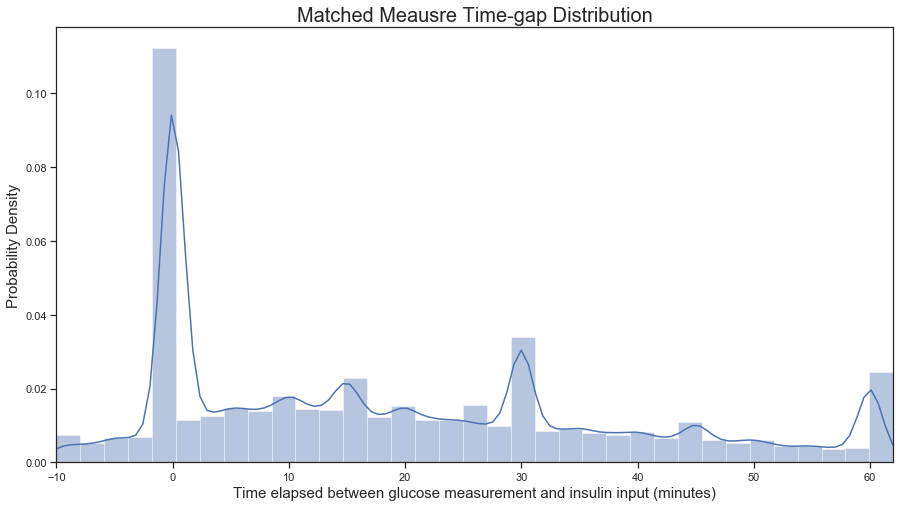

In [60]:
#plot glucose histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot((aligned_df.time_gap.dt.seconds+aligned_df.time_gap.dt.days*3600*24)/60, shade=False, bw=1)
sns.distplot((aligned_df.time_gap.dt.seconds+aligned_df.time_gap.dt.days*3600*24)/60, bins=35, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})


plt.title("Matched Meausre Time-gap Distribution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time elapsed between glucose measurement and insulin input (minutes)", fontsize=15)
plt.xlim(-10,62)
plt.gca().get_legend().remove()
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\gap_dist.png')

In [61]:
#create aligned_df split by diabetes status
aligned_df_dia=aligned_df.loc[aligned_df.icustay.isin(dia_icustays)]
aligned_df_no_dia=aligned_df.loc[aligned_df.icustay.isin(no_dia_icustays)]
aligned_infusions_dia=aligned_infusions.loc[aligned_infusions.icustay.isin(dia_icustays)]
aligned_infusions_no_dia=aligned_infusions.loc[aligned_infusions.icustay.isin(no_dia_icustays)]

In [81]:
len(aligned_df.loc[aligned_df.time_gap<timedelta(seconds=-5*60)])/len(aligned_df)

0.02558090260611625

### Bolus Heatmaps

In [82]:
def insulin_heatmap(df, glc_base=25, ins_base=2, xlow=0, xhigh=16, ylow=75, 
                    yhigh=350, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), row_norm=False,
                   fmt="2.0f", annot=True, cbar=True, ax_title=True):

    xhigh-=ins_base
    yhigh-=glc_base

    #create categories for constructing the heatmap
    df["glc_cat"]=(df["glc_value"].apply(lambda x: myround(x, glc_base))/glc_base)
    df["ins_cat"]=(df["ins_amount"].apply(lambda x: myround(x, ins_base))/ins_base)

    #create dataframe for the heatmap using pivot_table
    heat_df=pd.pivot_table(df, values="icustay", index=["glc_cat"], columns=["ins_cat"], aggfunc="count")

    #drop the unneeeded categorical variables
    df=df.drop(["glc_cat", "ins_cat"], axis=1)

    #trim the heatmap dataframe based on the lmits specificed
    heat_df=heat_df.loc[ylow/glc_base:yhigh/glc_base:,xlow/ins_base:xhigh/ins_base:]

    #normalize rows
    if row_norm==True:
        heat_df=heat_df.div(heat_df.sum(axis=1), axis=0)
    
    #create labels for the x and y ticks
    heat_xtick=np.arange(xlow, xhigh+ins_base*2, ins_base)
    heat_ytick=np.arange(ylow, yhigh+glc_base*2, glc_base)

    #plot heatmap
    ax=sns.heatmap(heat_df, robust=True, annot=annot, cbar=cbar, cmap=cmap, fmt=fmt, xticklabels=heat_xtick, yticklabels=heat_ytick, norm=norm)

    #axis_titles
    if ax_title==True:
        plt.ylabel("Blood glucose (mg/dL)", fontsize=20)
        plt.xlabel("Insulin dose (units)", fontsize=20)
    else:
        ax.xaxis.label.set_visible(False)
        ax.yaxis.label.set_visible(False)

    #invert axis and offset labels
    ax.invert_yaxis()
    ax.set_yticks(np.arange(0, ((yhigh-ylow)/glc_base)+2))
    ax.set_xticks(np.arange(0, ((xhigh-xlow)/ins_base)+2))
    
    sns.set(font_scale=1)

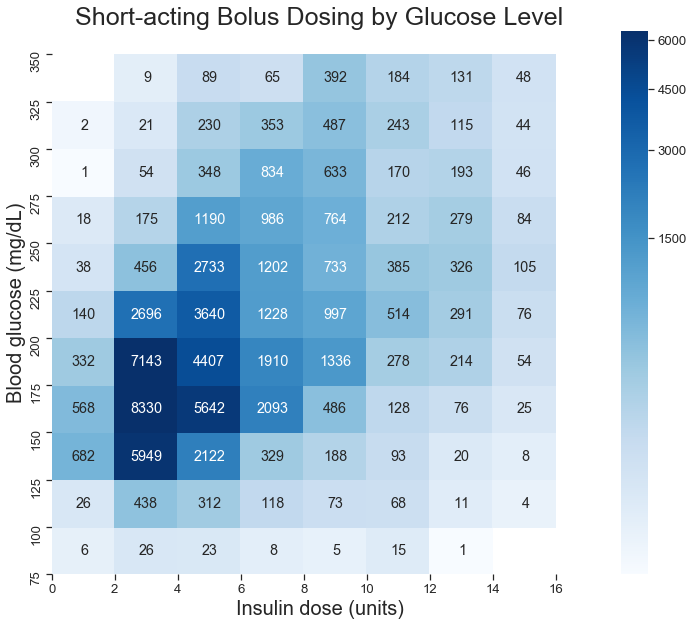

In [83]:
sns.set(style="ticks", font_scale=1.2)
fig, ax = plt.subplots(1, 1, figsize = (12, 10))


insulin_heatmap(aligned_df, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.))

plt.title("Short-acting Bolus Dosing by Glucose Level", fontsize=25)

plt.show()

sns.set(font_scale=1)

fig.savefig('C:\Documents\Thesis\Figures/bolus_heat.png')

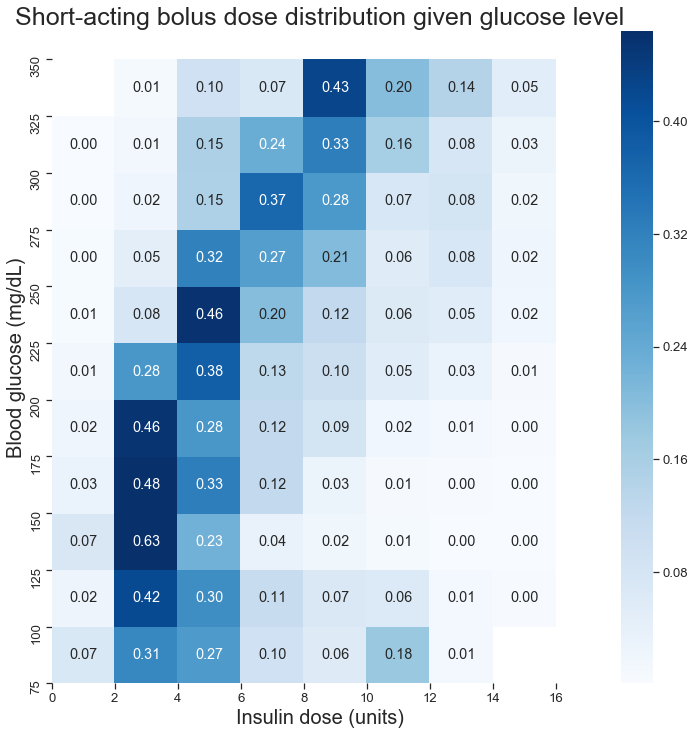

In [65]:
sns.set(style="ticks", font_scale=1.2)
fig, ax = plt.subplots(1, 1, figsize = (12, 12))


insulin_heatmap(aligned_df, cmap="Blues", norm=colors.PowerNorm(gamma=1./1.), fmt="2.2f", row_norm=True)

plt.title("Short-acting bolus dose distribution given glucose level", fontsize=25)

plt.show()

sns.set(font_scale=1)



In [66]:
aligned_infusions.glc_value.median()

143.0

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



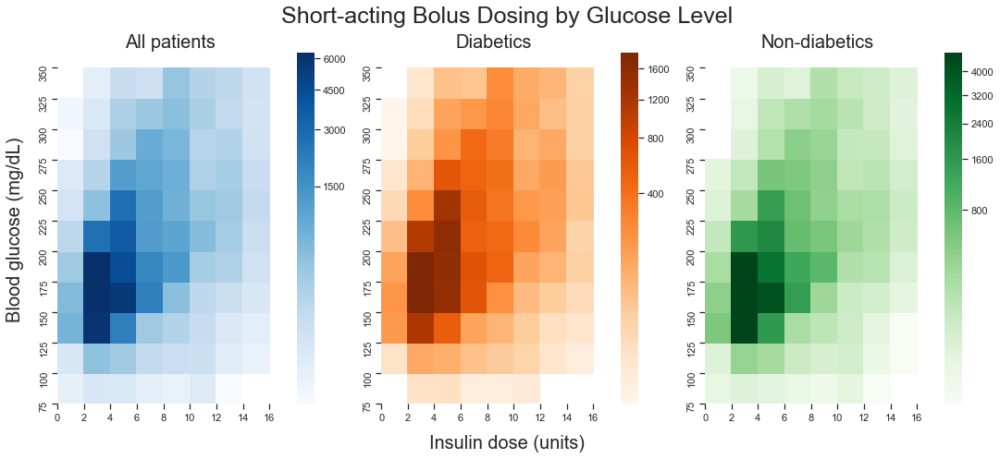

In [67]:
sns.set(style="ticks", font_scale=1)

fig, axs = plt.subplots(2, 1, figsize = (18, 7))
gridspec.GridSpec(1,3)


plt.subplot2grid((1,3), (0,0))
insulin_heatmap(aligned_df, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("All patients", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,1))
insulin_heatmap(aligned_df_dia, cmap="Oranges", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("Diabetics", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,2))
insulin_heatmap(aligned_df_no_dia, cmap="Greens", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("Non-diabetics", fontsize=20)

plt.suptitle("Short-acting Bolus Dosing by Glucose Level", fontsize=25)

fig.text(0.5, 0.04, 'Insulin dose (units)', ha='center', va='center', fontsize=20)
fig.text(0.09, 0.5, 'Blood glucose (mg/dL)', ha='center', va='center', rotation='vertical', fontsize=20)

fig.subplots_adjust(wspace=.15)
plt.show()

sns.set(font_scale=1)

fig.savefig('C:\Documents\Thesis\Figures/bolus_heat_triple.png')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



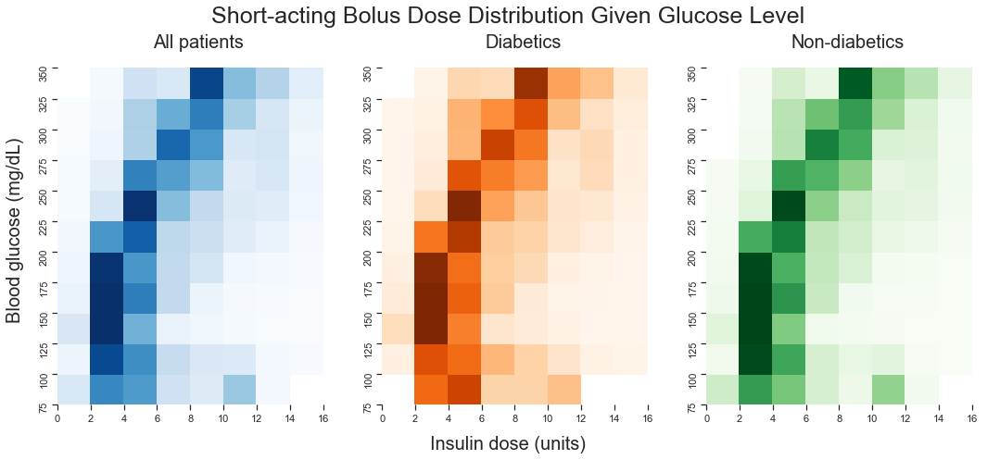

In [68]:
sns.set(style="ticks", font_scale=1)

fig, axs = plt.subplots(2, 1, figsize = (18, 7))
gridspec.GridSpec(1,3)


plt.subplot2grid((1,3), (0,0))
insulin_heatmap(aligned_df, cmap="Blues", norm=colors.PowerNorm(gamma=1./1.), row_norm=True, annot=False, cbar=False, ax_title=False)
plt.title("All patients", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,1))
insulin_heatmap(aligned_df_dia, cmap="Oranges", norm=colors.PowerNorm(gamma=1./1.), row_norm=True, annot=False, cbar=False, ax_title=False)
plt.title("Diabetics", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,2))
insulin_heatmap(aligned_df_no_dia, cmap="Greens", norm=colors.PowerNorm(gamma=1./1.), row_norm=True, annot=False, cbar=False, ax_title=False)
plt.title("Non-diabetics", fontsize=20)

plt.suptitle("Short-acting Bolus Dose Distribution Given Glucose Level", fontsize=25)
fig.subplots_adjust(wspace=.15)

fig.text(0.5, 0.04, 'Insulin dose (units)', ha='center', va='center', fontsize=20)
fig.text(0.09, 0.5, 'Blood glucose (mg/dL)', ha='center', va='center', rotation='vertical', fontsize=20)

plt.show()

sns.set(font_scale=1)

fig.savefig('C:\Documents\Thesis\Figures/bolus_heat_triple_norm.png')

### Infusion Heatmaps

In [84]:
def insulin_heatmap_infusion(df, glc_base=25, ins_base=2, xlow=0, xhigh=16, ylow=75, 
                    yhigh=350, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), row_norm=False,
                   fmt="2.0f", annot=True, cbar=True, ax_title=True):

    xhigh-=ins_base
    yhigh-=glc_base

    #create categories for constructing the heatmap
    df["glc_cat"]=(df["glc_value"].apply(lambda x: myround(x, glc_base))/glc_base)
    df["ins_cat"]=(df["ins_rate"].apply(lambda x: myround(x, ins_base))/ins_base)

    #create dataframe for the heatmap using pivot_table
    heat_df=pd.pivot_table(df, values="icustay", index=["glc_cat"], columns=["ins_cat"], aggfunc="count")

    #drop the unneeeded categorical variables
    df=df.drop(["glc_cat", "ins_cat"], axis=1)

    #trim the heatmap dataframe based on the lmits specificed
    heat_df=heat_df.loc[ylow/glc_base:yhigh/glc_base:,xlow/ins_base:xhigh/ins_base:]

    #normalize rows
    if row_norm==True:
        heat_df=heat_df.div(heat_df.sum(axis=1), axis=0)
    
    #create labels for the x and y ticks
    heat_xtick=np.arange(xlow, xhigh+ins_base*2, ins_base)
    heat_ytick=np.arange(ylow, yhigh+glc_base*2, glc_base)

    #plot heatmap
    ax=sns.heatmap(heat_df, robust=True, annot=annot, cbar=cbar, cmap=cmap, fmt=fmt, xticklabels=heat_xtick, yticklabels=heat_ytick, norm=norm)

    #axis_titles
    if ax_title==True:
        plt.ylabel("Blood glucose (mg/dL)", fontsize=20)
        plt.xlabel("Infusion rate (units/hour)", fontsize=20)
    else:
        ax.xaxis.label.set_visible(False)
        ax.yaxis.label.set_visible(False)

    #invert axis and offset labels
    ax.invert_yaxis()
    ax.set_yticks(np.arange(0, ((yhigh-ylow)/glc_base)+2))
    ax.set_xticks(np.arange(0, ((xhigh-xlow)/ins_base)+2))
    
    sns.set(font_scale=1)

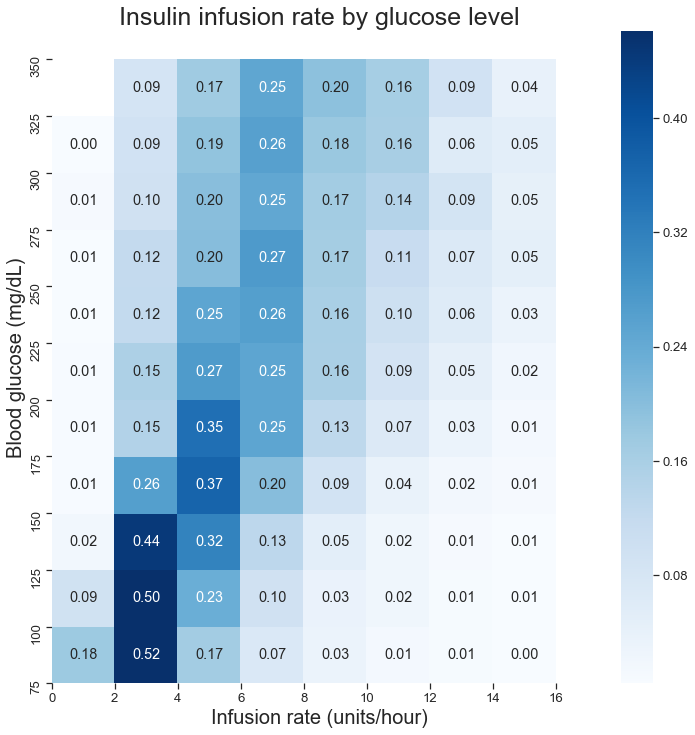

In [85]:
sns.set(style="ticks", font_scale=1.2)
fig, ax = plt.subplots(1, 1, figsize = (12, 12))

insulin_heatmap_infusion(aligned_infusions, cmap="Blues", norm=colors.PowerNorm(gamma=1./1.), fmt="2.2f", row_norm=True)

plt.title("Insulin infusion rate by glucose level", fontsize=25)

plt.show()

sns.set(font_scale=1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



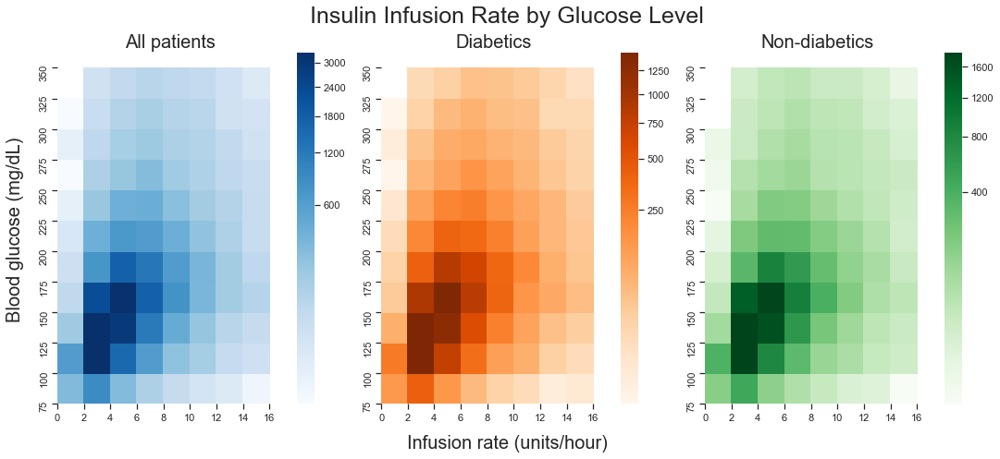

In [86]:
sns.set(style="ticks", font_scale=1)

fig, axs = plt.subplots(2, 1, figsize = (18, 7))
gridspec.GridSpec(1,3)


plt.subplot2grid((1,3), (0,0))
insulin_heatmap_infusion(aligned_infusions, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("All patients", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,1))
insulin_heatmap_infusion(aligned_infusions_dia, cmap="Oranges", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("Diabetics", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,2))
insulin_heatmap_infusion(aligned_infusions_no_dia, cmap="Greens", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("Non-diabetics", fontsize=20)

plt.suptitle("Insulin Infusion Rate by Glucose Level", fontsize=25)

fig.text(0.5, 0.04, 'Infusion rate (units/hour)', ha='center', va='center', fontsize=20)
fig.text(0.09, 0.5, 'Blood glucose (mg/dL)', ha='center', va='center', rotation='vertical', fontsize=20)

fig.subplots_adjust(wspace=.15)
plt.show()

sns.set(font_scale=1)

fig.savefig('C:\Documents\Thesis\Figures/infusion_heat_triple.png')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



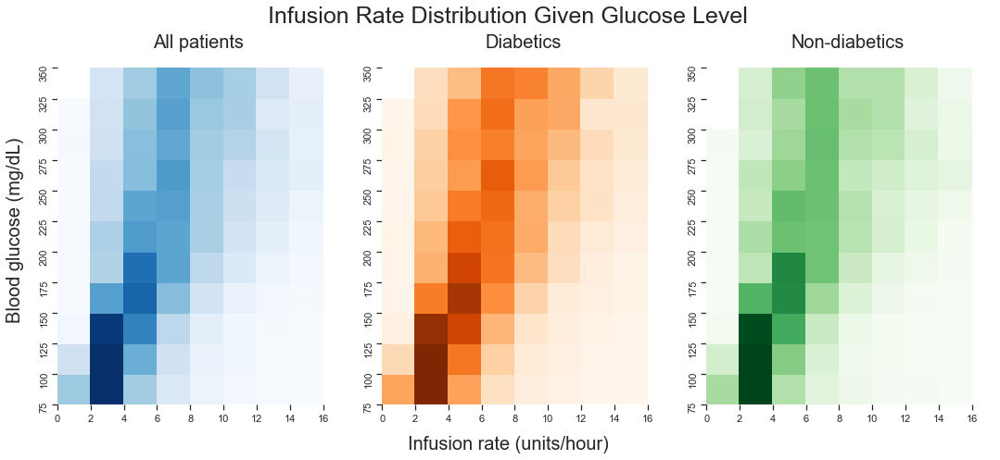

In [87]:
sns.set(style="ticks", font_scale=1)

fig, axs = plt.subplots(1, 3, figsize = (18, 7))
gridspec.GridSpec(1,3)


plt.subplot2grid((1,3), (0,0))
insulin_heatmap_infusion(aligned_infusions, cmap="Blues", norm=colors.PowerNorm(gamma=1./1.), row_norm=True, annot=False, cbar=False, ax_title=False)
plt.title("All patients", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,1))
insulin_heatmap_infusion(aligned_infusions_dia, cmap="Oranges", norm=colors.PowerNorm(gamma=1./1.), row_norm=True, annot=False, cbar=False, ax_title=False)
plt.title("Diabetics", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,3), (0,2))
insulin_heatmap_infusion(aligned_infusions_no_dia, cmap="Greens", norm=colors.PowerNorm(gamma=1./1.), row_norm=True, annot=False, cbar=False, ax_title=False)
plt.title("Non-diabetics", fontsize=20)

plt.suptitle("Infusion Rate Distribution Given Glucose Level", fontsize=25)
fig.subplots_adjust(wspace=.15)

fig.text(0.5, 0.04, 'Infusion rate (units/hour)', ha='center', va='center', fontsize=20)
fig.text(0.09, 0.5, 'Blood glucose (mg/dL)', ha='center', va='center', rotation='vertical', fontsize=20)

plt.show()

sns.set(font_scale=1)

fig.savefig('C:\Documents\Thesis\Figures/infusion_heat_triple_norm.png')

## Dextrose inputs 

In [88]:
print("Stays that recieve dextrose", dextrose_inputs.icustay.nunique(), "(",round(100*dextrose_inputs.icustay.nunique()/admissions.icustay.nunique(),2),"%)")
print("Stays that recieve dextrose bolus", dextrose_bolus.icustay.nunique(), "(",round(100*dextrose_bolus.icustay.nunique()/admissions.icustay.nunique(),2),"%)")
print("Stays that recieve dextrose infusion", dextrose_infusion.icustay.nunique(), "(",round(100*dextrose_infusion.icustay.nunique()/admissions.icustay.nunique(),2),"%)")


Stays that recieve dextrose 15820 ( 80.33 %)
Stays that recieve dextrose bolus 13543 ( 68.77 %)
Stays that recieve dextrose infusion 10682 ( 54.24 %)


In [89]:


print("proportion of dextrose delivered in 5% concentration:", round(dextrose_inputs.groupby("label").dxt_amount.sum()["Dextrose 5%"]/dextrose_inputs.groupby("label").dxt_amount.sum().sum(),4))
print("proportion of dextrose inputs with 5% concentration:", round(dextrose_inputs.groupby("label").icustay.count()["Dextrose 5%"]/dextrose_inputs.groupby("label").dxt_amount.count().sum(),4))

dextrose_inputs.groupby(["delivery", "concentration"]).count()

proportion of dextrose delivered in 5% concentration: 0.9503
proportion of dextrose inputs with 5% concentration: 0.9816


icustay  icu_admit  icu_discharge  subject    hadm  \
delivery concentration                                                       
Bolus    0.05            178125     178125         178125   178125  178125   
         0.10                 2          2              2        2       2   
         0.50              3378       3378           3378     3378    3378   
Infusion 0.05            139915     139915         139915   139915  139915   
         0.10              1165       1165           1165     1165    1165   
         0.20                47         47             47       47      47   

                        diagnosis    item  ordercat  input_start  input_end  \
delivery concentration                                                        
Bolus    0.05              178125  178125    178125       178125     178125   
         0.10                   2       2         2            2          2   
         0.50                3378    3378      3378         3378       3378   
Infusion 0.05              139915  139915    139915       139915     139915   
         0.10                1165    1165      1165         1165       1165   
         0.20                  47      47        47           47         47   

                        ...  totalamountuom  originalamount  originalrate  \
delivery concentration  ...                                                 
Bolus    0.05           ...          178125          178125        178125   
         0.10           ...               2               2             2   
         0.50           ...               0            3378          3378   
Infusion 0.05           ...          139915          139915        139915   
         0.10           ...            1165            1165          1165   
         0.20           ...              47              47            47   

                        status   label  icu_time  length_hr  raw_amount  \
delivery concentration                                                    
Bolus    0.05           178125  178125    178125          0           0   
         0.10                2       2         2          0           0   
         0.50             3378    3378      3378          0           0   
Infusion 0.05           139915  139915    139915     139915      139915   
         0.10             1165    1165      1165       1165        1165   
         0.20               47      47        47         47          47   

                        dxt_rate  dxt_amount  
delivery concentration                        
Bolus    0.05                  0      178125  
         0.10                  0           2  
         0.50                  0        3378  
Infusion 0.05             139915      139915  
         0.10               1165        1165  
         0.20                 47          47  

[6 rows x 26 columns]

In [90]:
181675/(181675+140376)

0.5641187265371013

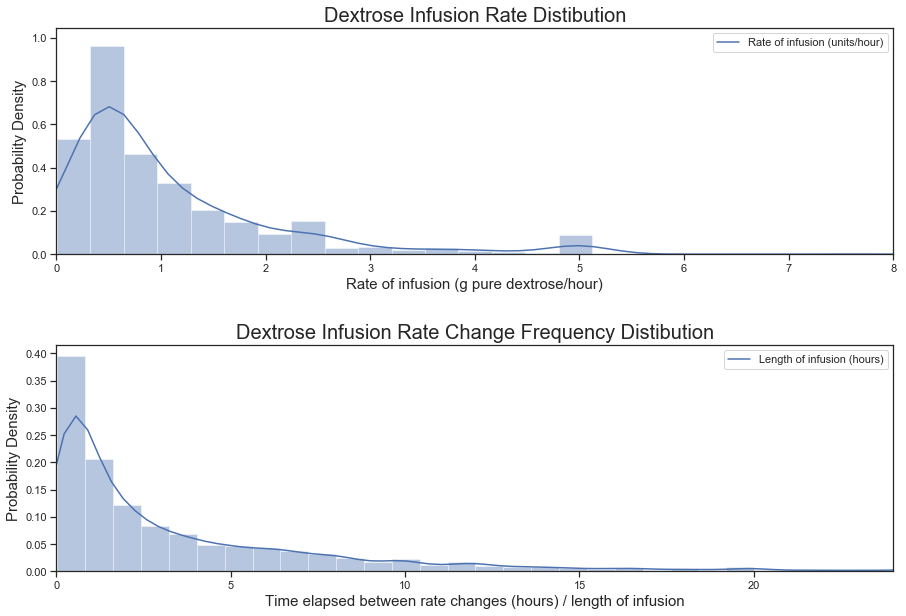

In [91]:
dxt_time_trimmed=dextrose_infusion.loc[dextrose_infusion.length_hr<40]
dxt_rate_trimmed=dextrose_infusion.loc[dextrose_infusion.rate<100]

sns.set_style("ticks")
fig, axs = plt.subplots(2, 1, figsize = (15, 10))
gridspec.GridSpec(2,1)


plt.subplot2grid((2,1), (0,0))
sns.kdeplot(dxt_rate_trimmed["dxt_rate"], bw=0.3, shade=False, label="Rate of infusion (units/hour)")
sns.distplot(dxt_rate_trimmed["dxt_rate"], bins=50, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Dextrose Infusion Rate Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Rate of infusion (g pure dextrose/hour)", fontsize=15)
plt.xlim(0,8)

plt.subplot2grid((2,1), (1,0))
sns.kdeplot(dxt_time_trimmed["length_hr"], bw=0.5, shade=False, label="Length of infusion (hours)")
sns.distplot(dxt_time_trimmed["length_hr"], bins=50, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Dextrose Infusion Rate Change Frequency Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time elapsed between rate changes (hours) / length of infusion", fontsize=15)
plt.xlim(0,24)

#Add vertical space
fig.subplots_adjust(hspace=.4)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures\dxt_infusion_stats.png')

In [101]:
len(dextrose_inputs.loc[dextrose_inputs.length_hr<0.02])/len(dextrose_inputs)

0.0

In [102]:
len(dextrose_infusion.loc[dextrose_infusion.length_hr<=3])/len(dextrose_infusion)

0.6272648040417497

In [103]:
dextrose_infusion.length_hr.median()

1.7833333333333332

In [104]:
len(dextrose_bolus.loc[dextrose_bolus.dxt_amount<=10])/len(dextrose_bolus)

0.9225255502603235

## Dextrose and glucose matching

In [95]:
dxt_match.columns

Index(['icustay', 'icu_admit', 'icu_discharge', 'subject', 'hadm', 'diagnosis',
       'dxt_item', 'dxt_ordercat', 'dxt_input_start', 'dxt_input_end',
       'dxt_amount', 'dxt_unit', 'dxt_rate', 'dxt_rateuom', 'dxt_ptweight',
       'dxt_totalamount', 'dxt_totalamountuom', 'dxt_label',
       'dxt_concentration', 'dxt_delivery', 'dxt_length_hr', 'dxt_pure_rate',
       'dxt_pure_amount'],
      dtype='object')

In [97]:
dxt_match=copy.deepcopy(dextrose_inputs)
glc_match=copy.deepcopy(glc_measurements)

dxt_match=dxt_match.set_index("icu_time").drop(["raw_amount", 'status', 'originalamount', 'originalrate'], axis=1)

glc_match.columns=['icustay', 'icu_admit', 'icu_discharge', 'glc_charttime', 'hadm', 'glc_item',
       'glc_label', 'subject', 'glc_unit', 'glc_value', 'glc_type']

dxt_match.columns=['icustay', 'icu_admit', 'icu_discharge', 'subject', 'hadm', 'diagnosis',
       'dxt_item', 'dxt_ordercat', 'dxt_input_start', 'dxt_input_end', 'dxt_amount', 'dxt_unit',
       'dxt_rate', 'dxt_rateuom', 'dxt_ptweight', 'dxt_totalamount', 'dxt_totalamountuom', 'dxt_label',
        'dxt_concentration', 'dxt_delivery','dxt_length_hr', 'dxt_pure_rate', 'dxt_pure_amount']

joined_cols= ['icustay', 'icu_admit', 'icu_discharge', 'subject', 'hadm', 'diagnosis',
       'dxt_item', 'dxt_ordercat', 'dxt_input_start', 'dxt_input_end', 'dxt_amount', 'dxt_unit',
       'dxt_rate', 'dxt_rateuom', 'dxt_ptweight', 'dxt_totalamount', 'dxt_totalamountuom', 'dxt_label',
       'dxt_icu_time', 'dxt_concentration', 'dxt_delivery','dxt_length_hr', 'dxt_pure_rate', 'dxt_pure_amount'
        'glc_item', 'glc_charttime', 'glc_value', 'glc_unit', 'glc_label', 'glc_type']

#drop the duplicates from the glucose measurements, preferencing the non-fingerstick
glc_match=glc_match.rename_axis('icu_time')
glc_match=glc_match.sort_values(by=['icustay','icu_time', 'glc_type'])
glc_match=glc_match.reset_index().drop_duplicates(subset=['icu_time', 'icustay'], keep='last').set_index('icu_time')
glc_match=glc_match.drop(['icu_admit', 'icu_discharge', 'subject', 'hadm',], axis=1)

In [98]:
past_match_mins=10
future_match_mins=62

#separate the different bolus/infusion types (do short first)
d5_match=dxt_match.loc[(dxt_match["dxt_delivery"]=="Bolus") & (dxt_match["dxt_concentration"]==0.05)]
#offset the index by how far we want to accept matches into the past (i.e. dextrose dose occurs before glucose measurement)
d5_match.index=d5_match.index+timedelta(seconds=past_match_mins*60)
#set up a dictionary to add duplicate index amounts
agg_dict={}

for col in d5_match.columns:
    agg_dict[col]="first"
agg_dict["dxt_amount"]="sum"


aligned_list=[]
for icustay in d5_match.icustay.unique():
    dxt_df=d5_match.loc[d5_match.icustay ==icustay]
    glc_df=glc_match.loc[glc_match.icustay ==icustay].drop("icustay", axis=1)
    
    dxt_df=dxt_df.groupby(dxt_df.index).agg(agg_dict)
    
    glc_df=glc_df.reindex(dxt_df.index, method="ffill")
    aligned_stay=dxt_df.join(glc_df, rsuffix="glc")
    aligned_list.append(aligned_stay)
    
aligned_d5=pd.concat(aligned_list)

#reset the index back to normal
d5_match.index=d5_match.index-timedelta(seconds=past_match_mins*60)
aligned_d5.index=aligned_d5.index-timedelta(seconds=past_match_mins*60)

#removing entries with large timegaps
aligned_d5["time_gap"]=aligned_d5["dxt_input_start"]-aligned_d5["glc_charttime"]
old_size=aligned_d5.shape[0]
aligned_d5=aligned_d5.loc[aligned_d5["time_gap"]<=timedelta(seconds=future_match_mins*60)]
new_size=aligned_d5.shape[0]
print("Exclusion: Gap between dextrose administration and glucose measurement larger than", future_match_mins, "minutes in the future, or", past_match_mins , "minutes in the past")
print("Removed: ", old_size-new_size, ", ", round(100*(old_size-new_size)/old_size,4), "% of measurements")
print("Remaining: ", new_size)

Exclusion: Gap between dextrose administration and glucose measurement larger than 62 minutes in the future, or 10 minutes in the past
Removed:  125953 ,  70.724 % of measurements
Remaining:  52138


In [99]:
past_match_mins=10
future_match_mins=62

#separate the different bolus/infusion types (do short first)
d50_match=dxt_match.loc[(dxt_match["dxt_delivery"]=="Bolus") & (dxt_match["dxt_concentration"]==0.5)]
#offset the index by how far we want to accept matches into the past (i.e. dextrose dose occurs before glucose measurement)
d50_match.index=d50_match.index+timedelta(seconds=past_match_mins*60)
#set up a dictionary to add duplicate index amounts
agg_dict={}

for col in d50_match.columns:
    agg_dict[col]="first"
agg_dict["dxt_amount"]="sum"


aligned_list=[]
for icustay in d50_match.icustay.unique():
    dxt_df=d50_match.loc[d50_match.icustay ==icustay]
    glc_df=glc_match.loc[glc_match.icustay ==icustay].drop("icustay", axis=1)
    
    dxt_df=dxt_df.groupby(dxt_df.index).agg(agg_dict)
    
    glc_df=glc_df.reindex(dxt_df.index, method="ffill")
    aligned_stay=dxt_df.join(glc_df, rsuffix="glc")
    aligned_list.append(aligned_stay)
    
aligned_d50=pd.concat(aligned_list)

#reset the index back to normal
d50_match.index=d50_match.index-timedelta(seconds=past_match_mins*60)
aligned_d50.index=aligned_d50.index-timedelta(seconds=past_match_mins*60)

#removing entries with large timegaps
aligned_d50["time_gap"]=aligned_d50["dxt_input_start"]-aligned_d50["glc_charttime"]
old_size=aligned_d50.shape[0]
aligned_d50=aligned_d50.loc[aligned_d50["time_gap"]<=timedelta(seconds=future_match_mins*60)]
new_size=aligned_d50.shape[0]
print("Exclusion: Gap between dextrose administration and glucose measurement larger than", future_match_mins, "minutes in the future, or", past_match_mins , "minutes in the past")
print("Removed: ", old_size-new_size, ", ", round(100*(old_size-new_size)/old_size,4), "% of measurements")
print("Remaining: ", new_size)

Exclusion: Gap between dextrose administration and glucose measurement larger than 62 minutes in the future, or 10 minutes in the past
Removed:  595 ,  17.614 % of measurements
Remaining:  2783


In [100]:
def dextrose_heatmap(df, glc_base=25, dxt_base=4, xlow=0, xhigh=28, ylow=0, 
                    yhigh=350, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), row_norm=False,
                   fmt="2.0f", annot=True, cbar=True, ax_title=True):

    xhigh-=dxt_base
    #yhigh-=glc_base

    #create categories for constructing the heatmap
    df["glc_cat"]=(df["glc_value"].apply(lambda x: myround(x, glc_base))/glc_base)
    df["dxt_cat"]=(df["dxt_pure_amount"].apply(lambda x: myround(x, dxt_base))/dxt_base)

    #create dataframe for the heatmap using pivot_table
    heat_df=pd.pivot_table(df, values="icustay", index=["glc_cat"], columns=["dxt_cat"], aggfunc="count")

    #drop the unneeeded categorical variables
    df=df.drop(["glc_cat", "dxt_cat"], axis=1)

    #trim the heatmap dataframe based on the lmits specificed
    heat_df=heat_df.loc[ylow/glc_base:yhigh/glc_base:,xlow/dxt_base:xhigh/dxt_base:]

    #normalize rows
    if row_norm==True:
        heat_df=heat_df.div(heat_df.sum(axis=1), axis=0)
    
    #create labels for the x and y ticks
    heat_xtick=np.arange(xlow, xhigh+dxt_base*2, dxt_base)
    heat_ytick=np.arange(ylow, yhigh+glc_base*1, glc_base)

    #plot heatmap
    ax=sns.heatmap(heat_df, robust=True, annot=annot, cbar=cbar, cmap=cmap, fmt=fmt, xticklabels=heat_xtick, yticklabels=heat_ytick, norm=norm)

    #axis_titles
    if ax_title==True:
        plt.ylabel("Blood glucose (mg/dL)", fontsize=20)
        plt.xlabel("Dextrose dose (g of pure dextrose)", fontsize=20)
    else:
        ax.xaxis.label.set_visible(False)
        ax.yaxis.label.set_visible(False)

    #invert axis and offset labels
    ax.invert_yaxis()
    ax.set_yticks(np.arange(0, ((yhigh-ylow)/glc_base)+1))
    ax.set_xticks(np.arange(0, ((xhigh-xlow)/dxt_base)+2))
    
    sns.set(font_scale=1)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\colors.py:1215: RuntimeWarning:

invalid value encountered in less



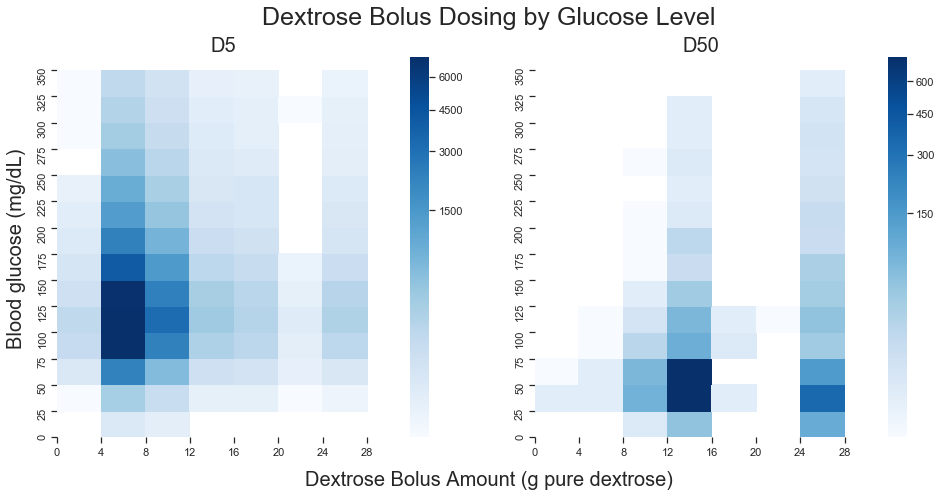

In [101]:
sns.set(style="ticks", font_scale=1)

fig, axs = plt.subplots(1, 2, figsize = (16, 7))
gridspec.GridSpec(1,2)


plt.subplot2grid((1,2), (0,0))
dextrose_heatmap(aligned_d5, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("D5", fontsize=20)

sns.set(style="ticks", font_scale=1)
plt.subplot2grid((1,2), (0,1))
dextrose_heatmap(aligned_d50, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.), ax_title=False, annot=False)
plt.title("D50", fontsize=20)

plt.suptitle("Dextrose Bolus Dosing by Glucose Level", fontsize=25)

fig.text(0.5, 0.04, 'Dextrose Bolus Amount (g pure dextrose)', ha='center', va='center', fontsize=20)
fig.text(0.09, 0.5, 'Blood glucose (mg/dL)', ha='center', va='center', rotation='vertical', fontsize=20)

fig.subplots_adjust(wspace=.15)
plt.show()

sns.set(font_scale=1)

fig.savefig('C:\Documents\Thesis\Figures/dextrose_heat.png')

In [105]:
prop_D50_hypo=(len(aligned_d50.loc[aligned_d50.glc_value<=80])/len(aligned_d50))
prop_glc_hypo=(len(glc_measurements.loc[glc_measurements.value<=80])/len(glc_measurements))

prop_D50_hypo
(prop_D50_hypo/prop_glc_hypo)/((1-prop_D50_hypo)/(1-prop_glc_hypo))


88.57043846085281

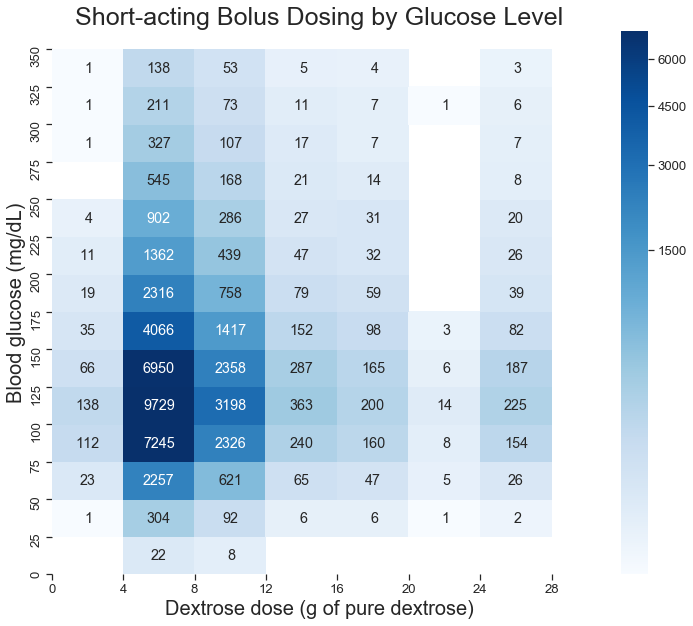

In [103]:
sns.set(style="ticks", font_scale=1.2)
fig, ax = plt.subplots(1, 1, figsize = (12, 10))


dextrose_heatmap(aligned_d5, cmap="Blues", norm=colors.PowerNorm(gamma=1./3.))

plt.title("Short-acting Bolus Dosing by Glucose Level", fontsize=25)

plt.show()

sns.set(font_scale=1)

#fig.savefig('C:\Documents\Thesis\Figures/bolus_heat.png')

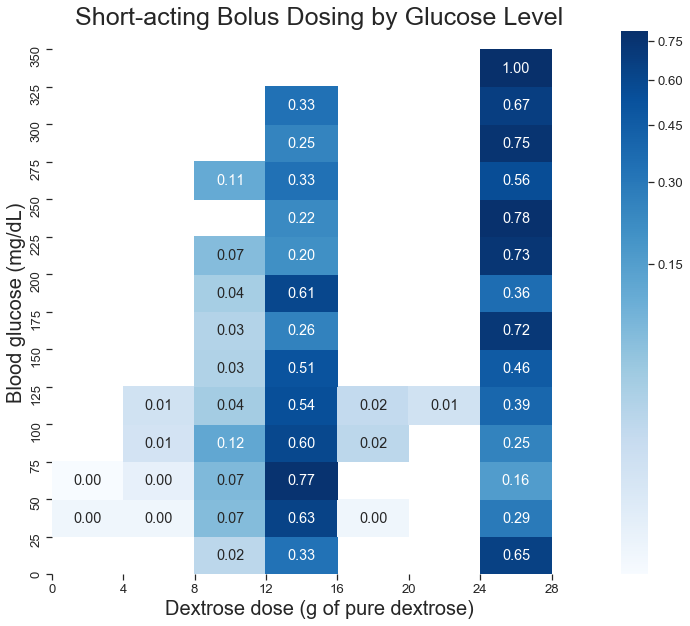

In [104]:
sns.set(style="ticks", font_scale=1.2)
fig, ax = plt.subplots(1, 1, figsize = (12, 10))


dextrose_heatmap(aligned_d50, cmap="Blues", row_norm=True, fmt="2.2f", norm=colors.PowerNorm(gamma=1./3.))

plt.title("Short-acting Bolus Dosing by Glucose Level", fontsize=25)

plt.show()

sns.set(font_scale=1)

#fig.savefig('C:\Documents\Thesis\Figures/bolus_heat.png')

## Feeding inputs 

In [116]:
print("Stays that recieve a feeding inuput", feeding_inputs.icustay.nunique(), "(",round(100*feeding_inputs.icustay.nunique()/admissions.icustay.nunique(),2),"%)")
print("Stays that recieve an enteral inuput", enteral_inputs.icustay.nunique(), "(",round(100*enteral_inputs.icustay.nunique()/admissions.icustay.nunique(),2),"%)")
print("Stays that recieve a parenteral input", parenteral_inputs.icustay.nunique(), "(",round(100*parenteral_inputs.icustay.nunique()/admissions.icustay.nunique(),2),"%)")


Stays that recieve a feeding inuput 4161 ( 21.13 %)
Stays that recieve an enteral inuput 3762 ( 19.1 %)
Stays that recieve a parenteral input 782 ( 3.97 %)


In [117]:
feeding_inputs.groupby(["delivery", "concentration"]).count()

icustay  icu_admit  icu_discharge  subject   hadm  \
delivery   concentration                                                      
Enteral    0.250000           164        164            164      164    164   
           0.500000           851        851            851      851    851   
           0.666667            77         77             77       77     77   
           0.750000           747        747            747      747    747   
           1.000000         57986      57986          57986    57986  57986   
Parenteral 0.500000           211        211            211      211    211   
           1.000000          5602       5602           5602     5602   5602   

                          diagnosis   item  ordercat  input_start  input_end  \
delivery   concentration                                                       
Enteral    0.250000             164    164       164          164        164   
           0.500000             851    851       851          851        851   
           0.666667              77     77        77           77         77   
           0.750000             747    747       747          747        747   
           1.000000           57986  57986     57986        57986      57986   
Parenteral 0.500000             211    211       211          211        211   
           1.000000            5602   5602      5602         5602       5602   

                          ...  totalamountuom  originalamount  originalrate  \
delivery   concentration  ...                                                 
Enteral    0.250000       ...             164             164           164   
           0.500000       ...             851             851           851   
           0.666667       ...              77              77            77   
           0.750000       ...             747             747           747   
           1.000000       ...           57986           57986         57986   
Parenteral 0.500000       ...             211             211           211   
           1.000000       ...            5602            5602          5602   

                          status  label  icu_time  length_hr  raw_amount  \
delivery   concentration                                                   
Enteral    0.250000          164    164       164        164         164   
           0.500000          851    851       851        851         851   
           0.666667           77     77        77         77          77   
           0.750000          747    747       747        747         747   
           1.000000        57986  57986     57986      57986       57986   
Parenteral 0.500000          211    211       211        211         211   
           1.000000         5602   5602      5602       5602        5602   

                          eff_rate  eff_amount  
delivery   concentration                        
Enteral    0.250000            164         164  
           0.500000            851         851  
           0.666667             77          77  
           0.750000            747         747  
           1.000000          57986       57986  
Parenteral 0.500000            211         211  
           1.000000           5602        5602  

[7 rows x 26 columns]

In [118]:
len(feeding_inputs.loc[feeding_inputs.concentration==1])/len(feeding_inputs)

0.9687680916542247

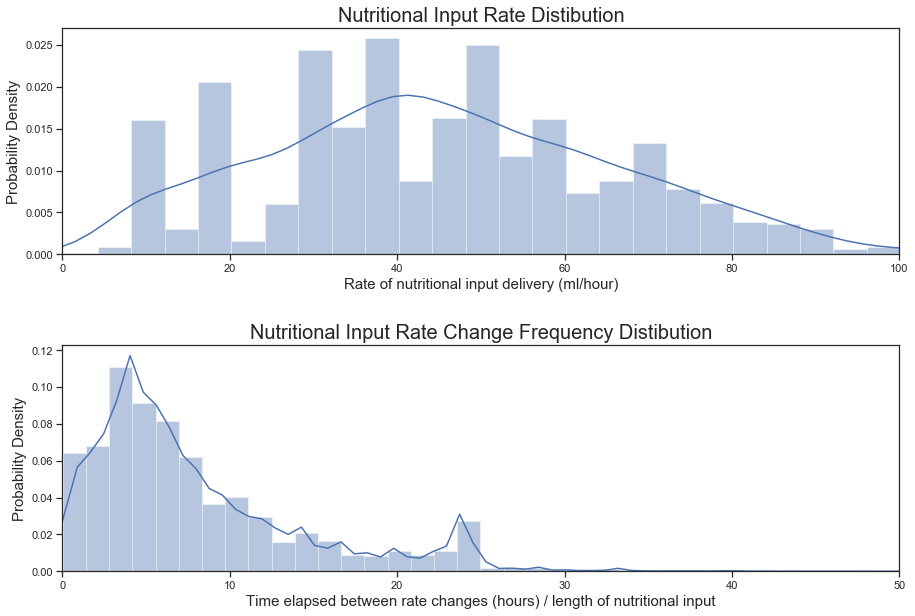

In [119]:
feed_time_trimmed=feeding_inputs.loc[feeding_inputs.length_hr<100]

sns.set_style("ticks")
fig, axs = plt.subplots(2, 1, figsize = (15, 10))
gridspec.GridSpec(2,1)


plt.subplot2grid((2,1), (0,0))
sns.kdeplot(feeding_inputs["eff_rate"], bw=5, shade=False)
sns.distplot(feeding_inputs["eff_rate"], bins=50, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Nutritional Input Rate Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Rate of nutritional input delivery (ml/hour)", fontsize=15)
plt.xlim(0,100)
plt.gca().get_legend().remove()

plt.subplot2grid((2,1), (1,0))
sns.kdeplot(feed_time_trimmed["length_hr"], bw=0.5, shade=False)
sns.distplot(feed_time_trimmed["length_hr"], bins=70, kde=True, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.title("Nutritional Input Rate Change Frequency Distibution", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time elapsed between rate changes (hours) / length of nutritional input", fontsize=15)
plt.xlim(0,50)
plt.gca().get_legend().remove()

#Add vertical space
fig.subplots_adjust(hspace=.4)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures/feed_stats.png')

In [120]:
feeding_inputs["length_hr"].median()

5.983333333333333

## Patient journeys

In [291]:
def ts_to_days(ts):
    ts.index=ts.index.days+ts.index.seconds/3600/24
    return ts

In [294]:
#create copies indexed by days #200563 is a good test case
#glucose
glc_measurements_ind=ts_to_days(glc_measurements.copy())

#insulin boluses
insulin_bolus_ind=insulin_bolus.copy().set_index("icu_time")
insulin_bolus_ind=ts_to_days(insulin_bolus_ind)

#insulin infusions
insulin_infusion_ind=insulin_infusion.copy().set_index("icu_time")
insulin_infusion_ind=ts_to_days(insulin_infusion_ind)
insulin_infusion_ind["length_day"]=insulin_infusion_ind["length_hr"]/24
insulin_infusion_ind["start_time"]=insulin_infusion_ind.index
insulin_infusion_ind["end_time"]=insulin_infusion_ind["start_time"]+insulin_infusion_ind["length_day"]

#dextrose_d50s
d50_ind=dextrose_inputs.loc[(dextrose_inputs["delivery"]=="Bolus") & (dextrose_inputs["concentration"]==0.5)].set_index("icu_time")
d50_ind=ts_to_days(d50_ind)

In [312]:
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)

def plot_icustay(icustay, save=False, show=True):
    
    fig, ax1 = plt.subplots(1, 1, figsize = (15, 8))


    #define length of stay
    icu_los= admissions.loc[admissions.icustay==icustay].icu_los.values[0]
    
    #only perform if there is insulin dosing
    if len(insulin_inputs.loc[(insulin_inputs.icustay==icustay)])>0:
    
        #create second axis
        ax2 = ax1.twinx()
        
        if len(insulin_bolus_ind.loc[(insulin_bolus_ind.icustay==icustay) & (insulin_bolus_ind.type=="Long")])>0:
            #plot long insulin boluses
            ts_ins_long=insulin_bolus_ind.loc[(insulin_bolus_ind.icustay==icustay) & (insulin_bolus_ind.type=="Long")].amount
            ax2.plot(ts_ins_long, color="green", marker='D', markersize=12, linestyle="None", label="Long-acting insulin bolus")
        
        if len(insulin_bolus_ind.loc[(insulin_bolus_ind.icustay==icustay) & (insulin_bolus_ind.type=="Intermediate")])>0:
            #plot intermediate insulin boluses
            ts_ins_int=insulin_bolus_ind.loc[(insulin_bolus_ind.icustay==icustay) & (insulin_bolus_ind.type=="Intermediate")].amount
            ax2.plot(ts_ins_int, color="darkviolet", marker='D', markersize=12, linestyle="None", label="Intermediate-acting insulin bolus")

        if len(insulin_bolus_ind.loc[(insulin_bolus_ind.icustay==icustay) & (insulin_bolus_ind.type=="Short")])>0:
            #plot short insulin boluses
            ts_ins_short=insulin_bolus_ind.loc[(insulin_bolus_ind.icustay==icustay) & (insulin_bolus_ind.type=="Short")].amount
            ax2.plot(ts_ins_short, color="blue", marker='D', markersize=12, linestyle="None", label="Short-acting insulin bolus")

        if len(insulin_infusion_ind.loc[insulin_infusion_ind.icustay==icustay])>0:
            #plot insulin infusions
            ts_ins_inf=insulin_infusion_ind.loc[insulin_infusion_ind.icustay==icustay][["rate", "start_time", "end_time"]]

            #define index positions
            rate_index=0
            start_index=1
            end_index=2
            prev_row=None
    
            for row in ts_ins_inf.itertuples(index=False):
                ax2.plot([row[start_index], row[end_index]], [row[rate_index], row[rate_index]],color="palevioletred", linewidth=3)
                #first row
                if prev_row is None:
                    ax2.plot([row[start_index], row[start_index]], [0, row[rate_index]], color="palevioletred", linewidth=3)
                #middle row with connection
                elif row[start_index]-prev_row[end_index]<(5/24/60):
                    ax2.plot([row[start_index], row[start_index]], [prev_row[rate_index], row[rate_index]], color="palevioletred", linewidth=3)
                #middle row without connection
                else:
                    ax2.plot([prev_row[end_index], prev_row[end_index]], [prev_row[rate_index], 0], color="palevioletred", linewidth=3)
                    ax2.plot([row[start_index], row[start_index]], [0, row[rate_index]], color="palevioletred", linewidth=3)
                    #ax2.plot([prev_row[end_index], row[start_index]], [0, 0], color="palevioletred", linewidth=3)
                prev_row=row
            #final row
            ax2.plot([prev_row[end_index], prev_row[end_index]], [prev_row[rate_index], 0], color="palevioletred", linewidth=3, label="Insulin Infusion")

    if len(d50_ind.loc[d50_ind.icustay==icustay])>0:
        #create third axis
        ax3 = ax1.twinx()

        if len(insulin_inputs.loc[(insulin_inputs.icustay==icustay)])>0:
            ax3.spines["right"].set_position(("axes", 1.08))
            make_patch_spines_invisible(ax3)
            ax3.spines["right"].set_visible(True)

        #plot d50s
        ts_d50=d50_ind.loc[d50_ind.icustay==icustay].amount
        ax3.plot(ts_d50, color="darkorange", marker='p', markersize=15, linestyle="None", label="D50 Dextrose Bolus")


    #plot glucose
    ts_glc=glc_measurements_ind.loc[glc_measurements_ind.icustay==icustay].value
    ax1.plot(ts_glc, color="red", marker='o', markersize=6, linewidth=2.2, label="Glucose Level")

    #add_glucose_guidlines(ax=ax1)

    #get legend
    lines, labels = ax1.get_legend_handles_labels()
    lines_collection=lines
    labels_collection=labels
    if len(insulin_inputs.loc[(insulin_inputs.icustay==icustay)])>0:
        lines2, labels2 = ax2.get_legend_handles_labels()
        lines_collection+=lines2
        labels_collection+=labels2
        ax2.set_ylabel("Insulin input amount (units or units/hour)", fontsize=15)
        ax2.set_ylim(0)
    
    if len(d50_ind.loc[d50_ind.icustay==icustay])>0:
        lines3, labels3 = ax3.get_legend_handles_labels()
        lines_collection+=lines3
        labels_collection+=labels3
        ax3.set_ylabel("D50 Dextrose Amount (mL)", fontsize=15)
        ax3.set_ylim(0)
    
    plt.legend(lines_collection, labels_collection, loc=0)
    plt.title("Blood Glucose management: ICU Stay %s" % icustay, fontsize=20)
    ax1.set_ylabel("Blood glucose (mg/dL)", fontsize=15)
    ax1.set_xlabel("Time since entering ICU (days)", fontsize=15)
    plt.xlim(0,icu_los)
    ax1.set_ylim(0)

    if save==True:
        fig.savefig('C:\Documents\Thesis\Figures\patient_journeys\journey_%s.png' % icustay)
    
    if show==True:
        plt.show()
        
    plt.close(fig)

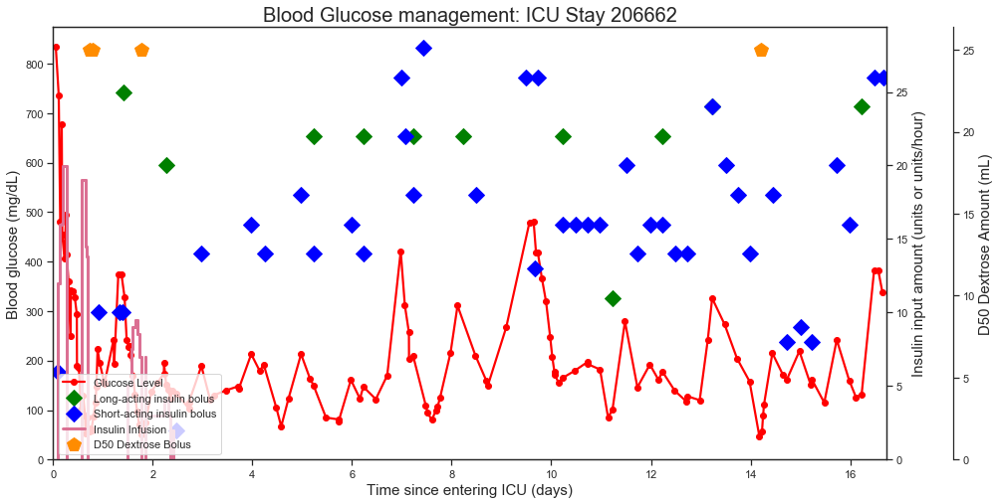

In [313]:
sns.set_style('ticks')
plot_icustay(206662, save=False)

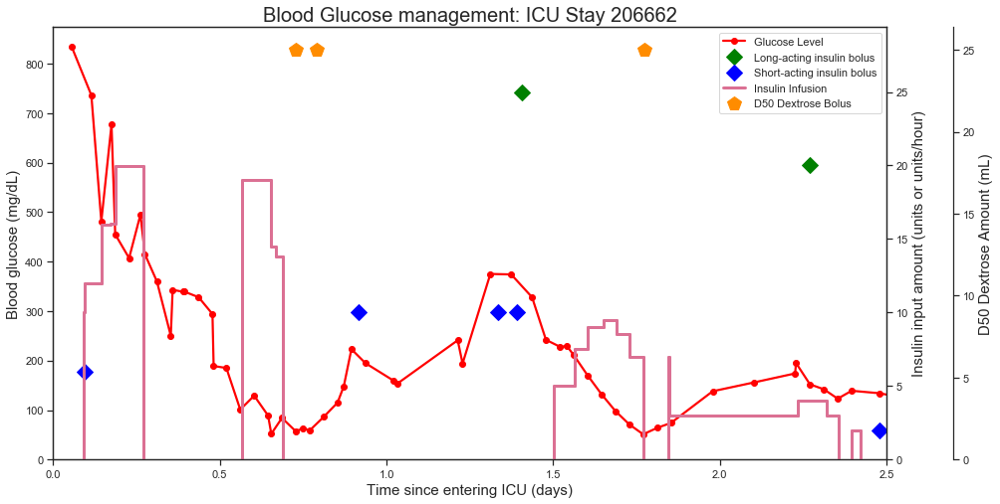

In [308]:
sns.set_style('ticks')
plot_icustay(206662, save=False)

In [15]:
# for stay in admissions.icustay.unique()[:20]:
#     plot_icustay(stay, save=True, show=False)

# #only run when you're ready, produces all the plots
# for stay in admissions.icustay.unique():
#     plot_icustay(stay, save=True, show=False)

#run the plots past a certain point
for stay in admissions.loc[admissions.icustay>=290504].icustay.unique():
    plot_icustay(stay, save=True, show=False)

In [168]:
admissions.loc[admissions.icustay>=290504].icustay.unique()

array([229055, 229063, 229065, ..., 299957, 299979, 299998], dtype=int64)

## Glucose Measurement Accuracy

In [175]:
glc_pair_list=[]
glc_all_measurements=glc_measurements.copy()
glc_all_measurements=glc_all_measurements.drop(glc_all_measurements.loc[(glc_all_measurements.item==811) | (glc_all_measurements.item==1529)].index)

for icustay in glc_all_measurements.icustay.unique():
    glc_df=glc_all_measurements.loc[glc_all_measurements.icustay==icustay]
    dup_df=glc_df[glc_df.index.duplicated(keep=False)]
    dup_df=dup_df.groupby([dup_df.index, "type"]).mean()
    if len(dup_df.index.levels[1])==2:
        glc_pair_list.append(dup_df)

glc_exact_pair=pd.concat(glc_pair_list)

temp=glc_exact_pair.drop(["item"], axis=1).reset_index(level="type")
fs_temp=temp.loc[(temp.type=="Fingerstick").values].drop("type", axis=1)
serum_temp=temp.loc[(temp.type=="Serum").values].drop("type", axis=1)
glc_exact_pair=fs_temp.merge(serum_temp, on=["icu_time", "icustay", "subject", "hadm"], suffixes=("_fs", "_serum"))
glc_exact_pair["delta"]=glc_exact_pair["value_serum"]-glc_exact_pair["value_fs"]
glc_exact_pair["mean"]=(glc_exact_pair["value_serum"]+glc_exact_pair["value_fs"])/2


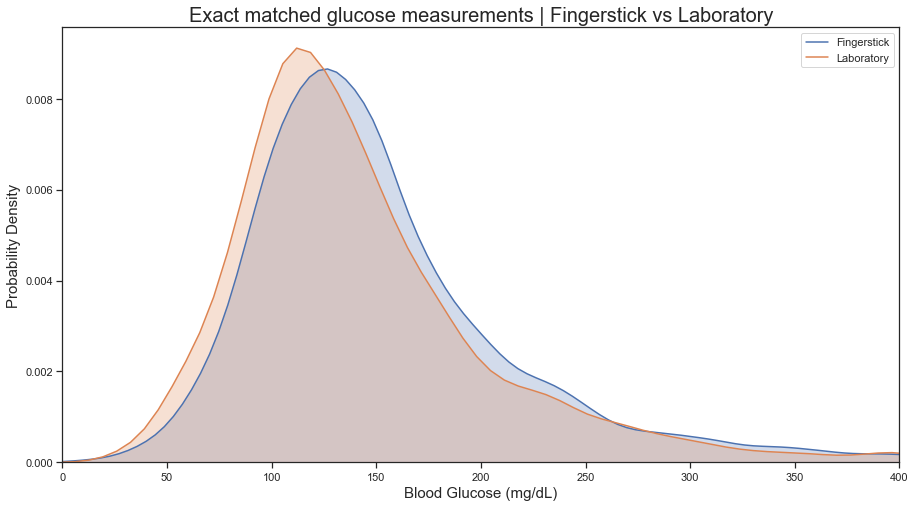

In [164]:
#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
ax=sns.kdeplot(glc_exact_pair["value_fs"], shade=True, label="Fingerstick")
ax=sns.kdeplot(glc_exact_pair["value_serum"], shade=True, label="Laboratory")
plt.title("Exact matched glucose measurements | Fingerstick vs Laboratory", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
plt.xlim(0, 400)
plt.show()

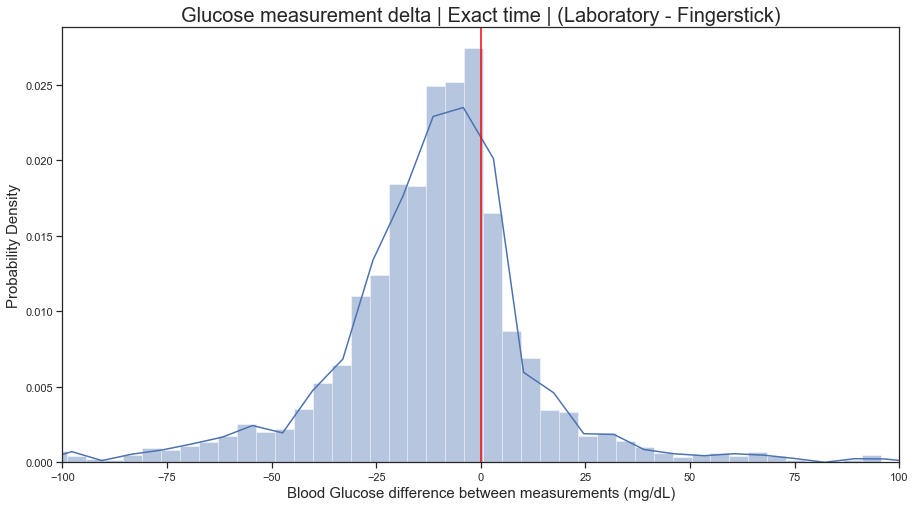

In [165]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot(glc_exact_pair["delta"], shade=False, bw=1.5, label='')
sns.distplot(glc_exact_pair["delta"], kde=True, bins=200, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
ax.axvline(x=0, label="Mean use", color="red")
plt.title("Glucose measurement delta | Exact time | (Laboratory - Fingerstick)", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose difference between measurements (mg/dL)", fontsize=15)
plt.xlim(-100, 100)
plt.show()

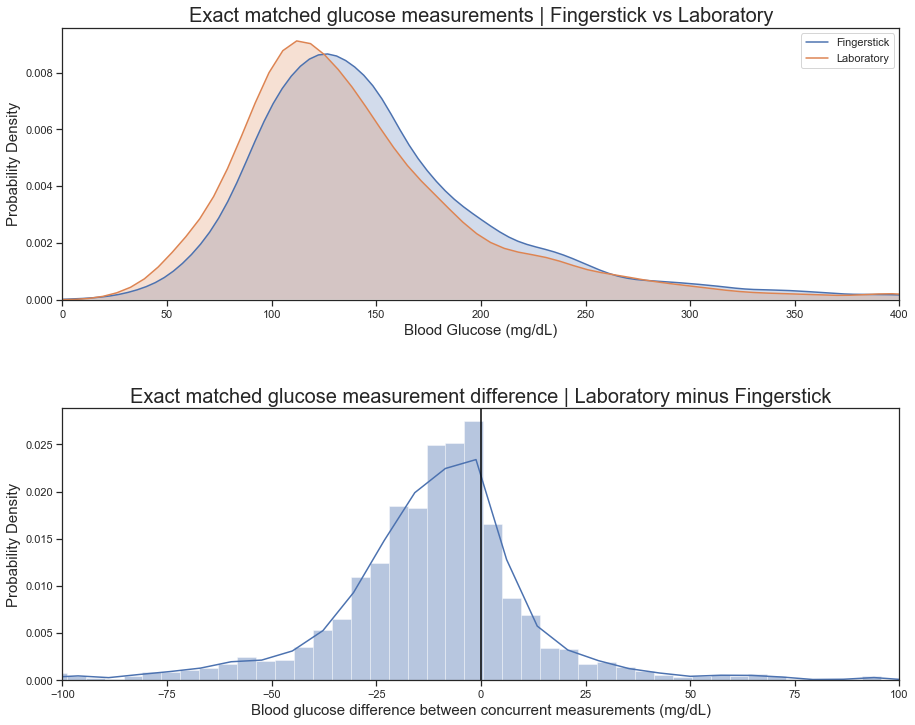

In [166]:
sns.set_style("ticks")
fig, axs = plt.subplots(2, 1, figsize = (15, 12))
gridspec.GridSpec(2,1)


#plot histogram
plt.subplot2grid((2,1), (0,0))
sns.kdeplot(glc_exact_pair["value_fs"], shade=True, label="Fingerstick")
sns.kdeplot(glc_exact_pair["value_serum"], shade=True, label="Laboratory")
plt.title("Exact matched glucose measurements | Fingerstick vs Laboratory", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
plt.xlim(0, 400)


plt.subplot2grid((2,1), (1,0))
sns.kdeplot(glc_exact_pair["delta"], shade=False, bw=4, label='')
sns.distplot(glc_exact_pair["delta"], kde=True, bins=200, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.axvline(x=0, label="Mean use", color="black")
plt.title("Exact matched glucose measurement difference | Laboratory minus Fingerstick", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood glucose difference between concurrent measurements (mg/dL)", fontsize=15)
plt.xlim(-100, 100)

#Add vertical space
fig.subplots_adjust(hspace=.4)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures\measure_exact_match_hist.png')

In [167]:
print("Fingerstick Mean", round(glc_exact_pair["value_fs"].mean(),2))
print("Fingerstick Median", round(glc_exact_pair["value_fs"].median(),2))
print("Fingerstick Standard Deviation", round(glc_exact_pair["value_fs"].std(),2))
print("Serum Mean", round(glc_exact_pair["value_serum"].mean(),2))
print("Serum Median", round(glc_exact_pair["value_serum"].median(),2))
print("Serum Standard Deviation", round(glc_exact_pair["value_serum"].std(),2))
print("Delta Mean", round(glc_exact_pair["delta"].mean(),2))
print("Delta Median", round(glc_exact_pair["delta"].median(),2))
print("Delta Standard Deviation", round(glc_exact_pair["delta"].std(),2))

print("r^2 value", round(r2_score(glc_exact_pair["value_serum"], glc_exact_pair["value_fs"]),2))

Fingerstick Mean 154.23
Fingerstick Median 139.0
Fingerstick Standard Deviation 68.82
Serum Mean 145.02
Serum Median 130.0
Serum Standard Deviation 70.91
Delta Mean -9.21
Delta Median -10.0
Delta Standard Deviation 41.23
r^2 value 0.64


In [168]:
glc_exact_pair["delta"].loc[glc_exact_pair['mean']<200].std()

22.585974479863616

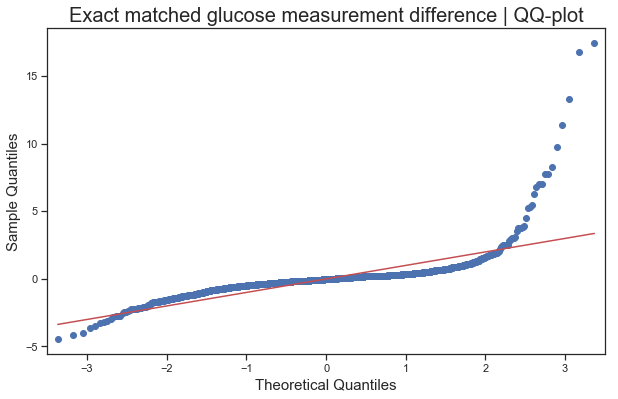

In [169]:
# QQ Plot
fig, ax = plt.subplots(1, 1, figsize = (10, 6))
qqplot(glc_exact_pair["delta"], line='s', fit=True, ax=ax)
plt.title("Exact matched glucose measurement difference | QQ-plot", fontsize=20)
plt.ylabel("Sample Quantiles", fontsize=15)
plt.xlabel("Theoretical Quantiles", fontsize=15)
plt.show()

In [170]:
len(glc_exact_pair.loc[glc_exact_pair['delta']>200])/len(glc_exact_pair)

0.0056925996204933585

In [430]:
def bland_altman_plot(mean,delta, title, xaxis_label="Average of matched measurements (mg/dL)", 
                      yaxis_label="Difference in matched measurements (mg/dL)", 
                      alpha=0.3, ymin=-200, ymax=200, xmin=np.nan, xmax=np.nan, stats=True):
    mean_val=delta.mean()
    std=delta.std()
    upper_lim=mean_val+1.96*std
    lower_lim=mean_val-1.96*std

    X=mean.values.reshape(-1, 1)
    X=sm.add_constant(X)
    y=delta.values
    #change to floats
    X=X.astype(dtype=np.float64)
    y=y.astype(dtype=np.float64)
    
    # robust regression line
    robust_regr=sm.RLM(y, X).fit()
    
    fig, ax = plt.subplots(1, 1, figsize = (15, 8))
    plt.scatter(mean, delta, marker='.',c=[sns.color_palette('deep')[0]], alpha=alpha, label='')
    ax.axhline(y=0, color="black", label='Zero line', linewidth=1)
    ax.axhline(y=mean_val, label="Mean difference", color="red", linewidth=1, linestyle='-')
    ax.axhline(y=upper_lim, label="95% confidence interval", color="red", linewidth=1, linestyle='--')
    ax.axhline(y=lower_lim, label='', color="red", linewidth=1, linestyle='--')
    plt.plot(mean.values.reshape(-1, 1), robust_regr.fittedvalues, color='darkorange', label='Robust Linear Model')
    plt.title("Bland-Altman |" + title, fontsize=20)
    plt.ylabel(yaxis_label, fontsize=15)
    plt.xlabel(xaxis_label, fontsize=15)
    
    if ((np.isnan(xmin)==False) & (np.isnan(xmax)==False)):
        plt.xlim(xmin, xmax)
    plt.legend()
    plt.ylim(ymin, ymax)
    plt.show()
    
    if stats==True:
        print('Coefficients: [intercept, gradient] =', robust_regr.params)
        print('Standard Errors: [intercept, gradient] =', robust_regr.bse)
        print('95% CI: [intercept, gradient] =', [(robust_regr.params[0]-1.96*robust_regr.bse[0],robust_regr.params[0]+1.96*robust_regr.bse[0]), (robust_regr.params[1]-1.96*robust_regr.bse[1],robust_regr.params[1]+1.96*robust_regr.bse[1])]) 
        print('T-test P-values: [intercept, gradient] =', robust_regr.pvalues)

    return fig, robust_regr



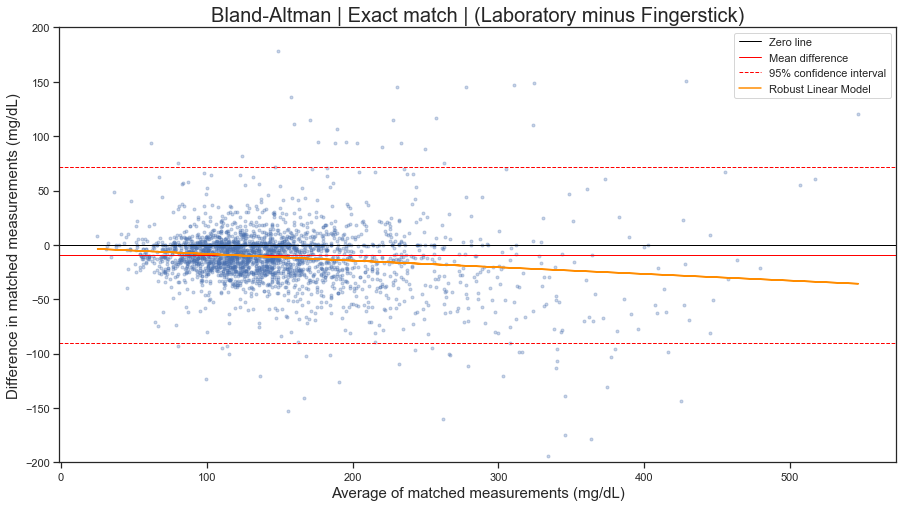

Coefficients: [intercept, gradient] = [-2.21025624 -0.06130488]
Standard Errors: [intercept, gradient] = [0.90776338 0.00554068]
95% CI: [intercept, gradient] = [(-3.989472461925385, -0.43104002494448035), (-0.07216461420438632, -0.05044514613244949)]
T-test P-values: [intercept, gradient] = [1.48984818e-02 1.86492808e-28]


In [431]:
fig, robust_regr=bland_altman_plot(glc_exact_pair["mean"], glc_exact_pair["delta"], ' Exact match | (Laboratory minus Fingerstick)')

fig.savefig('C:\Documents\Thesis\Figures\exact_bland.png')

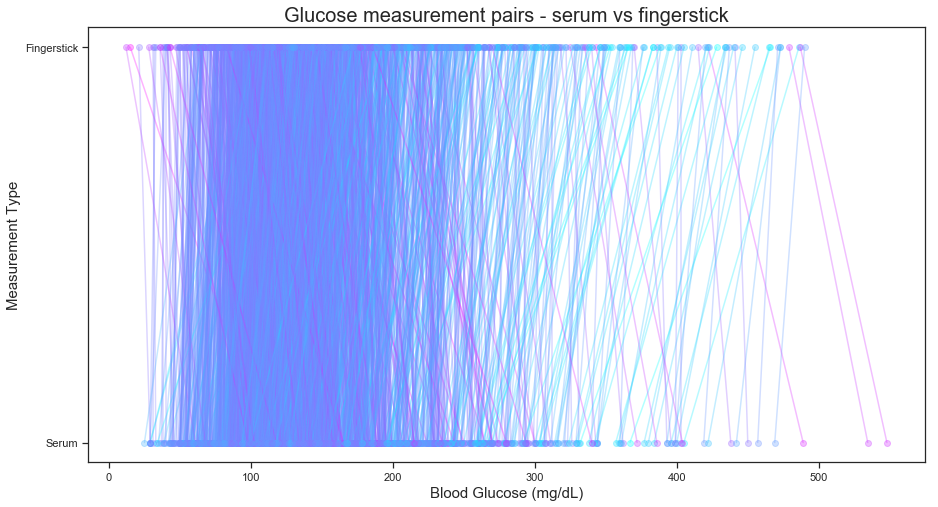

In [432]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))


max_delta=glc_exact_pair.loc[abs(glc_exact_pair['delta'])<100]['delta'].max()
for index, row in glc_exact_pair.loc[abs(glc_exact_pair['delta'])<100].iterrows():
    plt.plot([row["value_fs"], row["value_serum"]], [1,0], marker='o' , color=mpl.cm.cool((row["delta"]/max_delta/2)+0.5), alpha=0.3)

plt.yticks([0,1], labels=("Serum","Fingerstick"))
plt.title("Glucose measurement pairs - serum vs fingerstick", fontsize=20)
plt.ylabel("Measurement Type", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
#plt.xlim(50,250)
plt.show()

In [433]:
#Error grid analysis

#Function adapted from Trevor Tsue's

def clarke_error_grid(ref_values, pred_values, title_string):

    #Checking to see if the lengths of the reference and prediction arrays are the same
    assert (len(ref_values) == len(pred_values)), "Unequal number of values (reference : {}) (prediction : {}).".format(len(ref_values), len(pred_values))

    #Checks to see if the values are within the normal physiological range, otherwise it gives a warning
    if max(ref_values) > 400 or max(pred_values) > 400:
        print("Input Warning: the maximum reference value {} or the maximum prediction value {} exceeds the normal physiological range of glucose (<400 mg/dl).".format(max(ref_values), max(pred_values)))
    if min(ref_values) < 0 or min(pred_values) < 0:
        print("Input Warning: the minimum reference value {} or the minimum prediction value {} is less than 0 mg/dl.".format(min(ref_values),  min(pred_values)))
    
    #Find zone
    zone = [0]*5
    colorlist=[]
    for i in range(len(ref_values)):
        if (ref_values[i] <= 70 and pred_values[i] <= 70) or (pred_values[i] <= 1.2*ref_values[i] and pred_values[i] >= 0.8*ref_values[i]):
            zone[0] += 1   #Zone A
            colorlist.append('dodgerblue')

        elif (ref_values[i] >= 180 and pred_values[i] <= 70) or (ref_values[i] <= 70 and pred_values[i] >= 180):
            zone[4] += 1      #Zone E
            colorlist.append('darkred')

        elif ((ref_values[i] >= 70 and ref_values[i] <= 290) and pred_values[i] >= ref_values[i] + 110) or ((ref_values[i] >= 130 and ref_values[i] <= 180) and (pred_values[i] <= (7/5)*ref_values[i] - 182)):
            zone[2] += 1 #Zone C
            colorlist.append('darkorange')
            
        elif (ref_values[i] >= 240 and (pred_values[i] >= 70 and pred_values[i] <= 180)) or (ref_values[i] <= 175/3 and pred_values[i] <= 180 and pred_values[i] >= 70) or ((ref_values[i] >= 175/3 and ref_values[i] <= 70) and pred_values[i] >= (6/5)*ref_values[i]):
            zone[3] += 1 #Zone D
            colorlist.append('indianred')
            
        else:
            zone[1] += 1 #Zone B
            colorlist.append('forestgreen')

    #Set up plot
    plt.scatter(ref_values, pred_values, marker='o', color=colorlist, s=8)
    plt.title(title_string + " Clarke Error Grid", fontsize=20)
    plt.xlabel("Laboratory measurement (mg/dl)", fontsize=15)
    plt.ylabel("Fingerstick measurement (mg/dl)", fontsize=15)
    plt.xticks([0, 50, 100, 150, 200, 250, 300, 350, 400])
    plt.yticks([0, 50, 100, 150, 200, 250, 300, 350, 400])
    plt.gca().set_facecolor('white')

    #Set axes lengths
    plt.gca().set_xlim([0, 400])
    plt.gca().set_ylim([0, 400])
    plt.gca().set_aspect((400)/(400))

    #Plot zone lines
    plt.plot([0,400], [0,400], ':', c='black')                      #Theoretical 45 regression line
    plt.plot([0, 175/3], [70, 70], '-', c='black')
    #plt.plot([175/3, 320], [70, 400], '-', c='black')
    plt.plot([175/3, 400/1.2], [70, 400], '-', c='black')           #Replace 320 with 400/1.2 because 100*(400 - 400/1.2)/(400/1.2) =  20% error
    plt.plot([70, 70], [84, 400],'-', c='black')
    plt.plot([0, 70], [180, 180], '-', c='black')
    plt.plot([70, 290],[180, 400],'-', c='black')
    # plt.plot([70, 70], [0, 175/3], '-', c='black')
    plt.plot([70, 70], [0, 56], '-', c='black')                     #Replace 175.3 with 56 because 100*abs(56-70)/70) = 20% error
    # plt.plot([70, 400],[175/3, 320],'-', c='black')
    plt.plot([70, 400], [56, 320],'-', c='black')
    plt.plot([180, 180], [0, 70], '-', c='black')
    plt.plot([180, 400], [70, 70], '-', c='black')
    plt.plot([240, 240], [70, 180],'-', c='black')
    plt.plot([240, 400], [180, 180], '-', c='black')
    plt.plot([130, 180], [0, 70], '-', c='black')

    #Add zone titles
    plt.text(30, 15, "A", fontsize=15)
    plt.text(370, 260, "B", fontsize=15)
    plt.text(280, 370, "B", fontsize=15)
    plt.text(160, 370, "C", fontsize=15)
    plt.text(160, 15, "C", fontsize=15)
    plt.text(30, 140, "D", fontsize=15)
    plt.text(370, 120, "D", fontsize=15)
    plt.text(30, 370, "E", fontsize=15)
    plt.text(370, 15, "E", fontsize=15)



    return plt, zone

Input Warning: the maximum reference value 801.0 or the maximum prediction value 497.0 exceeds the normal physiological range of glucose (<400 mg/dl).


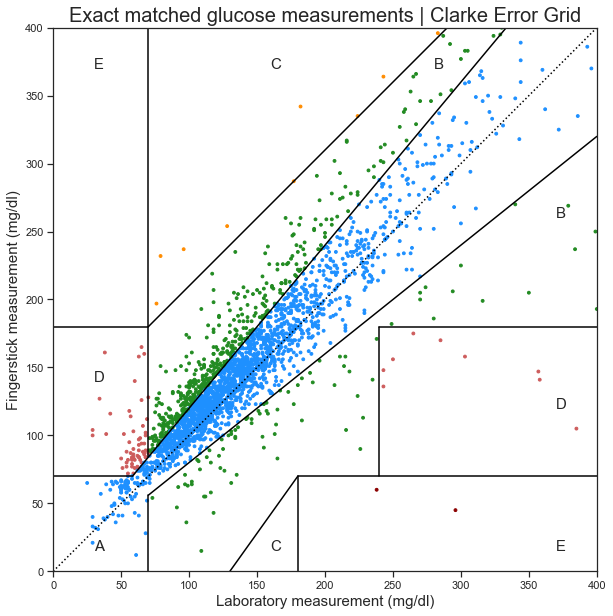

In [434]:
#Function is not well defined for values above 400, so drop these
ega_exact_pair=glc_exact_pair.loc[(glc_exact_pair['value_serum']<400) & (glc_exact_pair['value_fs']<400)]
fig, ax = plt.subplots(1, 1, figsize = (10, 10))
plt, zonelist= clarke_error_grid(glc_exact_pair['value_serum'], glc_exact_pair['value_fs'], "Exact matched glucose measurements |")
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\exact_ega.png')

In [435]:
zonelist

[1993, 548, 13, 77, 4]

In [436]:
(2036+566)/(2036+ 566+ 13+ 80+ 4)

0.9640607632456465

In [437]:
#set how far the two measurements can be apart
threshold=pd.Timedelta(seconds=900)
#create a separate df so we can mess with it
glc_all_measurements=glc_measurements.copy()
#drop those ids we are not sure about (it's a small number)
glc_all_measurements=glc_all_measurements.drop(glc_all_measurements.loc[(glc_all_measurements.item==811) | (glc_all_measurements.item==1529)].index)
#reset index, so that iloc and loc are the same
glc_all_measurements=glc_all_measurements.reset_index()
#set up our pair candidates based on the same starting (we drop from this later)
glc_pair_candidates=glc_all_measurements.copy()

#create columns for differences and flags
diff_length=4
diff_list=['diff'+str(i) for i in range(1,diff_length+1)]
flag_list=['flag'+str(i) for i in range(1,diff_length+1)]
#for each difference level create the difference and flag if the time is within the threshold
for stage in range(diff_length):
    glc_pair_candidates.loc[:, diff_list[stage]]=glc_pair_candidates['icu_time'].diff(stage+1)
    glc_pair_candidates.loc[(abs(glc_pair_candidates[diff_list[stage]])<=threshold) & (glc_pair_candidates[diff_list[stage]]>=pd.Timedelta(seconds=0)), flag_list[stage]]=1

#drop all rows that don't have a flag 1 (if it doesn't have a flag 1, it shouldn't have a flag 2, etc...)
glc_pair_candidates=glc_pair_candidates.drop(glc_pair_candidates.loc[glc_pair_candidates['flag1']!=1].index)

In [438]:
#given a location (which is of the second in the pair)
#find the second in the pair, then decrement by the offset to find the first in the pair
def get_measurement_pair(i, df, list1, list2, offset, cols): 
    second_glc=df.loc[i, cols]
    first_glc=df.loc[i-offset, cols]
    #only save these to a list if they are from the same ICU stay and one is fingerstick/serum
    if ((first_glc.icustay==second_glc.icustay) & (first_glc.type!=second_glc.type)):
        list1.append(first_glc)
        #changing the name is so that the indexes match for the join
        second_glc.name-=offset
        list2.append(second_glc)

In [439]:
#for each pair with a one flag, go one down and grab, then join those two together

#only include these columns (just for ease, so the df isn't huge)
included_cols=['icu_time', 'icustay', 'value', 'type', 'charttime']

#initialise lists
first_glc_list=[]
second_glc_list=[]
#for everyone one of our pairs see which flags it has and offset accoridingly
for i in glc_pair_candidates.index:
    if glc_pair_candidates.loc[i, 'flag1']==1:
        get_measurement_pair(i, glc_all_measurements, first_glc_list, second_glc_list, 1, included_cols)
    if glc_pair_candidates.loc[i, 'flag2']==1:
        get_measurement_pair(i, glc_all_measurements, first_glc_list, second_glc_list, 2, included_cols)
    if glc_pair_candidates.loc[i, 'flag3']==1:
        get_measurement_pair(i, glc_all_measurements, first_glc_list, second_glc_list, 3, included_cols)

    
first_glc_list=pd.concat(first_glc_list, axis=1).T
second_glc_list=pd.concat(second_glc_list, axis=1).T

glc_close_pair=first_glc_list.join(second_glc_list, on=None, lsuffix='_first', rsuffix='_second')

In [440]:
glc_close_pair=first_glc_list.join(second_glc_list, on=None, lsuffix='_first', rsuffix='_second')
#uneeded because icustays have been checked
glc_close_pair=glc_close_pair.drop(['icustay_second'], axis=1)
#create variables, in terms of serum - fingerstick (sometimes they are other way around)
glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_serum'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_first']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_serum'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_fs'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_fs'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_first']

glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'icu_time_serum'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'icu_time_first']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'icu_time_serum'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'icu_time_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'icu_time_fs'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'icu_time_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'icu_time_fs'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'icu_time_first']

glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'charttime_serum'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'charttime_first']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'charttime_serum'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'charttime_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'charttime_fs'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'charttime_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'charttime_fs'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'charttime_first']

glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_delta'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_first'] - glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'value_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_delta'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_second'] - glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'value_first']
glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'time_delta'] = glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'icu_time_first'] - glc_close_pair.loc[glc_close_pair['type_first']=='Serum', 'icu_time_second']
glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'time_delta'] = glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'icu_time_second'] - glc_close_pair.loc[glc_close_pair['type_first']=='Fingerstick', 'icu_time_first']
glc_close_pair['value_mean'] = (glc_close_pair['value_first']+glc_close_pair['value_second'])/2

glc_close_pair['time_delta_min']=glc_close_pair['time_delta'].dt.days*24*60+glc_close_pair['time_delta'].dt.seconds/60

#make the columns look nice
glc_close_pair=glc_close_pair[['icustay_first', 'icu_time_serum', 'icu_time_fs', 'charttime_serum', 'charttime_fs', 'time_delta', 'time_delta_min',
                 'value_serum', 'value_fs', 'value_delta', 'value_mean']]

glc_close_pair=glc_close_pair.rename({'icustay_first': 'icustay'}, axis='columns')

#Drop duplicates (which occur when there are multiple flags)
glc_close_pair=glc_close_pair.drop_duplicates()


In [441]:
glc_close_pair

,icustay,icu_time_serum,icu_time_fs,charttime_serum,charttime_fs,time_delta,time_delta_min,value_serum,value_fs,value_delta,value_mean
21,200028,0 days 00:49:10,0 days 01:03:10,2133-10-29 18:03:00,2133-10-29 18:17:00,-1 days +23:46:00,-14.0,171,198,-27,184.5
28,200028,1 days 12:46:10,1 days 12:46:10,2133-10-31 06:00:00,2133-10-31 06:00:00,00:00:00,0.0,260,288,-28,274
58,200033,3 days 16:03:43,3 days 16:03:43,2198-08-11 10:00:00,2198-08-11 10:00:00,00:00:00,0.0,229,192,37,210.5
136,200049,1 days 03:03:16,1 days 03:03:16,2118-08-29 12:00:00,2118-08-29 12:00:00,00:00:00,0.0,209,246,-37,227.5
157,200061,0 days 03:08:14,0 days 03:21:14,2134-01-23 19:47:00,2134-01-23 20:00:00,-1 days +23:47:00,-13.0,220,263,-43,241.5
210,200063,0 days 21:54:11,0 days 21:39:11,2141-03-10 21:15:00,2141-03-10 21:00:00,00:15:00,15.0,118,126,-8,122
363,200067,0 days 09:02:23,0 days 09:14:23,2126-06-30 03:48:00,2126-06-30 04:00:00,-1 days +23:48:00,-12.0,141,144,-3,142.5
474,200108,0 days 02:34:43,0 days 02:41:43,2110-12-10 03:53:00,2110-12-10 04:00:00,-1 days +23:53:00,-7.0,103,90,13,96.5
510,200131,4 days 13:45:42,4 days 13:54:42,2176-11-04 01:51:00,2176-11-04 02:00:00,-1 days +23:51:00,-9.0,143,164,-21,153.5
603,200143,7 days 06:04:11,7 days 06:14:11,2191-04-09 03:50:00,2191-04-09 04:00:00,-1 days +23:50:00,-10.0,139,171,-32,155


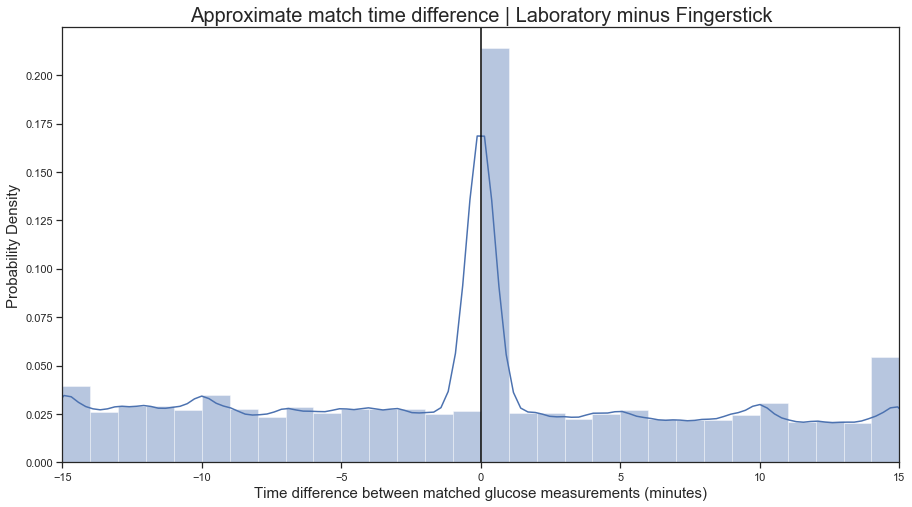

In [442]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot(glc_close_pair["time_delta_min"], shade=False, label="", bw=0.5)
sns.distplot(glc_close_pair["time_delta_min"].values.tolist(), kde=True, bins=30, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
ax.axvline(x=0, label="Mean use", color="black")
plt.title("Approximate match time difference | Laboratory minus Fingerstick", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time difference between matched glucose measurements (minutes)", fontsize=15)
plt.xlim(-15, 15)
plt.show()
fig.savefig('C:\Documents\Thesis\Figures/app_match_time_diff.png')

In [443]:
len(glc_close_pair.loc[glc_close_pair['time_delta_min']<0])/len(glc_close_pair.loc[glc_close_pair['time_delta_min']!=0])

0.5393107717705324

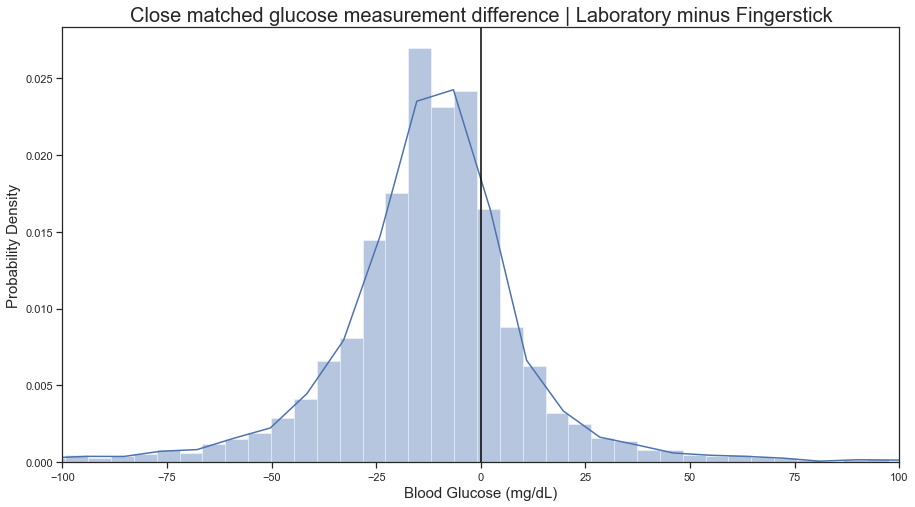

In [444]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot(glc_close_pair["value_delta"], shade=False, label="", bw=3)
sns.distplot(glc_close_pair["value_delta"].values.tolist(), kde=True, bins=200, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
ax.axvline(x=0, label="Mean use", color="black")
plt.title("Close matched glucose measurement difference | Laboratory minus Fingerstick", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
plt.xlim(-100, 100)
plt.show()

In [445]:
print("Fingerstick Mean", round(glc_close_pair["value_fs"].mean(),2))
print("Fingerstick Median", round(glc_close_pair["value_fs"].median(),2))
print("Fingerstick Standard Deviation", round(glc_close_pair["value_fs"].std(),2))
print("Serum Mean", round(glc_close_pair["value_serum"].mean(),2))
print("Serum Median", round(glc_close_pair["value_serum"].median(),2))
print("Serum Standard Deviation", round(glc_close_pair["value_serum"].std(),2))
print("Delta Mean", round(glc_close_pair["value_delta"].mean(),2))
print("Delta Median", round(glc_close_pair["value_delta"].median(),2))
print("Delta Standard Deviation", round(glc_close_pair["value_delta"].std(),2))

print("r^2 value", round(r2_score(glc_close_pair["value_serum"], glc_close_pair["value_fs"]),2))

Fingerstick Mean 155.11
Fingerstick Median 138.0
Fingerstick Standard Deviation 69.02
Serum Mean 144.95
Serum Median 129.0
Serum Standard Deviation 70.82
Delta Mean -10.15
Delta Median -11.0
Delta Standard Deviation 39.8
r^2 value 0.66


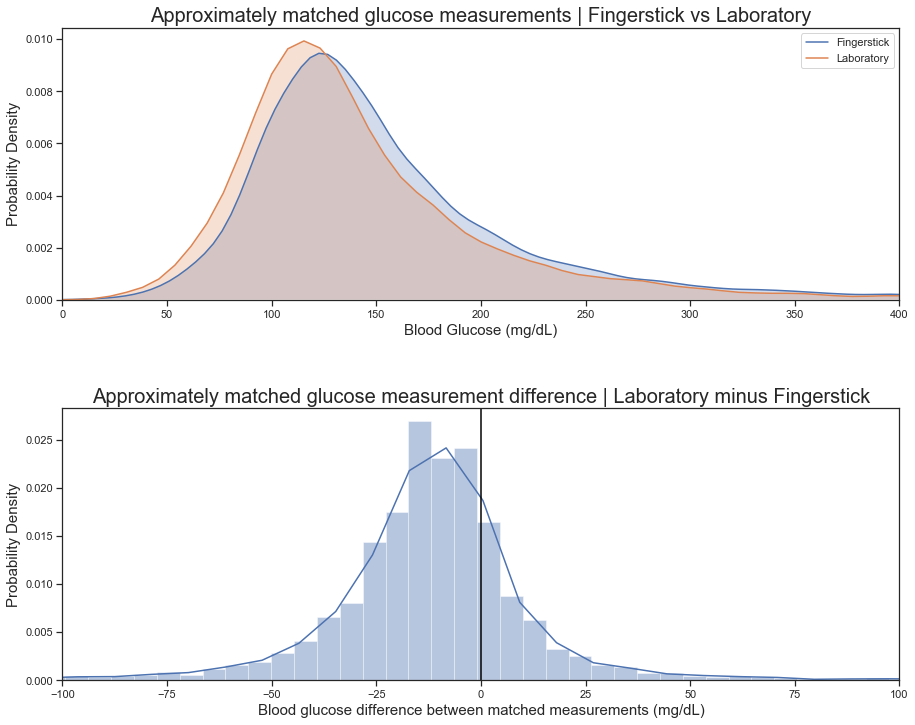

In [446]:
sns.set_style("ticks")
fig, axs = plt.subplots(2, 1, figsize = (15, 12))
gridspec.GridSpec(2,1)


#plot histogram
plt.subplot2grid((2,1), (0,0))
sns.kdeplot(glc_close_pair["value_fs"], shade=True, label="Fingerstick")
sns.kdeplot(glc_close_pair["value_serum"], shade=True, label="Laboratory")
plt.title("Approximately matched glucose measurements | Fingerstick vs Laboratory", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
plt.xlim(0, 400)


plt.subplot2grid((2,1), (1,0))
sns.kdeplot(glc_close_pair["value_delta"], shade=False, bw=4, label='')
sns.distplot(glc_close_pair["value_delta"].values.tolist(), kde=True, bins=200, color=sns.color_palette('deep')[0],kde_kws={"alpha": 0})
plt.axvline(x=0, label="Mean use", color="black")
plt.title("Approximately matched glucose measurement difference | Laboratory minus Fingerstick", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood glucose difference between matched measurements (mg/dL)", fontsize=15)
plt.xlim(-100, 100)

#Add vertical space
fig.subplots_adjust(hspace=.4)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures\measure_app_match_hist.png')

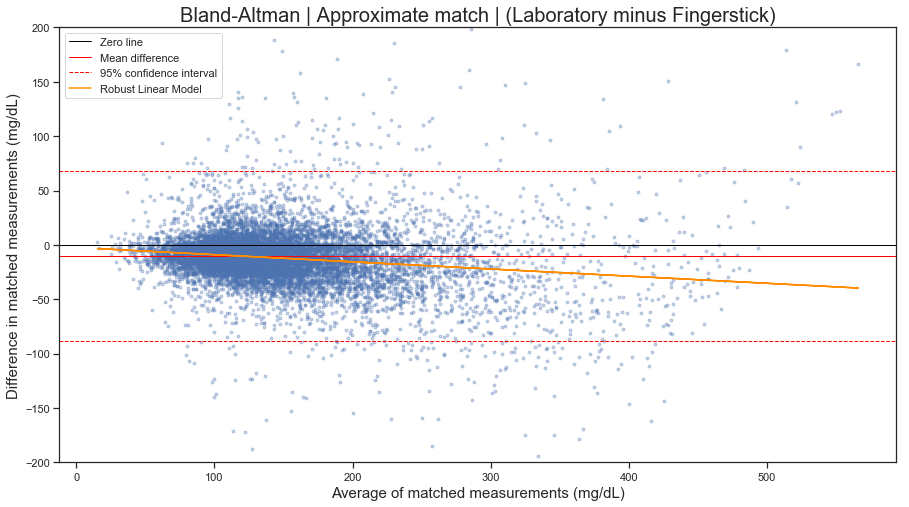

Coefficients: [intercept, gradient] = [-2.44279287 -0.06582516]
Standard Errors: [intercept, gradient] = [0.39457217 0.00240115]
95% CI: [intercept, gradient] = [(-3.2161543181709, -1.669431427348183), (-0.0705314246224659, -0.061118898367549905)]
T-test P-values: [intercept, gradient] = [5.97869849e-010 1.86960235e-165]


In [447]:
fig, robust_regr=bland_altman_plot(glc_close_pair["value_mean"], glc_close_pair["value_delta"], ' Approximate match | (Laboratory minus Fingerstick)')

fig.savefig('C:\Documents\Thesis\Figures\close_bland.png')

Input Warning: the maximum reference value 948.0 or the maximum prediction value 498.0 exceeds the normal physiological range of glucose (<400 mg/dl).


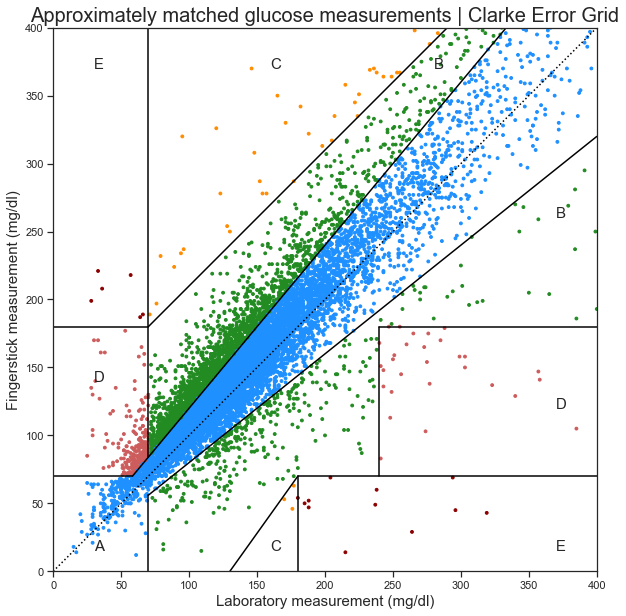

In [448]:
#Function is not well defined for values above 400, so drop these
fig, ax = plt.subplots(1, 1, figsize = (10, 10))
plt, zonelist= clarke_error_grid(glc_close_pair['value_serum'].values, glc_close_pair['value_fs'].values, "Approximately matched glucose measurements |")
plt.show()

fig.savefig('C:\Documents\Thesis\Figures\close_ega.png')

In [449]:
(9484+2576)/(9484+ 2576+ 50+ 317+ 21)

0.9688303341902313

In [450]:
zonelist

[9407, 2550, 49, 303, 21]

In [451]:
# aligned_df_list=[]
# for icustay in short_boluses.icustay.unique():
#     ins_df=short_boluses.loc[short_boluses.icustay ==icustay]
#     glc_df=glc_match.loc[glc_match.icustay ==icustay].drop("icustay", axis=1)
    
#     ins_df=ins_df.groupby(ins_df.index).agg(agg_dict)
    
#     glc_df=glc_df.reindex(ins_df.index, method="ffill")
#     aligned_stay=ins_df.join(glc_df, rsuffix="glc")
#     aligned_df_list.append(aligned_stay)
    
# aligned_df=pd.concat(aligned_df_list)

In [452]:
def align_labs (lab, threshold_mins, glc_df=glc_close_pair, labs_df=blood_labs):
    glc_lab_matched=glc_df.copy().set_index('charttime_serum', drop=False)
    #get list of who has hematocrit measurements
    lab_measurements=labs_df.dropna(subset=[lab])[['icustay', lab]]
    lab_list=lab_measurements.icustay.unique()
    #get rid of duplicate indexes (average measurements at the same time)
    lab_measurements=lab_measurements.groupby([lab_measurements.index, 'icustay']).mean()
    lab_measurements=lab_measurements.reset_index().set_index('charttime', drop=False)

    glc_lab_matched=glc_lab_matched.loc[glc_lab_matched['icustay'].isin(lab_list)]

    aligned_df_list=[]

    #match to nearest (using reindex)
    for icustay in lab_list:
        lab_df=lab_measurements.loc[lab_measurements['icustay']==icustay].drop(['icustay'], axis=1)
        glc_df=glc_lab_matched.loc[glc_lab_matched['icustay']==icustay]
        lab_df=lab_df.reindex(glc_df.index, method="nearest")
        aligned_stay=lab_df.join(glc_df, how='right', rsuffix="glc")
        aligned_df_list.append(aligned_stay)

    aligned_df=pd.concat(aligned_df_list)
    aligned_df=aligned_df.drop(['charttime_serum'], axis='columns')
    aligned_df=aligned_df.reset_index()
    aligned_df['lab_time_min']=aligned_df['charttime']-aligned_df['charttime_serum']
    aligned_df['lab_time_min']=aligned_df['lab_time_min'].dt.days*24*60+aligned_df['lab_time_min'].dt.seconds/60

    #filter down to the last 12 hours
    aligned_df=aligned_df.loc[abs(aligned_df['lab_time_min'])<=threshold_mins]
    
    return aligned_df

In [453]:
aligned_hemato_df=align_labs('hematocrit', 2*60, glc_df=glc_close_pair, labs_df=blood_labs)

In [454]:
aligned_ph_df=align_labs('ph', 2*60, glc_df=glc_close_pair, labs_df=blood_labs)

In [455]:
aligned_so2_df=align_labs('so2', 2*60, glc_df=glc_close_pair, labs_df=blood_labs)

In [456]:
aligned_sofa_df=align_labs('sofa_24hours', 2*60, glc_df=glc_close_pair, labs_df=sofa)

In [457]:
len(glc_close_pair)

12330

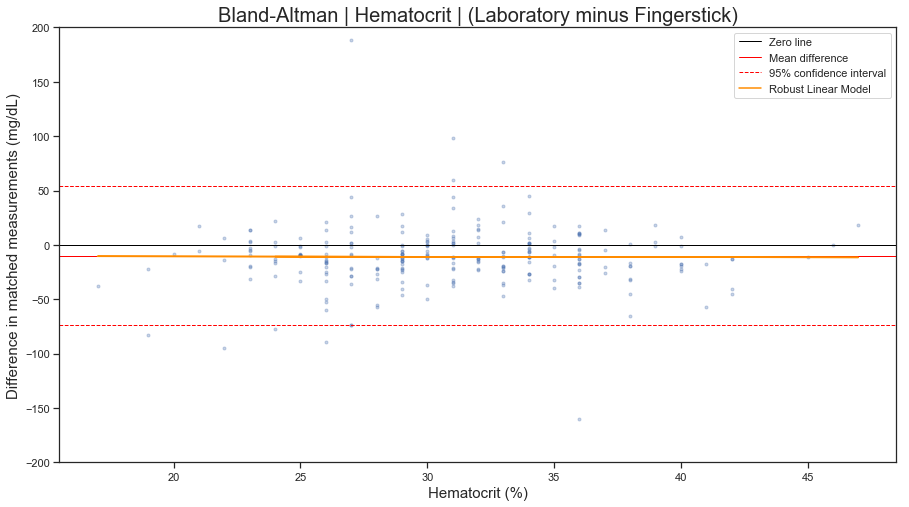

Coefficients: [intercept, gradient] = [-9.92102795 -0.03451008]
Standard Errors: [intercept, gradient] = [7.49297686 0.23993453]
95% CI: [intercept, gradient] = [(-24.607262602253034, 4.76520670316847), (-0.5047817663272359, 0.4357616018005117)]
T-test P-values: [intercept, gradient] = [0.18548857 0.88563373]


In [458]:
fig, robust_regr=bland_altman_plot(aligned_hemato_df["hematocrit"], aligned_hemato_df["value_delta"], title=' Hematocrit | (Laboratory minus Fingerstick)', xaxis_label="Hematocrit (%)" )

fig.savefig('C:\Documents\Thesis\Figures\hematocrit_bland.png')

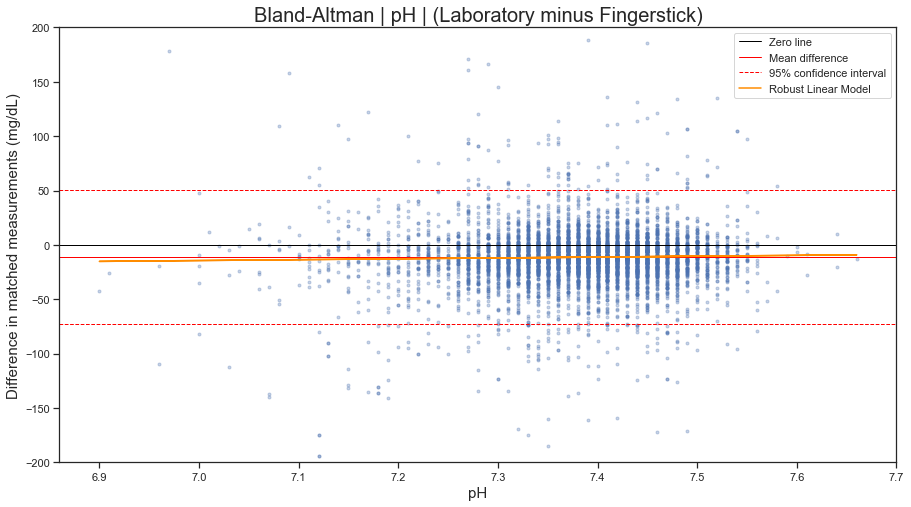

Coefficients: [intercept, gradient] = [-70.04275324   7.94627178]
Standard Errors: [intercept, gradient] = [19.6609527   2.66333501]
95% CI: [intercept, gradient] = [(-108.57822052407941, -31.507285951568193), (2.7261351562476834, 13.166408403364244)]
T-test P-values: [intercept, gradient] = [0.0003673  0.00284898]


In [459]:
fig, robust_regr=bland_altman_plot(aligned_ph_df["ph"], aligned_ph_df["value_delta"], title=' pH | (Laboratory minus Fingerstick)', xaxis_label="pH" )

fig.savefig('C:\Documents\Thesis\Figures\pH_bland.png')

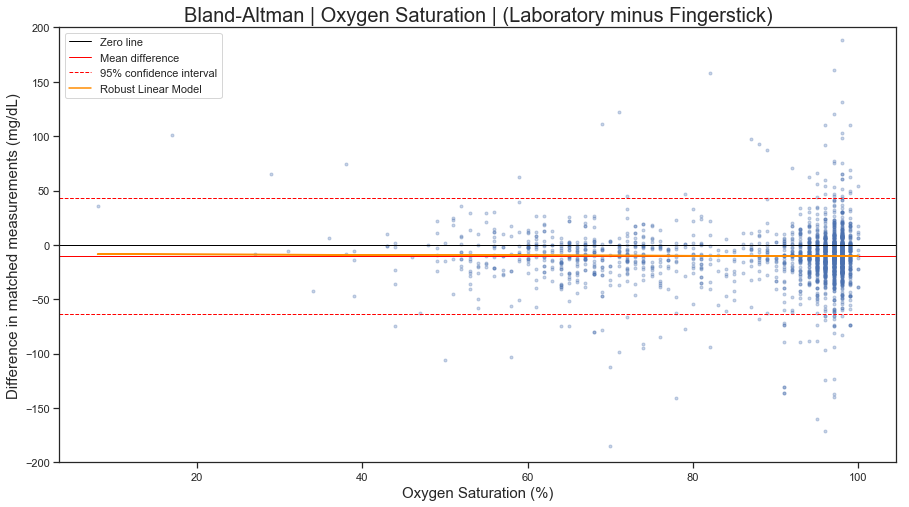

Coefficients: [intercept, gradient] = [-8.37356991 -0.02008487]
Standard Errors: [intercept, gradient] = [2.34422405 0.02603064]
95% CI: [intercept, gradient] = [(-12.968249038000895, -3.7788907753187253), (-0.07110491821400261, 0.030935185771133467)]
T-test P-values: [intercept, gradient] = [3.54264481e-04 4.40359901e-01]


In [460]:
fig, robust_regr=bland_altman_plot(aligned_so2_df["so2"], aligned_so2_df["value_delta"], title=' Oxygen Saturation | (Laboratory minus Fingerstick)', xaxis_label="Oxygen Saturation (%)" )

fig.savefig('C:\Documents\Thesis\Figures\so2_bland.png')

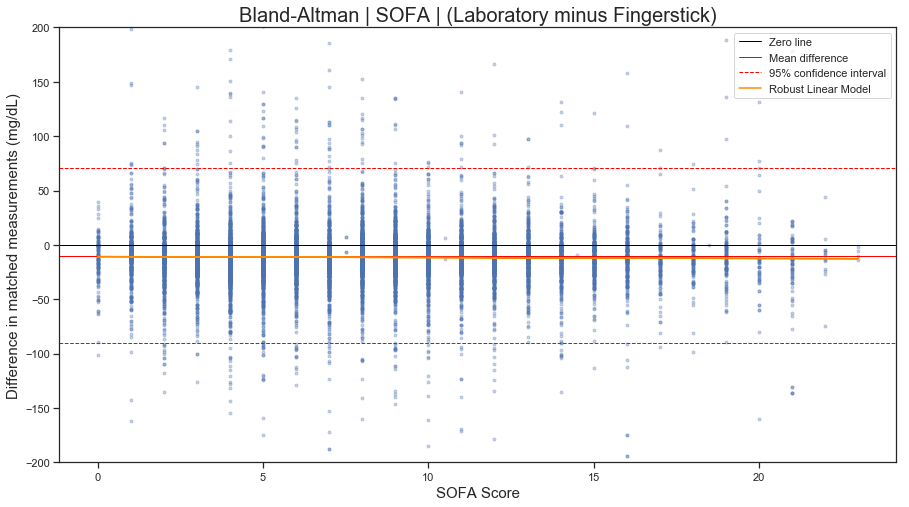

Coefficients: [intercept, gradient] = [-10.8190059   -0.08378066]
Standard Errors: [intercept, gradient] = [0.33136891 0.03617792]
95% CI: [intercept, gradient] = [(-11.468488958843821, -10.169522849451852), (-0.15468937859412496, -0.012871936961668537)]
T-test P-values: [intercept, gradient] = [8.16384569e-234 2.05694427e-002]


In [461]:
fig, robust_regr=bland_altman_plot(aligned_sofa_df["sofa_24hours"], aligned_sofa_df["value_delta"], title=' SOFA | (Laboratory minus Fingerstick)', xaxis_label="SOFA Score" )

fig.savefig('C:\Documents\Thesis\Figures\sofa_bland.png')

## Does being on a pump improve control

In [462]:
#What would be the ideal comparison?

#Idea: do propensity score matching for being given an insulin pump and then see if this changes control, average glucose, hypos and mortality

#What is the best comparison? 
#X hours before starting on an infusion and X hours after starting on an infusion? mean max min
#exclude infusions that don't last for at least X hours

In [463]:
#First find start and end dates for the longest pump period for each person (could try to do multiple periods)

inf_df=insulin_infusion.loc[insulin_infusion.icustay==200636]
inf_df['infusion_length']=0

start_iloc = inf_df.columns.get_loc('input_start')
end_iloc = inf_df.columns.get_loc('input_end')
icustay_iloc = inf_df.columns.get_loc('icustay')
inf_len_iloc = inf_df.columns.get_loc('infusion_length')
threshold=pd.Timedelta(seconds=600)

# curr_length=pd.Timedelta(seconds=0)
# for i in range (1, len(inf_df)):
#             curr_input_start=inf_df.iat[i-1, start_iloc]
#             curr_input_end= inf_df.iat[i-1, end_iloc]
#             next_input_start= inf_df.iat[i, start_iloc]
#             curr_length+=curr_input_end-curr_input_start
#             inf_df.iat[i-1, inf_len_iloc]=curr_length
#             if (next_input_start-curr_input_end) > threshold:
#                 curr_length=pd.Timedelta(seconds=0)

                

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [464]:
#find the length of the first insulin infusion for each person.

#somewhere to store and check the results
first_insulin_infusion=insulin_infusion.copy()

#set up the indexes
i_stay=0
i_start=1
i_end=2
i_length=3
i_admit=4

#
gap_threshold = pd.Timedelta(seconds=60*60)

#first for loop gets the dataframe of just the person
for icustay in first_insulin_infusion['icustay'].unique():
    inf_df=first_insulin_infusion.loc[first_insulin_infusion['icustay']==icustay]
    inf_length=0
    pr=[0]*5
    end_inf_flag=0
    
    #second loop looks through that dataframe (I realise now I could do this in one loop, but it still runs fast)
    for r in zip(inf_df['icustay'], inf_df['input_start'], inf_df['input_end'], inf_df['length_hr'], inf_df['icu_admit']):
        #if we are on the first entry then carry on
        if r[i_stay]!= pr[i_stay]:
            inf_length+= r[i_length]
            #set the time elapsed since admission for all rows
            since_admit=r[i_start]-r[i_admit]
            since_admit=since_admit.total_seconds()/3600
            first_insulin_infusion.loc[first_insulin_infusion['icustay']==icustay, 'first_infusion_hr_since_admit']=since_admit
        #if the infusion stops (for more than the gap threshold) then write now and raise a flag to stop writing later
        elif r[i_start] > (pr[i_end] + gap_threshold):
            first_insulin_infusion.loc[first_insulin_infusion['icustay']==icustay, 'first_infusion_length_hr']=inf_length
            end_inf_flag=1
            
        #if the infusion hasn't stopped then carry on and add the length
        elif r[i_start] <= (pr[i_end] + gap_threshold):
            inf_length+= r[i_length]
        
        #update the previous row to the row
        pr=r
    
    #only write the length if the flag isn't up for an early end
    if end_inf_flag==0:
        first_insulin_infusion.loc[first_insulin_infusion['icustay']==icustay, 'first_infusion_length_hr']=inf_length
        


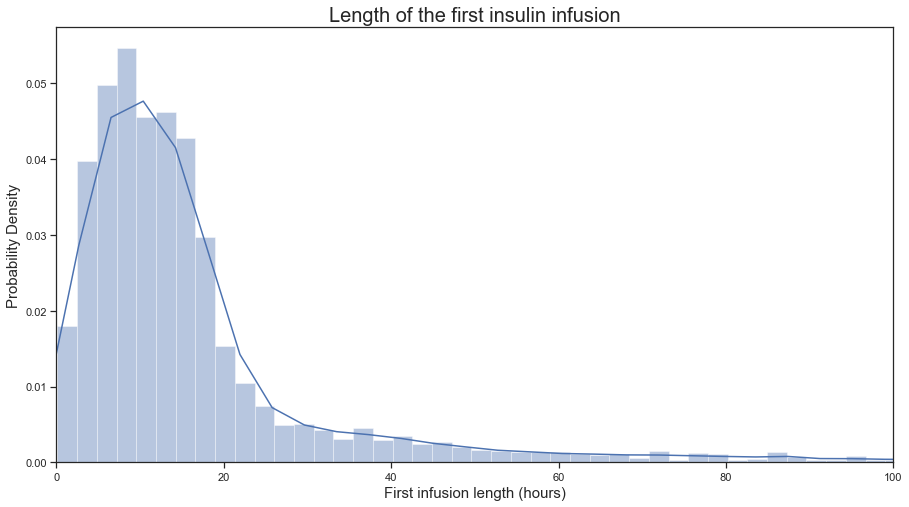

In [465]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_length_hr"], shade=False, label="", bw=3)
sns.distplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_length_hr"].values.tolist(), kde=True, bins=200, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
plt.title("Length of the first insulin infusion", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("First infusion length (hours)", fontsize=15)
plt.xlim(0, 100)
plt.show()

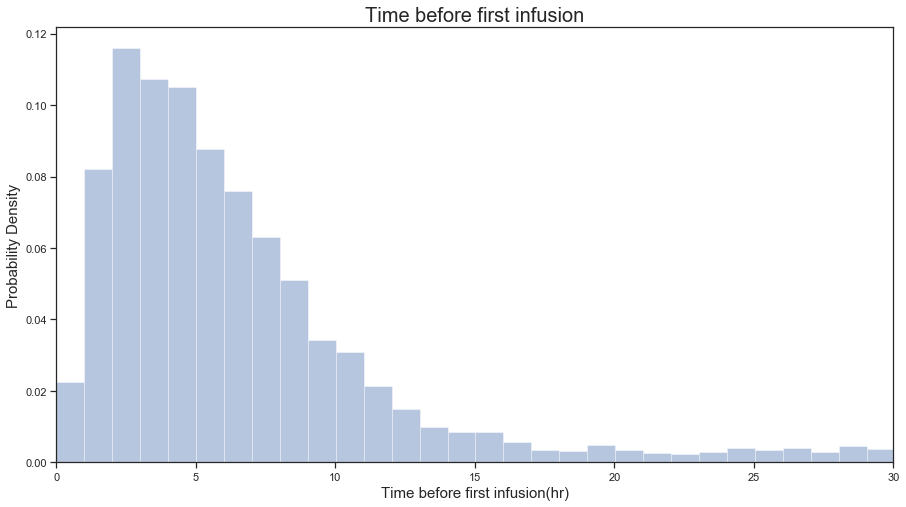

In [466]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
#sns.kdeplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_hr_since_admit"], shade=False, label="", bw=1)
sns.distplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_hr_since_admit"].values.tolist(), kde=True, bins=786, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
plt.title("Time before first infusion", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time before first infusion(hr)", fontsize=15)
plt.xlim(0, 30)
plt.show()

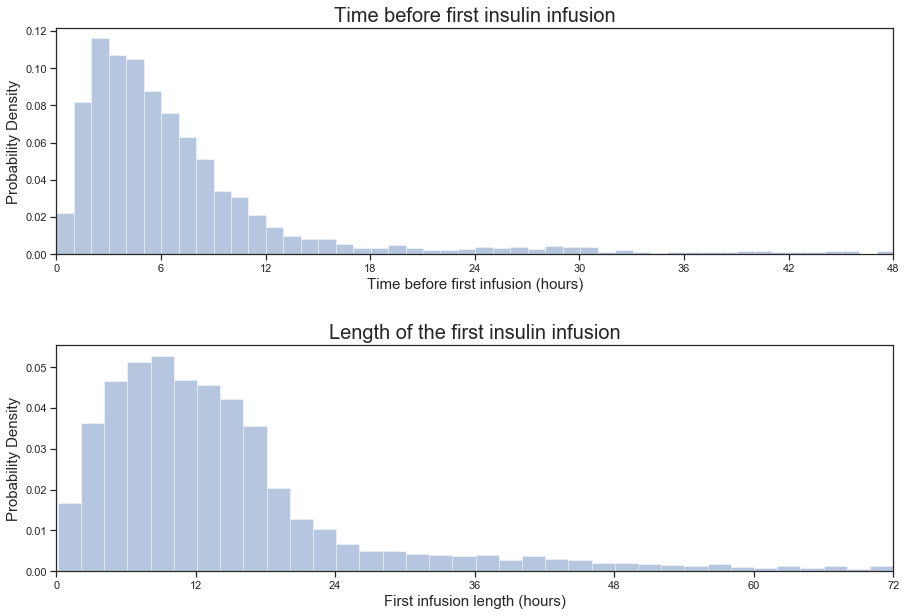

Median time to first infusion 5.76 hours
Median length of first infusion 12.12 hours


In [467]:
sns.set_style("ticks")
fig, axs = plt.subplots(2, 1, figsize = (15, 10))
gridspec.GridSpec(2,1)


#plot histogram
plt.subplot2grid((2,1), (0,0))
#sns.kdeplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_hr_since_admit"], shade=False, label="", bw=1)
sns.distplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_hr_since_admit"].values.tolist(), kde=True, bins=786, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
plt.title("Time before first insulin infusion", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Time before first infusion (hours)", fontsize=15)
plt.xlim(0, 48)
plt.xticks(np.arange(0, 54, 6))

plt.subplot2grid((2,1), (1,0))
#sns.kdeplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_length_hr"], shade=False, label="", bw=3)
sns.distplot(first_insulin_infusion.groupby('icustay').first()["first_infusion_length_hr"].values.tolist(), kde=True, bins=236, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
plt.title("Length of the first insulin infusion", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("First infusion length (hours)", fontsize=15)
plt.xlim(0, 72)
plt.xticks(np.arange(0,78,12))

#Add vertical space
fig.subplots_adjust(hspace=.4)

plt.show()

fig.savefig('C:\Documents\Thesis\Figures/first_infusion_stats.png')

print("Median time to first infusion", round(first_insulin_infusion.groupby('icustay').first()["first_infusion_hr_since_admit"].median(),2), "hours")
print("Median length of first infusion", round(first_insulin_infusion.groupby('icustay').first()["first_infusion_length_hr"].median(),2), "hours")

before: 209.5401699601756
after: 134.26826906743656
delta: 75.27190089273904
length: 841


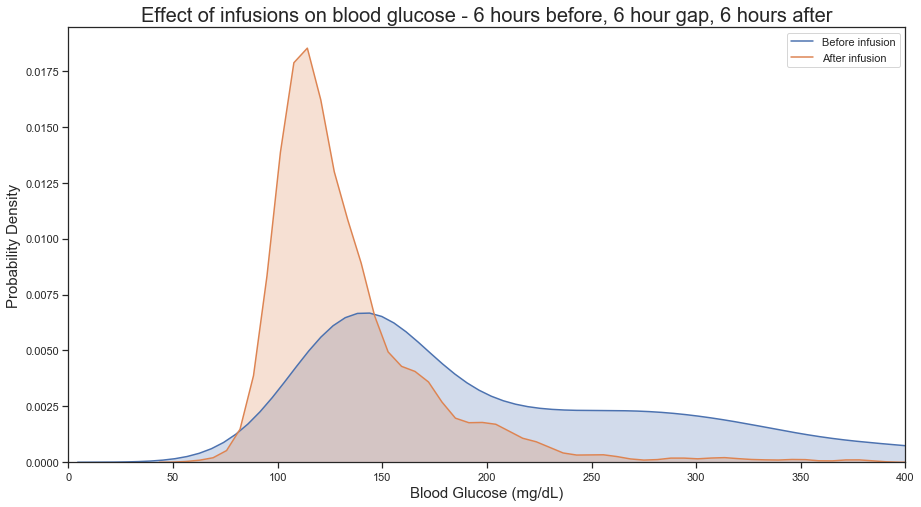

In [468]:
#Find the time of the first infusion for each person. Get all glucose measurements 12 hr before and 12 hr after, average. Plot on histograms
start_iloc = inf_df.columns.get_loc('input_start')
threshold_hours=6
before_hours=6
gap_hours=6
threshold=pd.Timedelta(seconds=threshold_hours*60*60)
gap=pd.Timedelta(seconds=gap_hours*60*60)
av_glc_before=[]
av_glc_after=[]
all_glc_before=[]
all_glc_after=[]

#only include stays that have a long enough infusion
included_stays=first_insulin_infusion.loc[first_insulin_infusion['first_infusion_length_hr']>(threshold_hours+gap_hours)].icustay.unique()
#only include stays that have a long enough peroid before the infusion
included_stays=np.intersect1d(included_stays, first_insulin_infusion.loc[first_insulin_infusion['first_infusion_hr_since_admit']>before_hours].icustay.unique())


for icustay in included_stays:
    inf_df=insulin_infusion.loc[insulin_infusion.icustay==icustay]
    first_infusion = inf_df.iat[0, start_iloc]
    glc_df=glc_measurements.loc[glc_measurements.icustay==icustay]
    glc_before= glc_df.loc[(glc_df['charttime'] < first_infusion) & (glc_df['charttime'] > first_infusion-threshold)]
    glc_after= glc_df.loc[(glc_df['charttime'] > first_infusion+gap) & (glc_df['charttime'] < first_infusion+threshold+gap)]
    
    
    if (len(glc_before)>0 and len(glc_after)>0):
        av_glc_before.append(glc_before.value.mean())
        av_glc_after.append(glc_after.value.mean())
        all_glc_before.append(glc_before.value.values.tolist())
        all_glc_after.append(glc_after.value.values.tolist())
        
        
all_glc_before = [item for sublist in all_glc_before for item in sublist]
all_glc_after = [item for sublist in all_glc_after for item in sublist]
    
print("before:", sum(av_glc_before)/len(av_glc_before))
print("after:", sum(av_glc_after)/len(av_glc_after))
print("delta:", (sum(av_glc_before)/len(av_glc_before))-(sum(av_glc_after)/len(av_glc_after)))

print("length:", len(av_glc_before))

#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
ax=sns.kdeplot(av_glc_before, shade=True, label="Before infusion")
ax=sns.kdeplot(av_glc_after, shade=True, label="After infusion")
# sns.distplot(av_glc_before, kde=True, bins=60, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
# sns.distplot(av_glc_after, kde=True, bins=60, color=sns.color_palette('deep')[1], kde_kws={"alpha": 0})

plt.title("Effect of infusions on blood glucose - 6 hours before, 6 hour gap, 6 hours after", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
plt.xlim(0, 400)

plt.show()

before: 193.42064448696135
after: 128.82168300779892
delta: 64.59896147916243
length: 3360


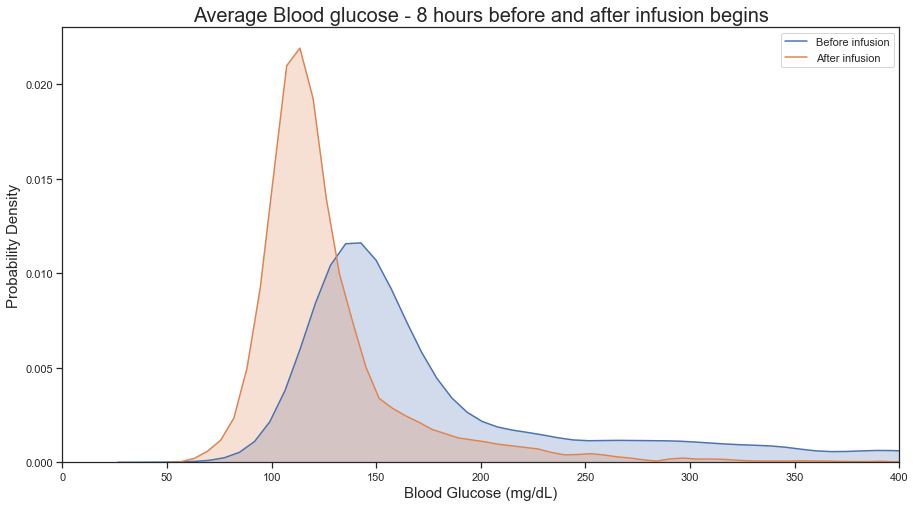

In [469]:
#Find the time of the first infusion for each person. Get all glucose measurements 12 hr before and 12 hr after, average. Plot on histograms
start_iloc = inf_df.columns.get_loc('input_start')
threshold_hours=6
before_hours=6
gap_hours=6
threshold=pd.Timedelta(seconds=threshold_hours*60*60)
gap=pd.Timedelta(seconds=gap_hours*60*60)
av_glc_before=[]
av_glc_after=[]
all_glc_before=[]
all_glc_after=[]

#only include stays that have a long enough infusion
included_stays=first_insulin_infusion.loc[first_insulin_infusion['first_infusion_length_hr']>(threshold_hours+gap_hours)].icustay.unique()
#only include stays that have a long enough peroid before the infusion
included_stays=np.intersect1d(included_stays, first_insulin_infusion.loc[first_insulin_infusion['first_infusion_hr_since_admit']>before_hours].icustay.unique())


for icustay in first_insulin_infusion.icustay.unique():
    inf_df=insulin_infusion.loc[insulin_infusion.icustay==icustay]
    first_infusion = inf_df.iat[0, start_iloc]
    glc_df=glc_measurements.loc[glc_measurements.icustay==icustay]
    glc_before= glc_df.loc[(glc_df['charttime'] < first_infusion) & (glc_df['charttime'] > first_infusion-threshold)]
    glc_after= glc_df.loc[(glc_df['charttime'] > first_infusion+gap) & (glc_df['charttime'] < first_infusion+threshold+gap)]
    
    
    if (len(glc_before)>0 and len(glc_after)>0):
        av_glc_before.append(glc_before.value.mean())
        av_glc_after.append(glc_after.value.mean())
        all_glc_before.append(glc_before.value.values.tolist())
        all_glc_after.append(glc_after.value.values.tolist())
        
        
all_glc_before = [item for sublist in all_glc_before for item in sublist]
all_glc_after = [item for sublist in all_glc_after for item in sublist]
    
print("before:", sum(av_glc_before)/len(av_glc_before))
print("after:", sum(av_glc_after)/len(av_glc_after))
print("delta:", (sum(av_glc_before)/len(av_glc_before))-(sum(av_glc_after)/len(av_glc_after)))

print("length:", len(av_glc_before))

#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
ax=sns.kdeplot(av_glc_before, shade=True, label="Before infusion")
ax=sns.kdeplot(av_glc_after, shade=True, label="After infusion")
plt.title("Average Blood glucose - 8 hours before and after infusion begins", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
plt.xlim(0, 400)

plt.show()

In [620]:
#Find the time of the first infusion for each person. Get all glucose measurements 12 hr before and 12 hr after, average. Plot on histograms
start_iloc = inf_df.columns.get_loc('input_start')
step_hours=2
gap=pd.Timedelta(seconds=gap_hours*60*60)
av_glc_before=[]
av_glc_after=[]
all_glc_before=[]
all_glc_after=[]
time_step=pd.Timedelta(seconds=step_hours*60*60)
n_step=6

included_stays=first_insulin_infusion.loc[first_insulin_infusion['first_infusion_length_hr']>(n_step*step_hours)].icustay.unique()
included_stays=np.intersect1d(included_stays, first_insulin_infusion.loc[first_insulin_infusion['first_infusion_hr_since_admit']>n_step*step_hours].icustay.unique())

i=0

glc_infusion_dict={}
#going to create a dictionary, with an interger key and containing a list [icustay, mean_glc, hour]
for icustay in included_stays:
    inf_df=insulin_infusion.loc[insulin_infusion.icustay==icustay]
    first_infusion = inf_df.iat[0, start_iloc]
    bolus_df=insulin_bolus.loc[insulin_bolus.icustay==icustay]
    glc_df=glc_measurements.loc[glc_measurements.icustay==icustay]
    d50_df=dextrose_bolus.loc[(dextrose_bolus['concentration']==0.5) & (dextrose_bolus.icustay==icustay)]
    
    for step in range(-n_step, n_step):
        hour=step*step_hours
        hour_glc=glc_df.loc[(glc_df['charttime'] > (first_infusion + (time_step*step))) & (glc_df['charttime'] < first_infusion + (time_step*(step+1)))]
        hour_bolus=bolus_df.loc[(bolus_df['input_start'] > (first_infusion + (time_step*step))) & (bolus_df['input_start'] < first_infusion + (time_step*(step+1)))]
        hour_inf=inf_df.loc[(inf_df['input_start'] > (first_infusion + (time_step*step))) & (inf_df['input_start'] < first_infusion + (time_step*(step+1)))]
        hour_d50=d50_df.loc[(d50_df['input_start'] > (first_infusion + (time_step*step))) & (d50_df['input_start'] < first_infusion + (time_step*(step+1)))]

        mean_glc=hour_glc.value.values.mean()
        try:
            min_glc=hour_glc.value.values.min()
        except(ValueError):
            min_glc=np.nan
        count_glc=len(hour_glc)
        count_bolus=len(hour_bolus)
        count_inf=len(hour_inf)
        count_d50=len(hour_d50)
        inf_ins=hour_inf.amount.sum()
        bolus_ins=hour_bolus.amount.sum()
        total_ins=inf_ins+bolus_ins
        
        glc_infusion_dict[i]=[icustay, mean_glc, min_glc, count_glc, count_bolus, count_inf, count_d50, total_ins, hour]
        
        i+=1
        
hour_infusion=pd.DataFrame.from_dict(glc_infusion_dict, orient='index', columns=['icustay', 'mean_glc', 'min_glc', 'count_glc', 'count_bolus', 'count_inf', 'count_d50', 'total_ins', 'hour'])

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning:

Mean of empty slice.

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning:

invalid value encountered in double_scalars



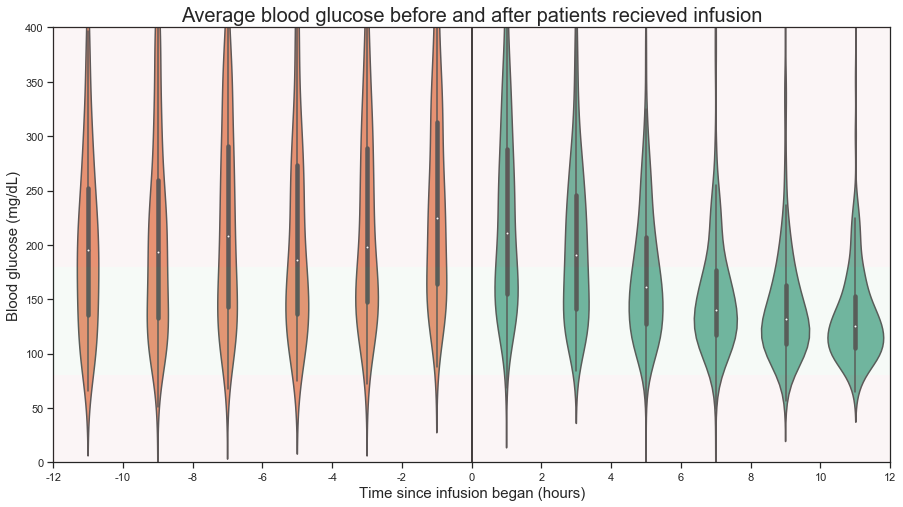

In [472]:
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
palette=[sns.color_palette("Set2")[1]]*n_step+[sns.color_palette("Set2")[0]]*n_step
ax=sns.violinplot(x=hour_infusion["hour"], y=hour_infusion["mean_glc"], palette=palette)
add_glucose_guidlines()
ax.axvline(x=n_step-0.5, label="Zero line", color="black")
plt.ylim(0, 400)
plt.xlabel('Time since infusion began (hours)', fontsize=15)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.title("Average blood glucose before and after patients recieved infusion", fontsize=20)
plt.xticks(np.arange(-0.5, 12.5), np.arange(-n_step*step_hours, (n_step+1)*step_hours, step_hours))
plt.show()
fig.savefig('C:\Documents\Thesis\Figures/ins_infusion_hr.png')


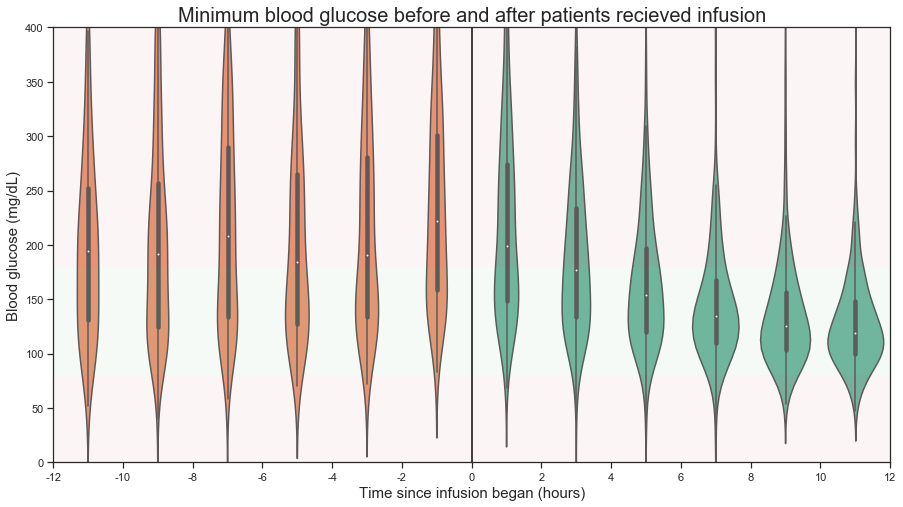

In [473]:
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
palette=[sns.color_palette("Set2")[1]]*n_step+[sns.color_palette("Set2")[0]]*n_step
ax=sns.violinplot(x=hour_infusion["hour"], y=hour_infusion["min_glc"], palette=palette)
add_glucose_guidlines()
ax.axvline(x=n_step-0.5, label="Zero line", color="black")
plt.ylim(0, 400)
plt.xlabel('Time since infusion began (hours)', fontsize=15)
plt.ylabel("Blood glucose (mg/dL)", fontsize=15)
plt.title("Minimum blood glucose before and after patients recieved infusion", fontsize=20)
plt.xticks(np.arange(-0.5, 12.5), np.arange(-n_step*step_hours, (n_step+1)*step_hours, step_hours))
plt.show()
fig.savefig('C:\Documents\Thesis\Figures/ins_infusion_min_hr.png')


In [631]:
#total insulin used before and after

total_ins_before=hour_infusion.loc[(hour_infusion['hour']<0)].total_ins.sum()
total_ins_after=hour_infusion.loc[(hour_infusion['hour']>=0)].total_ins.sum()
print("Insulin used in before period:", round(total_ins_before), "units")
print("Insulin used in after period:", round(total_ins_after), "units")
print("Ratio:", round(total_ins_after/total_ins_before,3))

Insulin used in before period: 4603.0 units
Insulin used in after period: 27773.0 units
Ratio: 6.033


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning:

invalid value encountered in greater

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:448: RuntimeWarning:

invalid value encountered in less



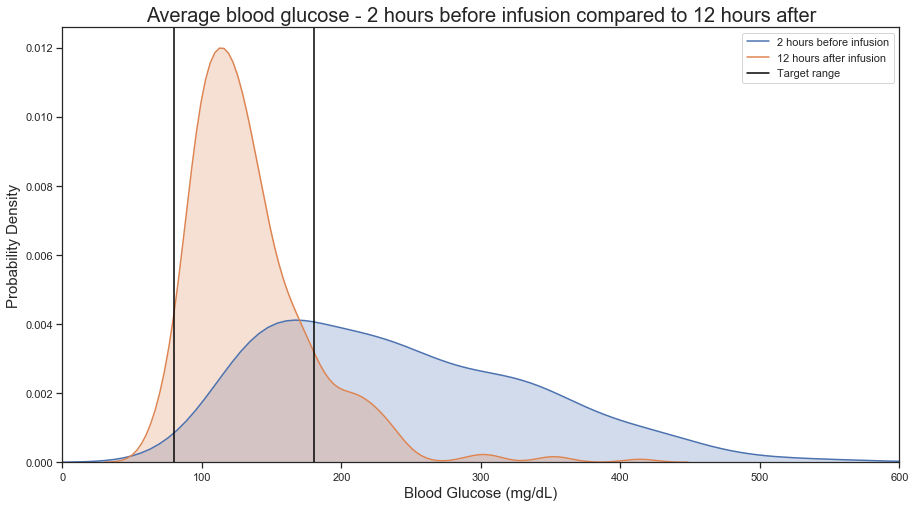

In [650]:
#plot histogram
sns.set(style="ticks")
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
ax=sns.kdeplot(hour_infusion.loc[(hour_infusion['hour']==-2)].mean_glc.values, shade=True, label="2 hours before infusion")
ax=sns.kdeplot(hour_infusion.loc[(hour_infusion['hour']==10)].mean_glc.values, shade=True, label="12 hours after infusion")
plt.title("Average blood glucose - 2 hours before infusion compared to 12 hours after", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Blood Glucose (mg/dL)", fontsize=15)
ax.axvline(x=80, label="Target range", color="black")
ax.axvline(x=180, label="", color="black")
plt.xlim(0, 600)
plt.legend()
plt.show()
fig.savefig('C:\Documents\Thesis\Figures/before_after_ins_infusion.png')


In [475]:
hour_infusion.loc[(hour_infusion['hour']==10) & (hour_infusion['mean_glc']<=180) & (hour_infusion['mean_glc']>=80)].mean_glc.count()/hour_infusion.loc[(hour_infusion['hour']==10)].mean_glc.count()

0.8295739348370927

In [476]:
hour_infusion.loc[(hour_infusion['hour']==10) & (hour_infusion['min_glc']<80)].min_glc.count()/hour_infusion.loc[(hour_infusion['hour']==10)].min_glc.count()

0.07268170426065163

In [477]:
hour_infusion.loc[(hour_infusion['hour']==10) & (hour_infusion['min_glc']<80)].min_glc.count()

29

In [478]:
hour_infusion.loc[(hour_infusion['hour']==-2)].mean_glc.mean()

243.72423371647508

In [479]:
glc_count_prior=hour_infusion.loc[hour_infusion['hour']<0].count_glc.sum()
glc_count_after=hour_infusion.loc[hour_infusion['hour']>=0].count_glc.sum()

bolus_count_prior=hour_infusion.loc[hour_infusion['hour']<0].count_bolus.sum()
bolus_count_after=hour_infusion.loc[hour_infusion['hour']>=0].count_bolus.sum()

inf_count_prior=hour_infusion.loc[hour_infusion['hour']<0].count_inf.sum()
inf_count_after=hour_infusion.loc[hour_infusion['hour']>=0].count_inf.sum()

d50_count_prior=hour_infusion.loc[hour_infusion['hour']<0].count_d50.sum()
d50_count_after=hour_infusion.loc[hour_infusion['hour']>=0].count_d50.sum()

hour_count_prior=len(hour_infusion.loc[hour_infusion['hour']<0])*2
hour_count_after=len(hour_infusion.loc[hour_infusion['hour']>=0])*2

glc_rate_prior=glc_count_prior/hour_count_prior
glc_rate_after=glc_count_after/hour_count_after
bolus_rate_prior=bolus_count_prior/hour_count_prior
bolus_rate_after=bolus_count_after/hour_count_after
inf_rate_prior=inf_count_prior/hour_count_prior
inf_rate_after=inf_count_after/hour_count_after
d50_rate_prior=d50_count_prior/hour_count_prior
d50_rate_after=d50_count_after/hour_count_after


print("Glucose measurements - Before: ", round(glc_count_prior,2), "glc   ",  round(glc_rate_prior,2), "glc/hr      After: ", round(glc_count_after,2), "glc   ",  round(glc_rate_after,2), "glc/hr")
print("Insulin boluses - Before: ", round(bolus_count_prior,2), "boluses   ",  round(bolus_rate_prior,2), "boluses/hr      After: ", round(bolus_count_after,2), "boluses   ",  round(bolus_rate_after,2), "boluses/hr")
print("Insulin infusions - Before: ", round(inf_count_prior,2), "infusions   ",  round(inf_rate_prior,2), "infusions/hr      After: ", round(inf_count_after,2), "infusions   ",  round(inf_rate_after,2), "infusions/hr")
print("D50 Boluses - Before: ", round(d50_count_prior,2), "D50:   ",  round(d50_rate_prior,2), "D50/hr      After: ", round(d50_count_after,2), "D50   ",  round(d50_rate_after,2), "D50/hr")

Glucose measurements - Before:  2025 glc    0.4 glc/hr      After:  4392 glc    0.86 glc/hr
Insulin boluses - Before:  456 boluses    0.09 boluses/hr      After:  318 boluses    0.06 boluses/hr
Insulin infusions - Before:  0 infusions    0.0 infusions/hr      After:  2212 infusions    0.43 infusions/hr
D50 Boluses - Before:  4 D50:    0.0 D50/hr      After:  11 D50    0.0 D50/hr


In [480]:
glc_count_after

4392

In [481]:
print("total infusions:", insulin_infusion.icustay.nunique())
print("infusions included in the analysis:", hour_infusion.icustay.nunique())
print("proportion included:", round(hour_infusion.icustay.nunique()/insulin_infusion.icustay.nunique(),4))

total infusions: 3566
infusions included in the analysis: 426
proportion included: 0.1195


In [482]:
#How many d50s occur during the 12 hour period before and after infusions - tricky because they are going to end beforehand
#So compare the d50s during infusion + some time afterwards with the time period before the infusion
#Comparision period is the whole time before the infusion with the whole time of the first infusion

In [483]:
# what about looking at when D50s occur - this is all hours
#find count of D50 during infusion and not
#then find total times people are on infusion and not

d50_df=dextrose_inputs.loc[dextrose_inputs.label=="Dextrose 50%"]

#start_iloc = inf_df.columns.get_loc('input_start')
#first_infusion = inf_df.iat[0, start_iloc]
icustay=0
inf_df=insulin_infusion

d50_icu_iloc = d50_df.columns.get_loc('icustay')
d50_time_iloc = d50_df.columns.get_loc('input_start')
inf_start_iloc = inf_df.columns.get_loc('input_start')
threshold_hours=1
threshold=pd.Timedelta(seconds=threshold_hours*60*60)

d50_no_inf=0
d50_inf=0

for i in range(len(d50_df)):
    icustay = d50_df.iat[i, d50_icu_iloc]
        
    d50_time = d50_df.iat[i, d50_time_iloc]
    inf_df=insulin_infusion.loc[(insulin_infusion.icustay==icustay) & ((insulin_infusion.input_end+threshold)>d50_time)]
    if len(inf_df)==0:
        d50_no_inf+=1
    elif inf_df.iat[0, inf_start_iloc] < d50_time:
        d50_inf+=1
    else:
        d50_no_inf+=1
        
    
(d50_inf, d50_no_inf)

(332, 3046)

In [484]:
#hours in icu
icu_ins_hours=admissions.loc[admissions.icustay.isin(insulin_inputs.icustay.unique())].icu_los.sum()*24
infusion_hours=insulin_infusion.length_hr.sum()+(d50_inf*threshold_hours)
no_infusion_hours=icu_ins_hours-infusion_hours

print('d50/infusion hour', d50_inf/infusion_hours)
print('d50/ no infusion hour', d50_no_inf/no_infusion_hours)

d50/infusion hour 0.0035463019387696787
d50/ no infusion hour 0.002413670490823539


## Policy alignment

In [485]:
#Infusion looks easier to do, so let's do this first
#Only need the current reading, the previous reading and the previous rate

#Turn each of the columns into lists and read from them
#Need ICU stay, time stamps, rates and values

insulin_infusion.icustay.values

#Need to go run the alignment section for infusions first

array([200061, 200061, 200061, ..., 299957, 299957, 299957], dtype=int64)

In [486]:
i_stay=0
i_start=1
i_end=2
i_rate=3
i_glc=4
pr=[0]*5
threshold = pd.Timedelta(seconds=5*60*60)
reccommend_rates=[]
new_infusion=[]
new_stay=[]
prev_rates=[]
prev_glcs=[]
i=0

for r in zip(aligned_infusions['icustay'], aligned_infusions['ins_input_start'], aligned_infusions['ins_input_end'], aligned_infusions['ins_originalrate'], aligned_infusions['glc_value']):
    #Reset rec for bug fixing
    recc=99999
    new_stay_flag=0
    
    #Check if the ICU stay is the same
    if r[i_stay] != pr[i_stay]:
        pr=[0]*5
        new_stay_flag=1
        #If it is a new ICU stay, get the prior glucose measurement
        try:
            pr[i_glc]=glc_measurements.loc[(glc_measurements['icustay']==r[i_stay]) & (glc_measurements['charttime']<r[i_start]-pd.Timedelta(seconds=62*60)), 'value'].iloc[-1]
        except(IndexError):
            pr[i_glc]=0
    #Check if there has been a break in the infusion timing
    #Only have to enter this if not a new stay (both reset infusion to zero)
    elif r[i_start] > (pr[i_end] + threshold):
            pr=list(pr)
            try:
                pr[i_glc]=glc_measurements.loc[(glc_measurements['icustay']==r[i_stay]) & (glc_measurements['charttime']<r[i_start]-pd.Timedelta(seconds=62*60)), 'value'].iloc[-1]
            except(IndexError):
                pr[i_glc]=0
    #Now move into cases based on current glucose level
    #Case for g<100
    if r[i_glc] <= 100:
        recc=0
        
    #Case for 100 < g <= 140
    elif 100 < r[i_glc] <= 140:
        if pr[i_glc] <= 100:
            recc=pr[i_rate]-1
        elif 100 < pr[i_glc] <= 180:
            recc=min(pr[i_rate]*0.75, pr[i_rate]-0.5)
        elif 180 < pr[i_glc] <= 300:
            recc=min(pr[i_rate]*0.5, pr[i_rate]-2)
        elif pr[i_glc] > 300:
            recc=min(pr[i_rate]*0.25, pr[i_rate]-2)
            
    #Case for 140 < g <= 180
    elif 140 < r[i_glc] <= 180:
        if pr[i_glc] <= 200:
            recc=pr[i_rate]
        elif pr[i_glc] > 200:
            recc=min(pr[i_rate]*0.5, pr[i_rate]-2)
        
    #Case for 180 < g <= 200
    elif 180 < r[i_glc] <= 200:
        if pr[i_glc] <= 100:
            recc=pr[i_rate]+1
        elif 100 < pr[i_glc] <= 180:
            recc=pr[i_rate]+0.5
        elif 180 < pr[i_glc] <= 200:
            recc=max(pr[i_rate]*1.25, pr[i_rate]+1)
        elif 200 < pr[i_glc] <= 250:
            recc=pr[i_rate]
        elif pr[i_glc] > 250:
            recc=min(pr[i_rate]*0.75, pr[i_rate]-2)
            
    #Case for 200 < g <= 250
    elif 200 < r[i_glc] <= 250:
        if pr[i_glc] <= 180:
            recc=max(pr[i_rate]*1.25, pr[i_rate]+2)
        elif 180 < pr[i_glc] <= 300:
            recc=max(pr[i_rate]*1.25, pr[i_rate]+1)
        elif 300 < pr[i_glc] <= 400:
            recc=pr[i_rate]+1
        elif pr[i_glc] > 400:
            recc=pr[i_rate]
            
    #Case for 250 < g <= 300
    elif 250 < r[i_glc] <= 300:
        if pr[i_glc] <= 140:
            recc=max(pr[i_rate]*1.33, pr[i_rate]+2.5)
        elif 140 < pr[i_glc] <= 180:
            recc=max(pr[i_rate]*1.25, pr[i_rate]+1.5)
        elif 180 < pr[i_glc] <= 200:
            recc=max(pr[i_rate]*1.25, pr[i_rate]+1)
        elif 200 < pr[i_glc] <= 250:
            recc=pr[i_rate]+1
        elif 250 < pr[i_glc] <= 300:
            recc=pr[i_rate]+1.5  
        elif 300 < pr[i_glc] <= 400:
            recc=max(pr[i_rate]*1.25, pr[i_rate]+2)
        elif pr[i_glc] > 400:
            recc=pr[i_rate]
            
    #Case for 300 < g <= 400
    elif 300 < r[i_glc] <= 400:
        recc=max(pr[i_rate]*1.4, pr[i_rate]+3)
    
    #Case for g>400
    elif r[i_glc] > 400:
        recc=max(pr[i_rate]*1.5, pr[i_rate]+4)
        
        
    #make sure recommendation is positive
    recc=max(recc, 0)
    
    #append rec
    reccommend_rates.append(recc)
    
    #append information on whether it is a new infusion
    if pr[i_stay]==0:
        new_infusion.append(1)
    else:
        new_infusion.append(0)
    
    #append information on whether it is a new infusion
    if new_stay_flag==1:
        new_stay.append(1)
    else:
        new_stay.append(0)
        
    #append updated information on previous rate and glc
    prev_glcs.append(pr[i_glc])
    prev_rates.append(pr[i_rate])
    
    #Update previous row to row
    pr=r
    

#     #Counter (disable for loop)
#     i+=1
#     if i > 1000:
#         break


In [487]:
recc_infusions=aligned_infusions.copy()
recc_infusions['recc_rate']=reccommend_rates
recc_infusions['new_infusion']=new_infusion
recc_infusions['new_stay']=new_stay
recc_infusions['prev_rate']=prev_rates
recc_infusions['prev_glc']=prev_glcs
recc_infusions.drop(['subject', 'hadm', 'diagnosis', 'ins_item', 'ins_ordercat',
       'ins_unit', 'ins_rateuom', 'ins_delivery', 'ins_type', 'ins_totalamount', 'ins_totalamountuom', 'ins_label',
       'glc_item', 'glc_label', 'glc_unit'], axis=1)
recc_infusions['rate_delta']=recc_infusions['recc_rate']-recc_infusions['ins_originalrate']
recc_infusions['rate_mean']=(recc_infusions['recc_rate']+recc_infusions['ins_originalrate'])/2
recc_infusions['rate_%']=recc_infusions['recc_rate']/recc_infusions['ins_originalrate']

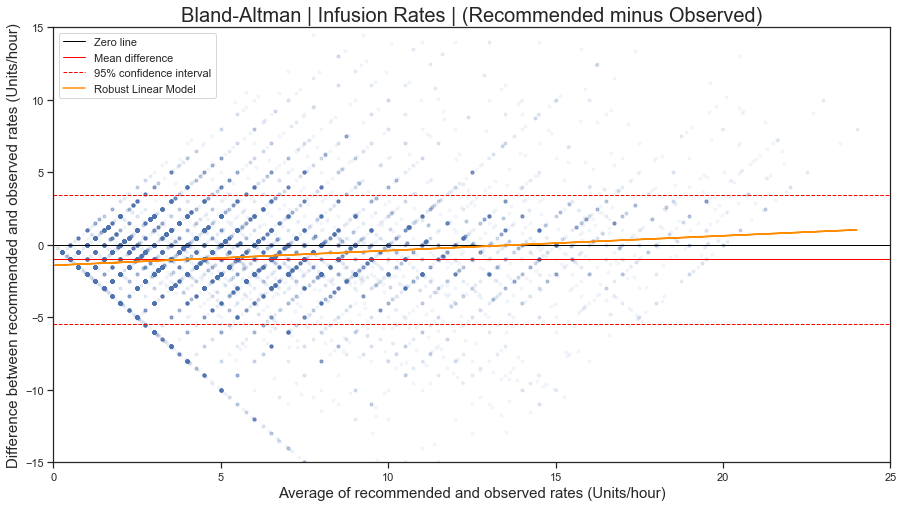

Coefficients: [intercept, gradient] = [-1.4120124   0.10194424]
Standard Errors: [intercept, gradient] = [0.01285793 0.00236895]
95% CI: [intercept, gradient] = [(-1.4372139483131665, -1.3868108611861985), (0.09730110577211486, 0.1065873758168225)]
T-test P-values: [intercept, gradient] = [0. 0.]


In [488]:
fig, robust_regr=bland_altman_plot(recc_infusions['rate_mean'], recc_infusions['rate_delta'], ' Infusion Rates | (Recommended minus Observed)', 
                                   xaxis_label="Average of recommended and observed rates (Units/hour)", yaxis_label="Difference between recommended and observed rates (Units/hour)",
                                   alpha=0.05, ymin=-15, ymax=15, xmin=0, xmax=25)

fig.savefig('C:\Documents\Thesis\Figures\inf_bland.png')

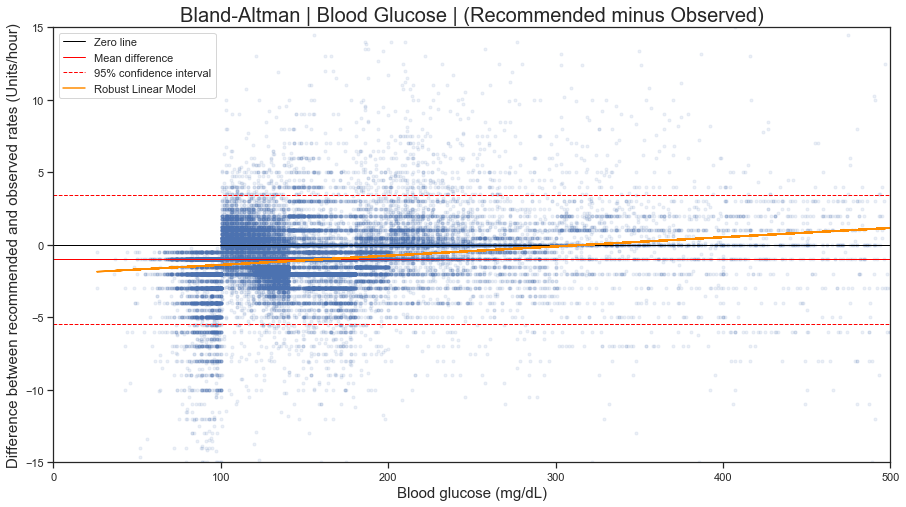

Coefficients: [intercept, gradient] = [-2.01750571  0.00636403]
Standard Errors: [intercept, gradient] = [0.02024101 0.00011655]
95% CI: [intercept, gradient] = [(-2.05717809679969, -1.9778333228766953), (0.006135598905185184, 0.006592457394410376)]
T-test P-values: [intercept, gradient] = [0. 0.]


In [489]:
fig, robust_regr=bland_altman_plot(recc_infusions['glc_value'], recc_infusions['rate_delta'], ' Blood Glucose | (Recommended minus Observed)', 
                                   xaxis_label="Blood glucose (mg/dL)", yaxis_label="Difference between recommended and observed rates (Units/hour)",
                                   alpha=0.1, ymin=-15, ymax=15, xmin=0, xmax=500)

fig.savefig('C:\Documents\Thesis\Figures\inf_glucose_bland.png')

In [490]:
len(hypo_icustays)

15

In [491]:
insulin_infusion.icustay.nunique()

3566

In [566]:
recc_infusions.loc[(recc_infusions['glc_value']<80)].icustay.nunique()/insulin_infusion.icustay.nunique()

0.12310712282669659

In [565]:
hypo_icustays=recc_infusions.loc[(recc_infusions['glc_value']<80) & (recc_infusions['ins_rate']>10)].icustay.unique()
d50_df=dextrose_inputs.loc[dextrose_inputs.label=="Dextrose 50%"]
d50_df.loc[d50_df['icustay'].isin(hypo_icustays)]

,icustay,icu_admit,icu_discharge,subject,hadm,diagnosis,item,ordercat,input_start,input_end,...,originalrate,status,label,icu_time,concentration,delivery,length_hr,raw_amount,dxt_rate,dxt_amount
33161,206662,2190-12-20 00:31:17,2191-01-05 18:05:55,99260,181010,HYPERGLYCEMIA,220952,05-Med Bolus,2190-12-20 18:02:00,2190-12-20 18:03:00,...,25.0,FinishedRunning,Dextrose 50%,0 days 17:30:43,0.5,Bolus,NaN,NaN,NaN,12.5
33162,206662,2190-12-20 00:31:17,2191-01-05 18:05:55,99260,181010,HYPERGLYCEMIA,220952,05-Med Bolus,2190-12-20 19:32:00,2190-12-20 19:33:00,...,25.0,FinishedRunning,Dextrose 50%,0 days 19:00:43,0.5,Bolus,NaN,NaN,NaN,12.5
33167,206662,2190-12-20 00:31:17,2191-01-05 18:05:55,99260,181010,HYPERGLYCEMIA,220952,05-Med Bolus,2190-12-21 19:07:00,2190-12-21 19:08:00,...,25.0,FinishedRunning,Dextrose 50%,1 days 18:35:43,0.5,Bolus,NaN,NaN,NaN,12.5
33205,206662,2190-12-20 00:31:17,2191-01-05 18:05:55,99260,181010,HYPERGLYCEMIA,220952,05-Med Bolus,2191-01-03 05:34:00,2191-01-03 05:35:00,...,25.0,FinishedRunning,Dextrose 50%,14 days 05:02:43,0.5,Bolus,NaN,NaN,NaN,12.5
74037,214123,2163-05-03 10:04:53,2163-05-08 16:33:15,46474,132423,THORACOABDOMINAL ANEURYSM/SDA,220952,05-Med Bolus,2163-05-04 03:13:00,2163-05-04 03:14:00,...,25.0,FinishedRunning,Dextrose 50%,0 days 17:08:07,0.5,Bolus,NaN,NaN,NaN,12.5
74194,214170,2104-06-03 03:27:27,2104-06-19 19:02:47,81475,101662,ASTHMA;COPD EXACERBATION,220952,05-Med Bolus,2104-06-09 12:55:00,2104-06-09 12:56:00,...,50.0,FinishedRunning,Dextrose 50%,6 days 09:27:33,0.5,Bolus,NaN,NaN,NaN,25.0
74196,214170,2104-06-03 03:27:27,2104-06-19 19:02:47,81475,101662,ASTHMA;COPD EXACERBATION,220952,05-Med Bolus,2104-06-09 16:54:00,2104-06-09 16:55:00,...,25.0,FinishedRunning,Dextrose 50%,6 days 13:26:33,0.5,Bolus,NaN,NaN,NaN,12.5
74203,214170,2104-06-03 03:27:27,2104-06-19 19:02:47,81475,101662,ASTHMA;COPD EXACERBATION,220952,05-Med Bolus,2104-06-10 00:30:00,2104-06-10 00:31:00,...,50.0,FinishedRunning,Dextrose 50%,6 days 21:02:33,0.5,Bolus,NaN,NaN,NaN,25.0
128032,225260,2107-01-29 11:30:58,2107-02-06 14:45:35,89906,197164,PE,220952,05-Med Bolus,2107-01-30 18:47:00,2107-01-30 18:48:00,...,10.0,FinishedRunning,Dextrose 50%,1 days 07:16:02,0.5,Bolus,NaN,NaN,NaN,5.0
128041,225260,2107-01-29 11:30:58,2107-02-06 14:45:35,89906,197164,PE,220952,05-Med Bolus,2107-01-31 17:05:00,2107-01-31 17:06:00,...,25.0,FinishedRunning,Dextrose 50%,2 days 05:34:02,0.5,Bolus,NaN,NaN,NaN,12.5


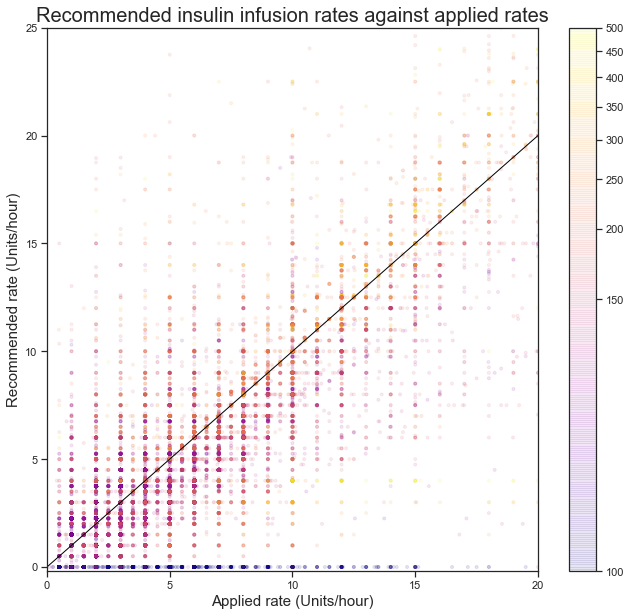

In [493]:
fig, ax = plt.subplots(1, 1, figsize = (11, 10))
norm=colors.PowerNorm(gamma=1./3., vmin=100, vmax=500)
plt.scatter(recc_infusions['ins_originalrate'], recc_infusions['recc_rate'], marker='.',c=(recc_infusions['glc_value']), cmap='plasma', norm=norm, alpha=0.1)
plt.plot([0, 100], [0, 100], color="black", linewidth=1)
plt.title("Recommended insulin infusion rates against applied rates", fontsize=20)
plt.ylabel("Recommended rate (Units/hour)", fontsize=15)
plt.xlabel("Applied rate (Units/hour)", fontsize=15)
plt.colorbar()
plt.xlim(0, 20)
plt.xticks(np.arange(0,25,5), np.arange(0,25,5))
plt.ylim(-0.2, 25)
plt.show()

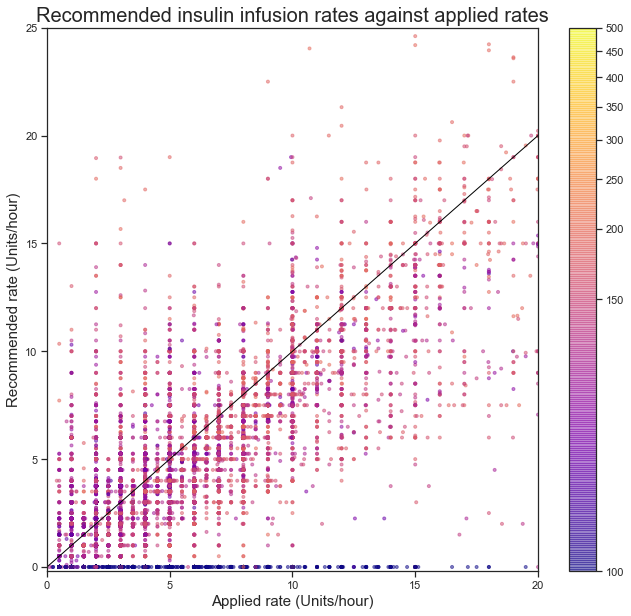

In [494]:
fig, ax = plt.subplots(1, 1, figsize = (11, 10))
norm=colors.PowerNorm(gamma=1./3., vmin=100, vmax=500)
plt.scatter(recc_infusions.loc[recc_infusions.glc_value<200, 'ins_originalrate'], recc_infusions.loc[recc_infusions.glc_value<200, 'recc_rate'], marker='.',c=(recc_infusions.loc[recc_infusions.glc_value<200, 'glc_value']), cmap='plasma', norm=norm, alpha=0.5)
plt.plot([0, 100], [0, 100], color="black", linewidth=1)
plt.title("Recommended insulin infusion rates against applied rates", fontsize=20)
plt.ylabel("Recommended rate (Units/hour)", fontsize=15)
plt.xlabel("Applied rate (Units/hour)", fontsize=15)
plt.colorbar()
plt.xlim(0, 20)
plt.xticks(np.arange(0,25,5), np.arange(0,25,5))
plt.ylim(-0.2, 25)
plt.show()

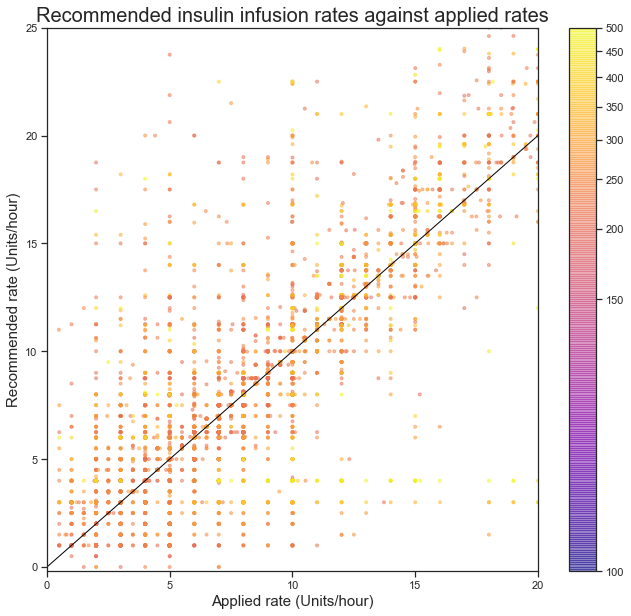

In [495]:
fig, ax = plt.subplots(1, 1, figsize = (11, 10))
norm=colors.PowerNorm(gamma=1./3., vmin=100, vmax=500)
plt.scatter(recc_infusions.loc[recc_infusions.glc_value>=200, 'ins_originalrate'], recc_infusions.loc[recc_infusions.glc_value>=200, 'recc_rate'], marker='.',c=(recc_infusions.loc[recc_infusions.glc_value>=200, 'glc_value']), cmap='plasma', norm=norm, alpha=0.5)
plt.plot([0, 100], [0, 100], color="black", linewidth=1)
plt.title("Recommended insulin infusion rates against applied rates", fontsize=20)
plt.ylabel("Recommended rate (Units/hour)", fontsize=15)
plt.xlabel("Applied rate (Units/hour)", fontsize=15)
plt.colorbar()
plt.xlim(0, 20)
plt.xticks(np.arange(0,25,5), np.arange(0,25,5))
plt.ylim(-0.2, 25)
plt.show()

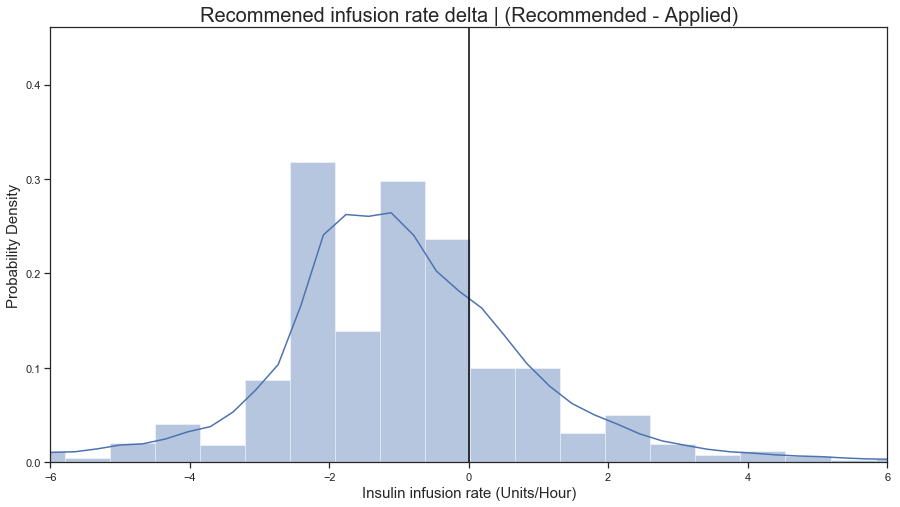

In [496]:
fig, ax = plt.subplots(1, 1, figsize = (15, 8))
sns.kdeplot(recc_infusions['rate_delta'], shade=False, label="", bw=0.4)
sns.distplot(recc_infusions['rate_delta'].values.tolist(), kde=True, bins=60, color=sns.color_palette('deep')[0], kde_kws={"alpha": 0})
ax.axvline(x=0, label="Mean use", color="black")
plt.title("Recommened infusion rate delta | (Recommended - Applied)", fontsize=20)
plt.ylabel("Probability Density", fontsize=15)
plt.xlabel("Insulin infusion rate (Units/Hour)", fontsize=15)
plt.xlim(-6, 6)
plt.show()

In [497]:
#Can we use a decision tree to work out what the prediction was?
#The previous rates are inhereted because the loop allowed us to look up old rates, set (not actual) rates are used
DT_infusions=recc_infusions.loc[:, ['ins_rate', 'glc_value', 'recc_rate', 'prev_rate', 'prev_glc']]

DT_infusions

,ins_rate,glc_value,recc_rate,prev_rate,prev_glc
icu_time,,,,,
0 days 07:21:14,2.000000,269.0,1.000000,0.000000,235.0
0 days 08:21:14,2.999485,234.0,3.000000,2.000000,269.0
0 days 09:22:14,5.000028,292.0,4.000000,3.000000,234.0
0 days 10:26:14,6.997410,271.0,6.500000,5.000000,292.0
0 days 11:23:14,7.997040,230.0,8.750000,7.000000,271.0
0 days 12:19:14,8.992655,225.0,10.000000,8.000000,230.0
0 days 13:23:14,9.981617,206.0,11.250000,9.000000,225.0
0 days 14:26:14,11.992565,202.0,12.500000,10.000000,206.0
0 days 16:36:14,15.454667,164.0,6.000000,12.000000,202.0


In [498]:
from sklearn.model_selection import train_test_split
from sklearn import tree
from IPython.display import Image
from sklearn import metrics
import pydotplus

(train_df, val_df)=train_test_split(DT_infusions, test_size=0.5)
(val_df, test_df)=train_test_split(val_df, test_size=0.4)

In [499]:
X_train=train_df.drop(['recc_rate', 'ins_rate'], axis=1)
X_val=val_df.drop(['recc_rate', 'ins_rate'], axis=1)
X_test=test_df.drop(['recc_rate', 'ins_rate'], axis=1)

y_app_train=train_df['ins_rate']
y_app_val=val_df['ins_rate']
y_app_test=test_df['ins_rate']

y_recc_train=train_df['recc_rate']
y_recc_val=val_df['recc_rate']
y_recc_test=test_df['recc_rate']

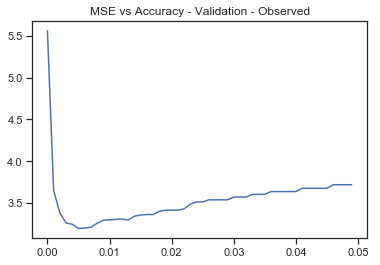

Best scoring impurity decrease: 0.005


In [500]:
#Find impurity decrease for the observed values

mse_list=[]
imp_decrease_list=np.arange(0, 0.05, 0.001)

for imp_decrease in imp_decrease_list:
    DT_model_app = tree.DecisionTreeRegressor(min_impurity_decrease=imp_decrease)
    DT_model_app = DT_model_app.fit(X_train,y_app_train)
    y_app_pred=DT_model_app.predict(X_val)
    mse=metrics.mean_squared_error(y_app_pred, y_app_val)
    mse_list.append(mse)
    #print('Min Impurity Decrease:', round(imp_decrease, 3), '   MSE:', round(mse,3))

plt.plot(imp_decrease_list, mse_list)
plt.title('MSE vs Accuracy - Validation - Observed')
plt.show()

#find the minimum 
mse_list=np.asarray(mse_list)
min_index=np.argmin(mse_list)
best_imp_decrease=imp_decrease_list[min_index]
print("Best scoring impurity decrease:", best_imp_decrease)

Validation MSE: 3.245066104015414
Test MSE: 3.174185714308104
Test MAE: 1.1656610153504665
Test R^2 of rate difference 0.09388681822412592


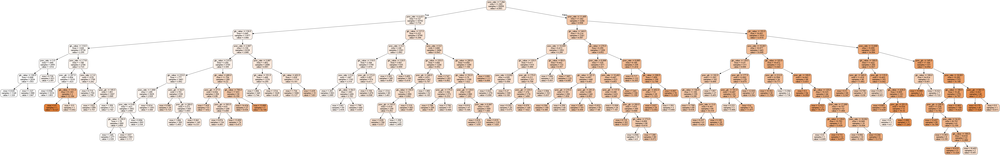

In [501]:
DT_model_app = tree.DecisionTreeRegressor(min_impurity_decrease=0.004)
DT_model_app = DT_model_app.fit(X_train,y_app_train)

tree_graph = tree.export_graphviz(DT_model_app, out_file=None, feature_names=X_train.columns,
                             filled=True, rounded=True)
graph = pydotplus.graphviz.graph_from_dot_data(tree_graph)


y_app_pred_val=DT_model_app.predict(X_val)
val_mse=metrics.mean_squared_error(y_app_pred_val, y_app_val)
print("Validation MSE:", val_mse)

y_app_pred_test=DT_model_app.predict(X_test)
test_mse=metrics.mean_squared_error(y_app_pred_test, y_app_test)
test_mae=metrics.mean_absolute_error(y_app_pred_test, y_app_test)
print("Test MSE:", test_mse)
print("Test MAE:", test_mae)

#work out R^2 difference
predicted_diff_app=y_app_pred_test-X_test['prev_rate']
observed_diff_app=y_app_test-X_test['prev_rate']
r2_diff_app=metrics.r2_score(predicted_diff_app, observed_diff_app)
print("Test R^2 of rate difference", r2_diff_app)


Image(graph.create_png())


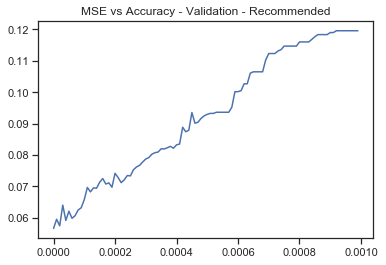

Best scoring impurity decrease: 0.0


In [502]:
#Find impurity decrease for the recommended values
#Find impurity decrease for the observed values

mse_list=[]
imp_decrease_list=np.arange(0, 0.001, 0.00001)

for imp_decrease in imp_decrease_list:
    DT_model_recc = tree.DecisionTreeRegressor(min_impurity_decrease=imp_decrease)
    DT_model_recc = DT_model_recc.fit(X_train,y_recc_train)
    y_recc_pred=DT_model_recc.predict(X_val)
    mse=metrics.mean_squared_error(y_recc_pred, y_recc_val)
    mse_list.append(mse)
    #print('Min Impurity Decrease:', round(imp_decrease, 3), '   MSE:', round(mse,3))

plt.plot(imp_decrease_list, mse_list)
plt.title('MSE vs Accuracy - Validation - Recommended')
plt.show()

#find the minimum 
mse_list=np.asarray(mse_list)
min_index=np.argmin(mse_list)
best_imp_decrease=imp_decrease_list[min_index]
print("Best scoring impurity decrease:", best_imp_decrease)

In [503]:
DT_model_recc = tree.DecisionTreeRegressor(min_impurity_decrease=0.0001)
DT_model_recc = DT_model_recc.fit(X_train,y_recc_train)

tree_graph = tree.export_graphviz(DT_model_recc, out_file=None, feature_names=X_train.columns,
                             filled=True, rounded=True)
graph = pydotplus.graphviz.graph_from_dot_data(tree_graph)


y_recc_pred_val=DT_model_recc.predict(X_val)
val_mse=metrics.mean_squared_error(y_recc_pred_val, y_recc_val)
print("Validation MSE:", val_mse)

y_recc_pred_test=DT_model_recc.predict(X_test)
test_mse=metrics.mean_squared_error(y_recc_pred_test, y_recc_test)
test_mae=metrics.mean_absolute_error(y_recc_pred_test, y_recc_test)
print("Test MSE:", test_mse)
print("Test MAE:", test_mae)

#work out R^2 difference
predicted_diff_recc=y_recc_pred_test-X_test['prev_rate']
observed_diff_recc=y_recc_test-X_test['prev_rate']
r2_diff_recc=metrics.r2_score(predicted_diff_recc, observed_diff_recc)
print("Test R^2 of rate difference", r2_diff_recc)

Image(graph.create_png())

Validation MSE: 0.06967298499936078
Test MSE: 0.059820362665555044
Test MAE: 0.052886978639123935
Test R^2 of rate difference 0.9901496595959767


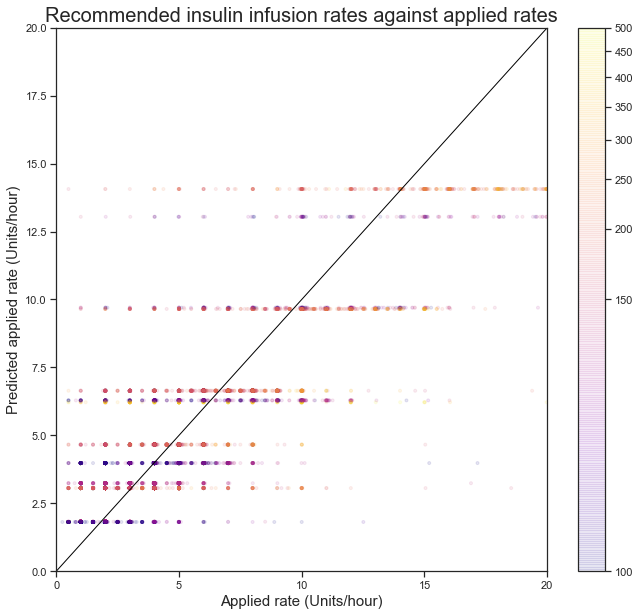

In [504]:
fig, ax = plt.subplots(1, 1, figsize = (11, 10))
norm=colors.PowerNorm(gamma=1./3., vmin=100, vmax=500)
plt.scatter(y_app_val, y_app_pred, marker='.',c=(X_val['glc_value']), cmap='plasma', norm=norm, alpha=0.1)
plt.plot([0, 100], [0, 100], color="black", linewidth=1)
plt.title("Recommended insulin infusion rates against applied rates", fontsize=20)
plt.ylabel("Predicted applied rate (Units/hour)", fontsize=15)
plt.xlabel("Applied rate (Units/hour)", fontsize=15)
plt.colorbar()
plt.ylim(0, 20)
plt.xticks(np.arange(0,25,5), np.arange(0,25,5))
plt.xlim(0, 20)
plt.show()

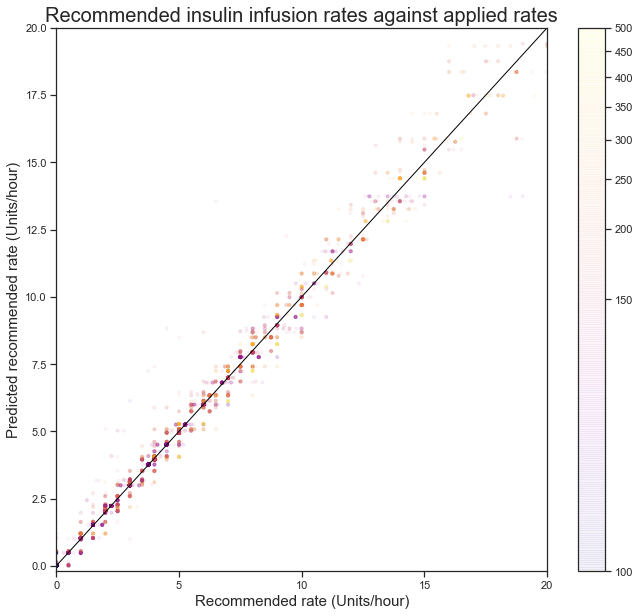

In [505]:
fig, ax = plt.subplots(1, 1, figsize = (11, 10))
norm=colors.PowerNorm(gamma=1./3., vmin=100, vmax=500)
plt.scatter(y_recc_val, y_recc_pred, marker='.',c=(X_val['glc_value']), cmap='plasma', norm=norm, alpha=0.05)
plt.plot([0, 100], [0, 100] , color="black", linewidth=1)
plt.title("Recommended insulin infusion rates against applied rates", fontsize=20)
plt.ylabel("Predicted recommended rate (Units/hour)", fontsize=15)
plt.xlabel("Recommended rate (Units/hour)", fontsize=15)
plt.colorbar()
plt.xlim(0, 20)
plt.xticks(np.arange(0,25,5), np.arange(0,25,5))
plt.ylim(-0.2, 20)
plt.show()

In [506]:
recc_infusions['rate_delta'].abs().mean()

1.7868718831219284

In [507]:
recc_infusions[['ins_originalrate', 'recc_rate', 'prev_rate', 'rate_delta']]

,ins_originalrate,recc_rate,prev_rate,rate_delta
icu_time,,,,
0 days 07:21:14,2.000000,1.000000,0.000000,-1.000000
0 days 08:21:14,3.000000,3.000000,2.000000,0.000000
0 days 09:22:14,5.000000,4.000000,3.000000,-1.000000
0 days 10:26:14,7.000000,6.500000,5.000000,-0.500000
0 days 11:23:14,8.000000,8.750000,7.000000,0.750000
0 days 12:19:14,9.000000,10.000000,8.000000,1.000000
0 days 13:23:14,10.000000,11.250000,9.000000,1.250000
0 days 14:26:14,12.000000,12.500000,10.000000,0.500000
0 days 16:36:14,15.504803,6.000000,12.000000,-9.504803


In [508]:
(recc_infusions['ins_originalrate']-recc_infusions['prev_rate']).abs().mean()

1.8990314071532888

In [509]:
(recc_infusions['recc_rate']-recc_infusions['prev_rate']).abs().mean()

1.5910141155498172